# Setting

## Library

In [1]:
import pandas as pd
import numpy as np
import math

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import random
import os
from tqdm.notebook import tqdm

In [4]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [5]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score # 정확도
from sklearn.metrics import precision_score # 정밀도
from sklearn.metrics import recall_score # 재현율
from sklearn.metrics import f1_score # F1-Score
from sklearn.metrics import confusion_matrix

## Seed

In [6]:
def my_seed_everywhere(seed):
    random.seed(seed) # random
    np.random.seed(seed) # numpy
    os.environ["PYTHONHASHSEED"] = str(seed) # os
    print(f'고정된 Seed : {seed}')

In [7]:
my_seed_everywhere(42)

고정된 Seed : 42


# Data Set

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
path_file = '/content/drive/MyDrive/UNIST/AICP/data/dynmom_dat.csv'

df = pd.read_csv(path_file)

# Preprocessing

In [10]:
def preprocessing(data, drop=None):
  # 'DATE'를 칼럼 대신 인덱스로 사용
  data.index = data['DATE']
  data = data.drop(columns='DATE')
  print("'DATE'를 칼럼 대신 인덱스로 사용")

  # 결측치 제거 및 모델 학습에 불필요한 칼럼 제거
  data = data.dropna()
  data = data.drop(columns=['winner', 'loser', 'form_date'])
  print("결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')")

  if drop != None:
    D = ', '.join(drop)
    data = data.drop(columns=drop)
    print(f"훈련에 제외된 변수 들 : {D}")

  return data

In [11]:
df.columns

Index(['DATE', 'winner', 'loser', 'wml', 'mvol_cum6', 'mvol_t_1', 'mvol_t_2',
       'mvol_t_3', 'mvol_t_4', 'mvol_t_5', 'mvol_t_6', 'form_date',
       'cum_loser', 'cum_winner', 'cum_loser_t_2_4', 'cum_winner_t_2_4',
       'cum_loser_t_5_8', 'cum_winner_t_5_8', 'cum_loser_t_9_12',
       'cum_winner_t_9_12'],
      dtype='object')

In [12]:
drop = ['mvol_cum6', 'mvol_t_1', 'mvol_t_2',
       'mvol_t_3', 'mvol_t_4', 'mvol_t_5', 'mvol_t_6']
df = preprocessing(df, drop)

'DATE'를 칼럼 대신 인덱스로 사용
결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')
훈련에 제외된 변수 들 : mvol_cum6, mvol_t_1, mvol_t_2, mvol_t_3, mvol_t_4, mvol_t_5, mvol_t_6


In [13]:
def normal_wml(df):
  print("'wml'이 양수면 1 & 음수면 0")
  print("Output : 'Preprocessed_Data' & 'WML'")
  print()

  cond_wml = (df['wml']>=0)
  df.loc[cond_wml, 'pos_wml'] = 1
  df.loc[~cond_wml, 'pos_wml'] = 0
  WML = df[['wml']]

  df.drop(columns=['wml'], inplace=True)

  POS_WML = df['pos_wml'].value_counts()
  print(f'Ratio : {POS_WML[0]/POS_WML[1]}')
  print(POS_WML)

  return df, WML

In [14]:
dynmom, WML = normal_wml(df)

'wml'이 양수면 1 & 음수면 0
Output : 'Preprocessed_Data' & 'WML'

Ratio : 0.5634379263301501
1.0    733
0.0    413
Name: pos_wml, dtype: int64


# Modeling

In [15]:
def Roling_Windows(data, window_size, method, model, model_name, plot=True, plot_feature=True):

  # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
  result_dict = {
    'TRAIN_START_DATE':[],
    'TRAIN_END_DATE':[],
    'TEST_DATE':[],
    'Actual_POS_WML':[],
    f'{model_name}_PRED_POS_WML':[],
    f'{model_name}_PROB_POS_WML':[]
  }

  df_feature = pd.DataFrame()

  # 모델 학습이 종료되는 지점 설정
  end = data.shape[0] - window_size

  print('*'*50)
  print(f'\n{model_name} Model의 Rolling {method} Window를 실행합니다\n')
  print('설정된 Model의 하이퍼파리미터 : \n')
  for p, v in zip(model.get_params(deep=True).keys(), model.get_params(deep=True).values()):
    print(f'   {p} : {v}')
  print()
  print('*'*50)

  for i in tqdm(range(end)):

    # 모델 학습 중지
    if i == end:
      print('Prediction using machine learning has ended.')
      break
    
    # Rolling Fixed Window
    if method == 'Fixed':
      MODEL = model
      train = data.iloc[0+i:window_size+i]

    # Rolling Expanding Window
    elif method == 'Expanding':
      MODEL = model
      train = data.iloc[0:window_size+i]
    
    # 'method' 잘못입력한 경우
    else:
      print("Make sure to set the method to either 'Fixed' or 'Expanding'.")
      break
    
    # 테스트 데이터 설정
    test = data.iloc[[window_size+i]]

    # Features와 Target 구분
    X_train = train.drop(columns=['pos_wml'])
    y_train = train['pos_wml']

    X_test = test.drop(columns=['pos_wml'])
    y_test = test['pos_wml'] 

    # 모델 학습 및 추론
    MODEL.fit(X_train, y_train)
    pred_test = MODEL.predict(X_test)
    prob_test = MODEL.predict_proba(X_test)

    # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
    result_dict['TRAIN_START_DATE'].append(train.index[0])
    result_dict['TRAIN_END_DATE'].append(train.index[-1])
    result_dict['TEST_DATE'].append(test.index[0])

    result_dict['Actual_POS_WML'].append(list(y_test)[0])
    result_dict[f'{model_name}_PRED_POS_WML'].append(pred_test[0])
    result_dict[f'{model_name}_PROB_POS_WML'].append(prob_test[0][-1])

    # 트리 기반 모델 (사이킷런)의 Feature Importance 정보 수집
    feature_importances = MODEL.feature_importances_
    df_ft_importance = pd.DataFrame(feature_importances, index = X_train.columns).T
    df_ft_importance.index = y_test.index
    df_feature = pd.concat([df_feature, df_ft_importance])

  result = pd.DataFrame(result_dict)
  result.index = df_feature.index

  result = pd.concat([result, df_feature], axis=1)
  result = result.set_index('TEST_DATE')
  
  # 모델 성능 시각화
  if plot == True:
    plot_result(result, method, model_name)
  
  # 모델의 변수 중요도 시각화
  if plot_feature == True:
    plot_feature_importances(result, model_name)
    print()

  # 학습 및 테스트 데이터 정보, 실제값과 예측값 정보, 변수 중요도 정보
  return result

In [16]:
def plot_result(data, method, model_name):
  print('\nPerformance results of the model\n')

  # Confusion Matrix & etc
  print(classification_report(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML']))

  # Accuracy, Precision, Recall, F1 Score
  accuracy = accuracy_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  precision = precision_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  recall = recall_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  F1_score = f1_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])

  print(f'\naccuracy : {accuracy}')
  print(f'\nprecision : {precision}')
  print(f'\nrecall : {recall}')
  print(f'\nF1-Score : {F1_score}\n')
  
  # Visualization Confusion Matrix
  confusion = confusion_matrix(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  sns.heatmap(confusion, annot=True, fmt='g')
  plt.title(f'Performance results {method} of the {model_name} model')
  
  plt.show()

In [17]:
def plot_feature_importances(data, model_name):

  data = data.drop(columns=['TRAIN_START_DATE', 'TRAIN_END_DATE', 'Actual_POS_WML',
                           f'{model_name}_PRED_POS_WML', f'{model_name}_PROB_POS_WML'])

  print('\nFeature Importance of the model\n')

  # 날짜 별 Feature Importance 변화 추이
  plt.figure(figsize=(15, 5))
  for col in data.columns:

    sns.lineplot(data=data,
                x=data.index,
                y=col,
                label=col,
                alpha=0.3)
    
    plt.title('Feature importances using MDI')
    plt.xlabel('DATE')
    plt.ylabel('Mean decrease in impurity')
    plt.xticks([data.index[i] for i in range(0,len(data.index), 12)])
    plt.tick_params(axis='x',
                      direction='out',
                      labelrotation=45,
                      length=1,
                      pad=10,
                      labelsize=5,
                      width=0.1)
  plt.show()

  # 각 변수 별 Feature Importance 통계값
  MEAN = display_feature_importance(data, method='mean')
  MAX = display_feature_importance(data, method='max')
  MIN = display_feature_importance(data, method='min')

  plt.figure(figsize=(15, 5))
  sns.barplot(data=MEAN,
              y=MEAN.index,
              x='mean_Feature_Importance')

  plt.show()
  print()

  FEATURE_IMPORTANCE = pd.concat([MEAN, MAX, MIN], axis=1)
  display(FEATURE_IMPORTANCE)

In [18]:
def display_feature_importance(data, method):
       
    feature_dict = {}
    for col in data.columns:
      if method=='mean':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].mean())

      if method=='max':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].max())
      
      if method=='min':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].min())
    
    feature_df = pd.DataFrame(feature_dict).T
    feature_df.columns = [method+'_'+'Feature_Importance']
    feature_df=feature_df.sort_values(by=method+'_'+'Feature_Importance', ascending=False)

    return feature_df

In [19]:
def slice_feature_importance(data, num, method, model_name):

  if type(num) != bool:
    division = int(data.shape[0]/num)
    
    for i in range(num):

      if i == num-1:
        sliced_data = data.iloc[i*division:]

      else:
        sliced_data = data.iloc[i*division:(i+1)*division]

      start = sliced_data.index[0]
      end = sliced_data.index[-1]

      print()
      print('*'*50)
      print(f'\nDATE : {start} ~ {end}\n')
      print('*'*50)
      print()
      
      plot_result(sliced_data, method, model_name)
      plot_feature_importances(sliced_data, model_name)
  
  else:
    start = input('Start Date (ex: 20200131): ')
    end = input('Start Date (ex: 20221230): ')
    print('*'*50)
    print(f'\nDate : {start} ~ {end}\n')
    print('*'*50)
    print()

    sliced_data = data.loc[start:end]
    plot_result(sliced_data, method, model_name)
    plot_feature_importances(sliced_data)

In [20]:
def cumm_return_by_dynamic(data, wml, weight, A0_P1, A1_P0,  plot=True):

  start_index = data.index[0]
  wml = wml.loc[start_index:]

  df = pd.DataFrame(wml['wml'] * data[weight])
  df.columns = ['cum_return']
  df['cum_return'] = (1 + df.cum_return).cumprod() - 1 
  
  S = df['cum_return'].mean()/df['cum_return'].std()

  print('Sharpe Ratio : {:0.5f}\n'.format(S))

  print('최근 누적 수익률\n')
  latly_10 = df.sort_index(ascending=False).head(5)
  for i, r in zip(latly_10.index, latly_10['cum_return']):
    i = str(i)
    print('  {}년-{}월 -> {:0.2f}'.format(i[:4], i[4:6], r))

  print('\n누적 수익률 가장 높았던 순간 Top 10\n')
  top_10 = df.sort_values(by='cum_return', ascending=False).head(10)
  rank = 1
  for i, r in zip(top_10.index, top_10['cum_return']):
    i = str(i)
    print('  {}등 : {}년-{}월 -> {:0.2f}'.format(rank, i[:4], i[4:6], r))
    rank += 1
  print()

  TEST_WML = wml.copy()
  TEST_WML['wml'] = (1 + TEST_WML.wml).cumprod() - 1
  TEST_WML.columns = ['cum_return'] 

  if plot == True:

    plt.figure(figsize=(13, 6))
    sns.lineplot(data=df, x=df.index, y=df['cum_return'], label='With_ML')
    sns.lineplot(data=TEST_WML, x=TEST_WML.index, y=TEST_WML['cum_return'], label='Original')
    plt.xticks([df.index[i] for i in range(0,len(df.index), 12)])
    plt.tick_params(axis='x',
                    direction='out',
                    labelrotation=45,
                    length=1,
                    pad=10,
                    labelsize=5,
                    width=5)
    for i in A0_P1:
      plt.vlines(i, -80000, 0, color='pink', linewidth=0.4, alpha=1)

    for i in A1_P0:
      plt.vlines(i, 80000, 0, color='pink', linewidth=0.4, alpha=1)

    plt.legend(fontsize=10)
    plt.show() 

  return df

In [21]:
def What_Pred(data, WML, model_name):

  start_index = data.index[0]
  WML = WML.loc[start_index:]
  WML.index.name = 'TEST_DATE'

  Q1 = WML.quantile(0.25)
  Q3 = WML.quantile(0.75)
  IQR = Q3 - Q1

  Upper = Q3 + (1.5*IQR)
  Lower = Q1 - (1.5*IQR)

  print('\nIQR 기준 WML 이상치 (Maximum 미만) 개수\n')

  cond_U = (WML['wml']>Upper[0])  
  WML_U = WML.loc[cond_U]
  
  print(f'Number of Outlier by IQR (Maximum) : {WML_U.shape[0]}')
  print(f'Maximum by IQR : {Upper[0]}')
  print(f"Max Outlier : {WML_U['wml'].max()}")
  print(f"Min Outlier : {WML_U['wml'].min()}")

  Result = pd.concat([data, WML],axis=1)
  Result = Result[['Actual_POS_WML', f'{model_name}_PRED_POS_WML', 'wml']]

  cond_1 = (Result['Actual_POS_WML'] == 1) & (Result[f'{model_name}_PRED_POS_WML'] == 1)
  R_1 = Result.loc[cond_1]
  print('\nACTUAL = PRED = 1\n')
  sns.boxplot(data=R_1, x='wml')
  plt.show()
  display(R_1[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  print('\nIQR 기준 WML 이상치 (Minimum 미만) 개수\n')

  cond_L = (WML['wml']<Lower[0])  
  WML_L = WML.loc[cond_L]
  
  print(f'Number of Outlier by IQR (Minimum) : {WML_L.shape[0]}')
  print(f'Minimun by IQR : {Lower[0]}')
  print(f"Max Outlier : {WML_L['wml'].max()}")
  print(f"Min Outlier : {WML_L['wml'].min()}")

  Result = pd.concat([data, WML],axis=1)
  Result = Result[['Actual_POS_WML', f'{model_name}_PRED_POS_WML', 'wml']]

  cond_0 = (Result['Actual_POS_WML'] == 0) & (Result[f'{model_name}_PRED_POS_WML'] == 0)
  R_0 = Result.loc[cond_0]
  print('\nACTUAL = PRED = 0\n')
  sns.boxplot(data=R_0, x='wml')
  plt.show()
  display(R_0[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  cond_0_1 = (Result['Actual_POS_WML'] == 0) & (Result[f'{model_name}_PRED_POS_WML'] == 1)
  R_0_1 = Result.loc[cond_0_1]
  print('\nACTUAL = 0 &  PRED = 1\n')
  sns.boxplot(data=R_0_1, x='wml')
  plt.show()
  sns.barplot(data=R_0_1.sort_values(by='wml', ascending=True), x=R_0_1.index, y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  display(R_0_1[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  cond_1_0 = (Result['Actual_POS_WML'] == 1) & (Result[f'{model_name}_PRED_POS_WML'] == 0)
  R_1_0 = Result.loc[cond_1_0]
  print('\nACTUAL = 1 &  PRED = 0\n')
  sns.boxplot(data=R_1_0, x='wml')
  plt.show()
  sns.barplot(data=R_1_0.sort_values(by='wml', ascending=True), x=R_1_0.index, y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  display(R_1_0[['wml']].describe().T)

  return list(R_0_1.index), list(R_1_0.index)

## Rolling Fixed Windows

### Random Forest

In [22]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

**************************************************

RDF Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.19      0.24       316
         1.0       0.65      0.82      0.72       590

    accuracy                           0.60       906
   macro avg       0.50      0.50      0.48       906
weighted avg       0.55      0.60      0.56       906


accuracy : 0.5960264900662252

precision : 0.6517615176151762

recall : 0.8152542372881356

F1-Score : 0.7243975903614459



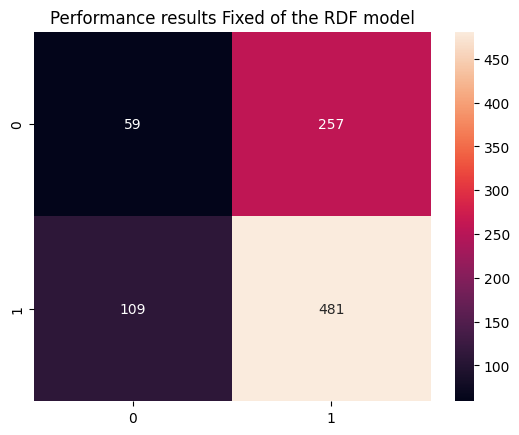


Feature Importance of the model



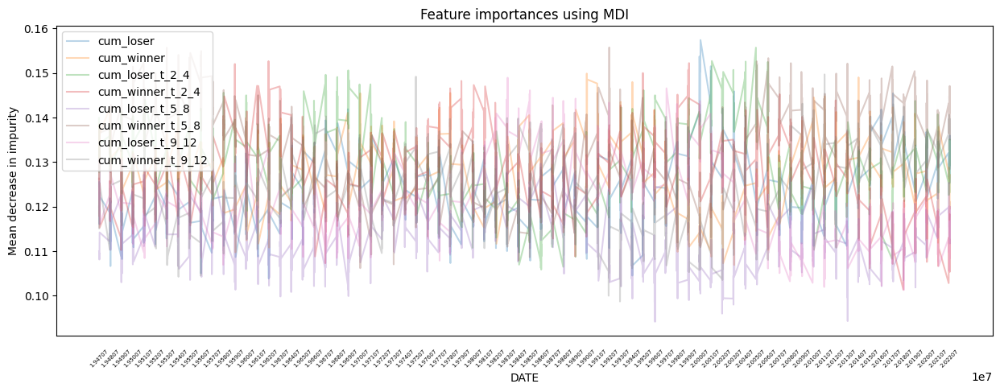

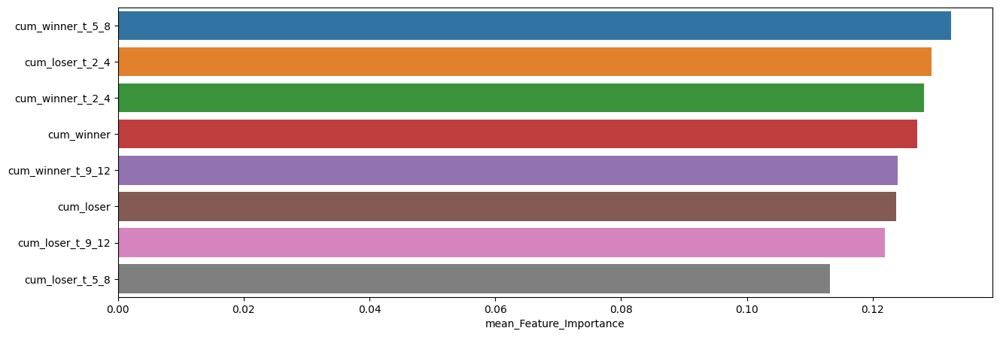

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.132442,0.155743,0.106172
cum_loser_t_2_4,0.129377,0.155700,0.105859
cum_winner_t_2_4,0.128182,0.152655,0.101360
cum_winner,0.127099,0.149873,0.106898
cum_winner_t_9_12,0.124001,0.149682,0.098689
cum_loser,0.123738,0.157396,0.103830
cum_loser_t_9_12,0.121918,0.148943,0.101248
cum_loser_t_5_8,0.113243,0.133785,0.094138


In [23]:
Fixed_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=RDF, # 사용할 모델
                                  model_name='RDF', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.23      0.28        75
         1.0       0.68      0.81      0.74       151

    accuracy                           0.62       226
   macro avg       0.52      0.52      0.51       226
weighted avg       0.58      0.62      0.59       226


accuracy : 0.6150442477876106

precision : 0.6777777777777778

recall : 0.8079470198675497

F1-Score : 0.7371601208459215



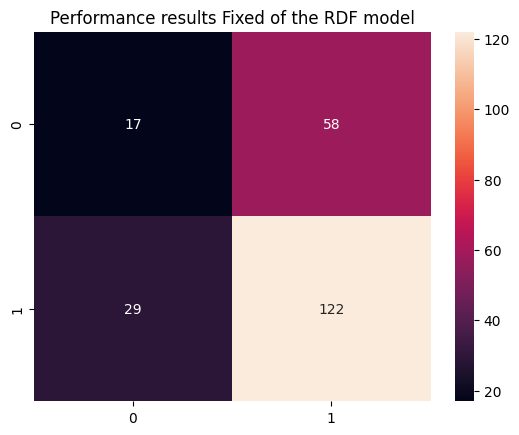


Feature Importance of the model



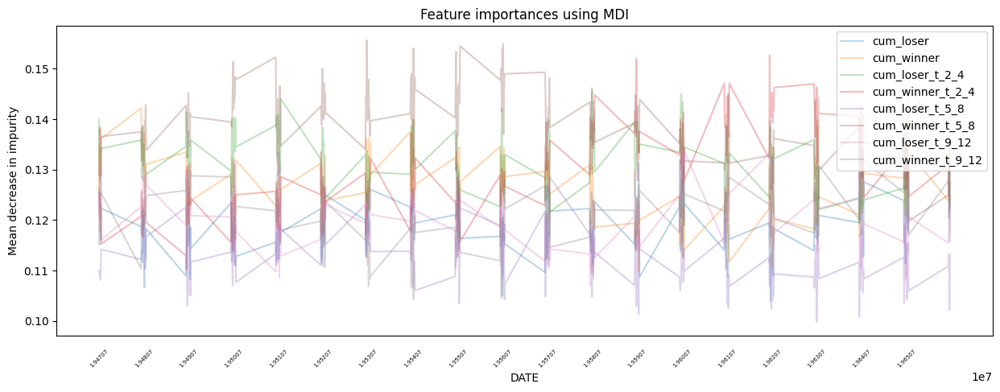

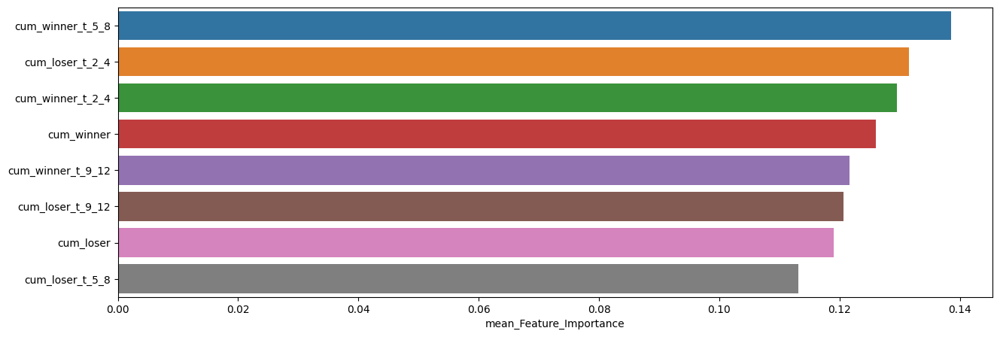

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.138503,0.155688,0.119823
cum_loser_t_2_4,0.131490,0.145914,0.116493
cum_winner_t_2_4,0.129586,0.152655,0.110226
cum_winner,0.125965,0.142184,0.109729
cum_winner_t_9_12,0.121676,0.140060,0.104242
cum_loser_t_9_12,0.120613,0.133964,0.106931
cum_loser,0.119046,0.133751,0.103830
cum_loser_t_5_8,0.113120,0.128473,0.099812



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.21      0.12      0.15        75
         1.0       0.64      0.77      0.70       151

    accuracy                           0.56       226
   macro avg       0.42      0.45      0.43       226
weighted avg       0.50      0.56      0.52       226


accuracy : 0.5575221238938053

precision : 0.639344262295082

recall : 0.7748344370860927

F1-Score : 0.7005988023952096



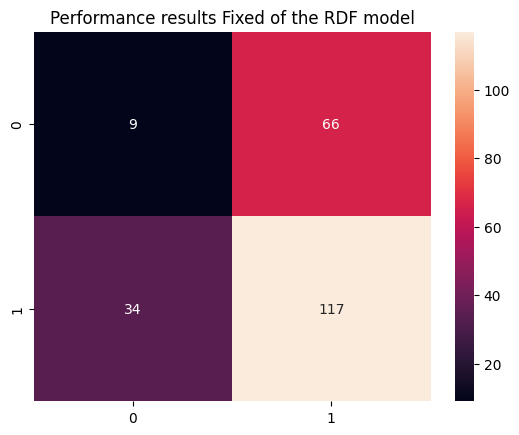


Feature Importance of the model



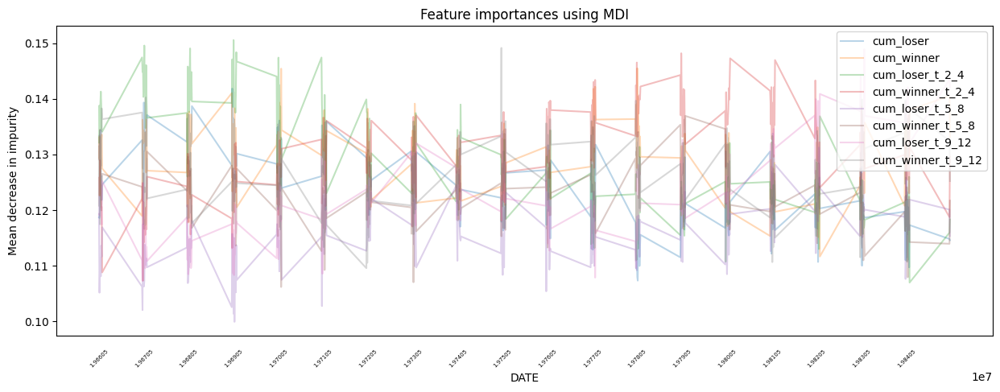

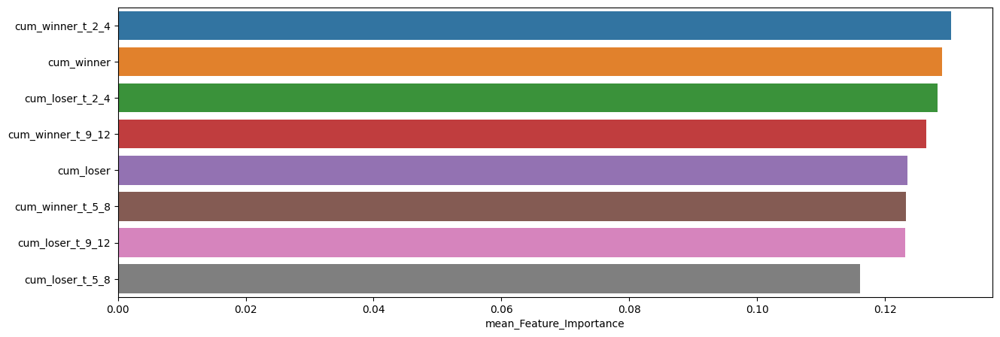

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,0.130323,0.148217,0.107304
cum_winner,0.128886,0.145515,0.111650
cum_loser_t_2_4,0.128203,0.150586,0.106963
cum_winner_t_9_12,0.126469,0.149179,0.109561
cum_loser,0.123585,0.141871,0.107319
cum_winner_t_5_8,0.123245,0.136950,0.106172
cum_loser_t_9_12,0.123190,0.148943,0.107267
cum_loser_t_5_8,0.116098,0.133785,0.099902



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.14      0.20        70
         1.0       0.70      0.88      0.78       156

    accuracy                           0.65       226
   macro avg       0.52      0.51      0.49       226
weighted avg       0.59      0.65      0.60       226


accuracy : 0.6504424778761062

precision : 0.6954314720812182

recall : 0.8782051282051282

F1-Score : 0.7762039660056657



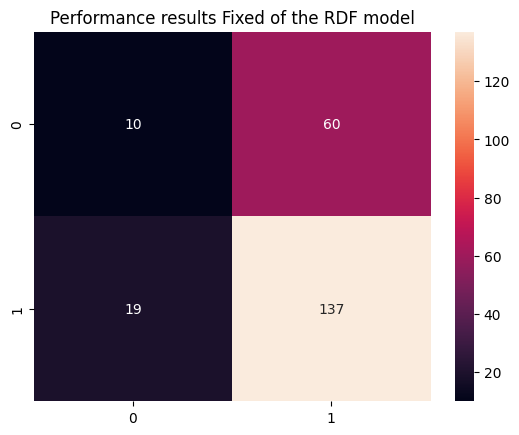


Feature Importance of the model



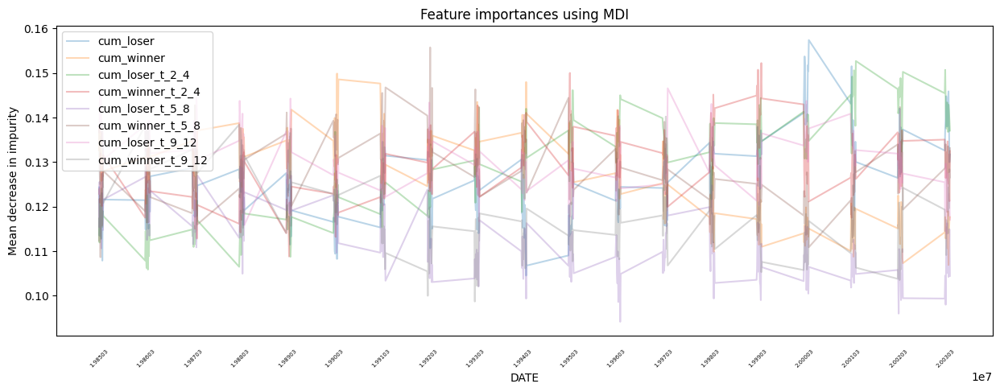

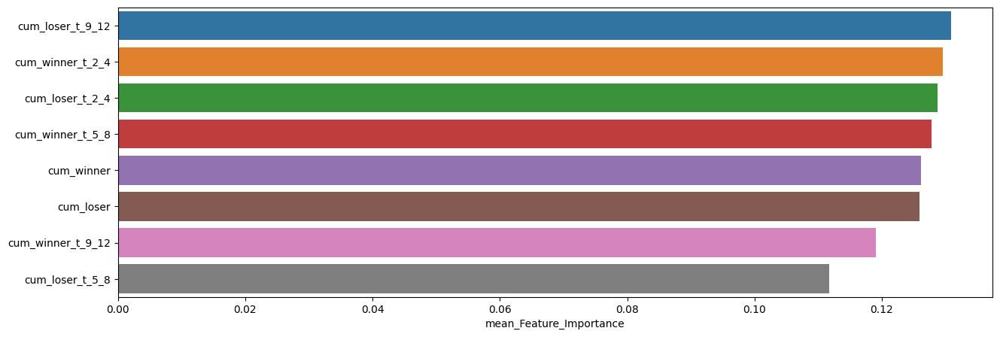

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.130846,0.146563,0.113876
cum_winner_t_2_4,0.129632,0.152227,0.108801
cum_loser_t_2_4,0.128755,0.152692,0.105859
cum_winner_t_5_8,0.127789,0.155743,0.108626
cum_winner,0.126173,0.149873,0.106898
cum_loser,0.125949,0.157396,0.104503
cum_winner_t_9_12,0.119115,0.140206,0.098689
cum_loser_t_5_8,0.111741,0.129667,0.094138



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.46      0.24      0.32        96
         1.0       0.59      0.80      0.68       132

    accuracy                           0.56       228
   macro avg       0.52      0.52      0.50       228
weighted avg       0.54      0.56      0.52       228


accuracy : 0.5614035087719298

precision : 0.5898876404494382

recall : 0.7954545454545454

F1-Score : 0.6774193548387097



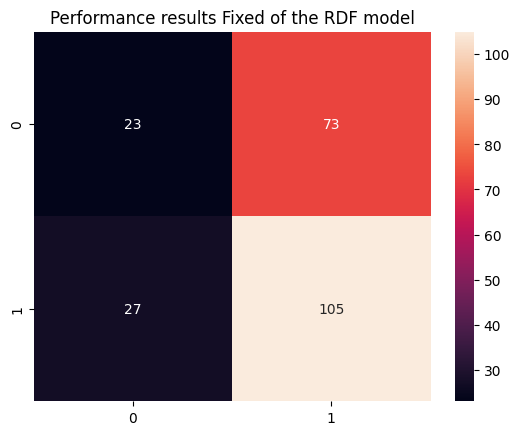


Feature Importance of the model



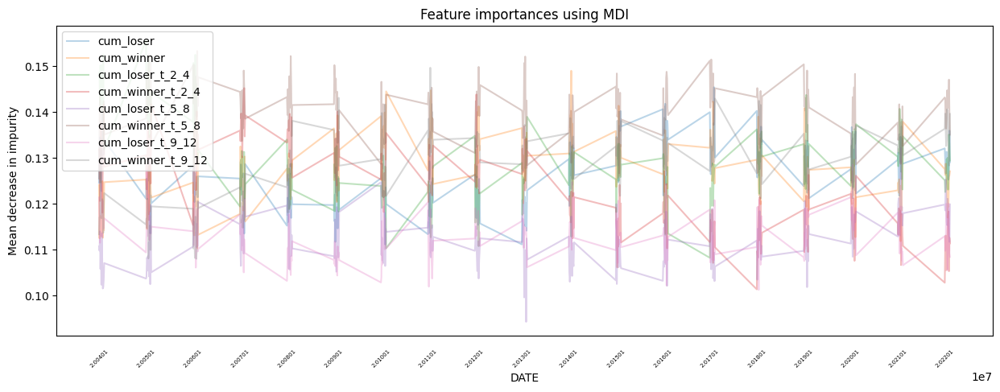

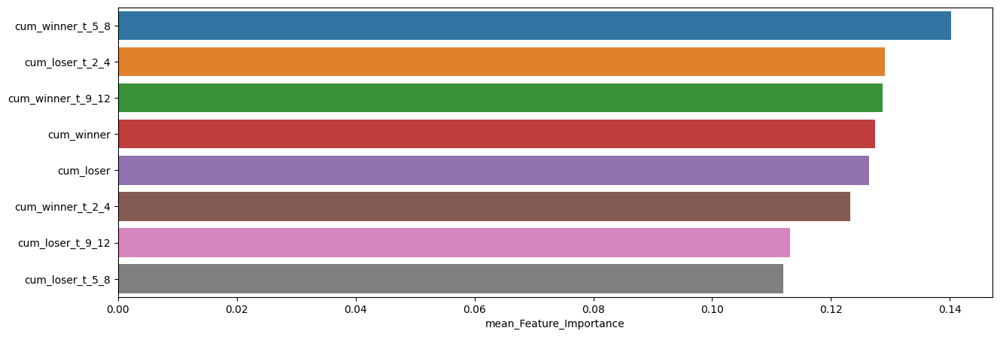

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.140164,0.153327,0.124649
cum_loser_t_2_4,0.129064,0.155700,0.108243
cum_winner_t_9_12,0.128702,0.149682,0.108023
cum_winner,0.127368,0.149021,0.110290
cum_loser,0.126346,0.145434,0.111162
cum_winner_t_2_4,0.123231,0.145233,0.101360
cum_loser_t_9_12,0.113101,0.128536,0.101248
cum_loser_t_5_8,0.112024,0.132185,0.094281


In [24]:
slice_feature_importance(Fixed_RDF_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'RDF') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



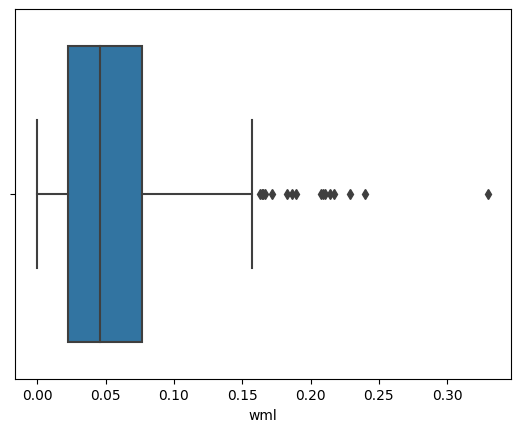

,count,mean,std,min,25%,50%,75%,max
wml,481.0,0.055236,0.045335,0.000007,0.022241,0.046139,0.076635,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



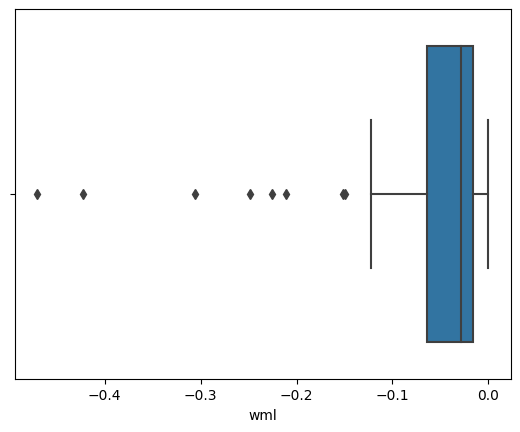

,count,mean,std,min,25%,50%,75%,max
wml,59.0,-0.06683,0.096427,-0.469903,-0.064534,-0.028359,-0.015796,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



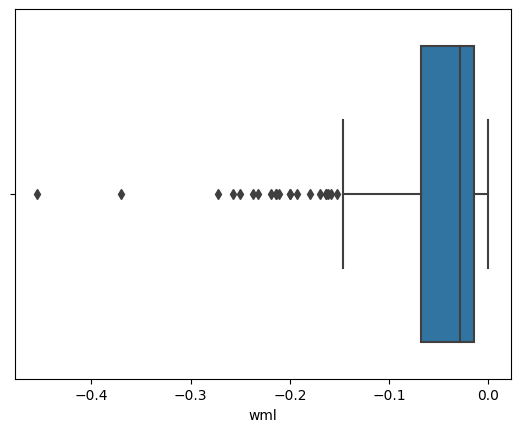

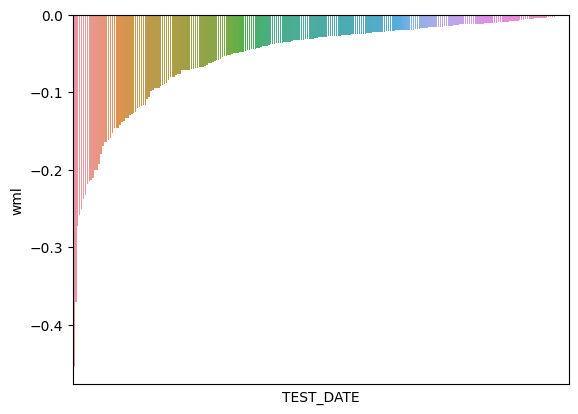

,count,mean,std,min,25%,50%,75%,max
wml,257.0,-0.053896,0.064078,-0.454349,-0.06833,-0.028769,-0.014641,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



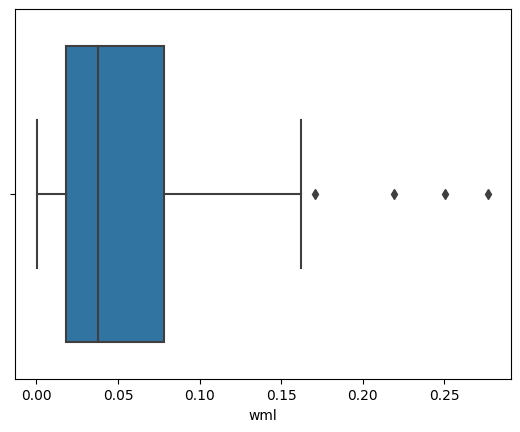

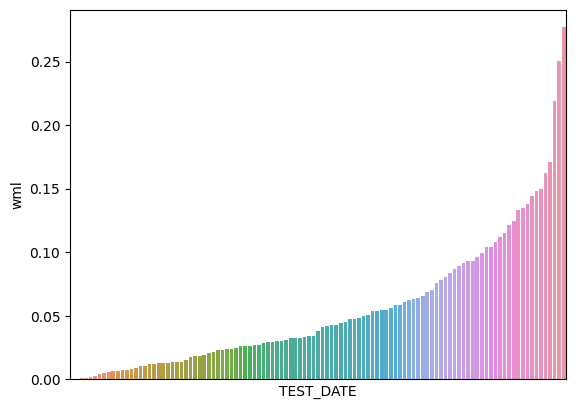

,count,mean,std,min,25%,50%,75%,max
wml,109.0,0.055309,0.053067,0.000627,0.01806,0.037722,0.078379,0.276912


In [25]:
RDF_A0_P1, RDF_A1_P0 = What_Pred(Fixed_RDF_Result, WML, 'RDF')

Sharpe Ratio : 0.70583

최근 누적 수익률

  2022년-12월 -> 37126.87
  2022년-11월 -> 33450.56
  2022년-10월 -> 31818.50
  2022년-09월 -> 28174.76
  2022년-08월 -> 25614.96

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 37126.87
  2등 : 2002년-09월 -> 34881.24
  3등 : 2022년-11월 -> 33450.56
  4등 : 2022년-10월 -> 31818.50
  5등 : 2001년-09월 -> 31689.83
  6등 : 2002년-07월 -> 30374.05
  7등 : 2002년-08월 -> 29494.05
  8등 : 2002년-06월 -> 28798.62
  9등 : 2022년-09월 -> 28174.76
  10등 : 2002년-10월 -> 28143.85



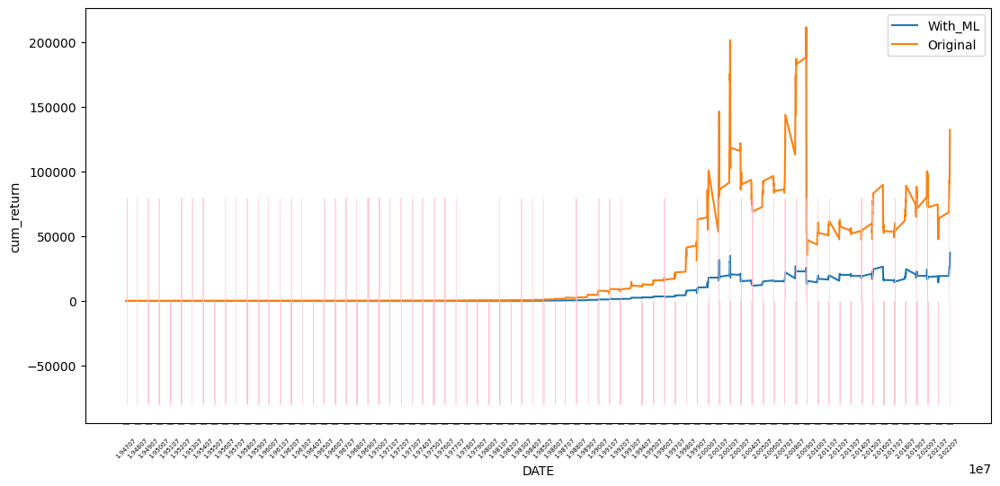

In [26]:
RDF_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_RDF_Result,
                                                 WML,
                                                 'RDF_PRED_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.74351

최근 누적 수익률

  2022년-12월 -> 6042.30
  2022년-11월 -> 5616.33
  2022년-10월 -> 5443.20
  2022년-09월 -> 5033.06
  2022년-08월 -> 4752.79

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 6153.95
  2등 : 2009년-02월 -> 6069.09
  3등 : 2022년-12월 -> 6042.30
  4등 : 2008년-11월 -> 5705.26
  5등 : 2008년-06월 -> 5694.53
  6등 : 2009년-01월 -> 5690.88
  7등 : 2008년-12월 -> 5635.03
  8등 : 2002년-07월 -> 5619.65
  9등 : 2022년-11월 -> 5616.33
  10등 : 2008년-10월 -> 5518.66



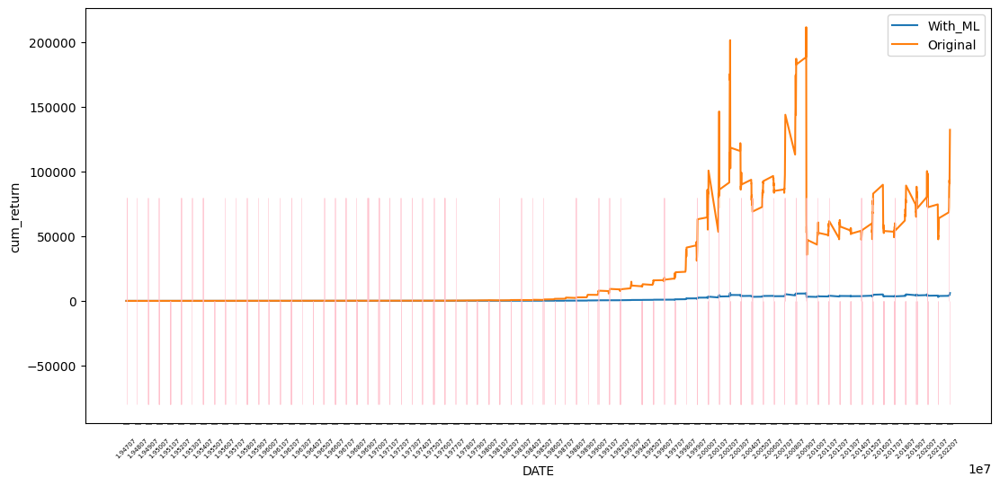

In [27]:
RDF_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_RDF_Result,
                                                 WML,
                                                 'RDF_PROB_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

### Grdient Boosting

In [28]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

**************************************************

GBC Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.25      0.30       316
         1.0       0.66      0.80      0.72       590

    accuracy                           0.60       906
   macro avg       0.53      0.52      0.51       906
weighted avg       0.57      0.60      0.58       906


accuracy : 0.6048565121412803

precision : 0.6638418079096046

recall : 0.7966101694915254

F1-Score : 0.7241910631741141



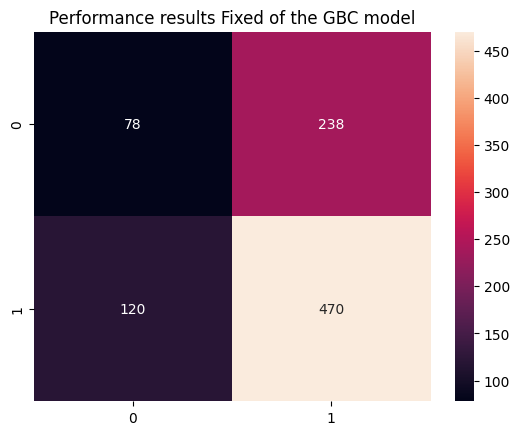


Feature Importance of the model



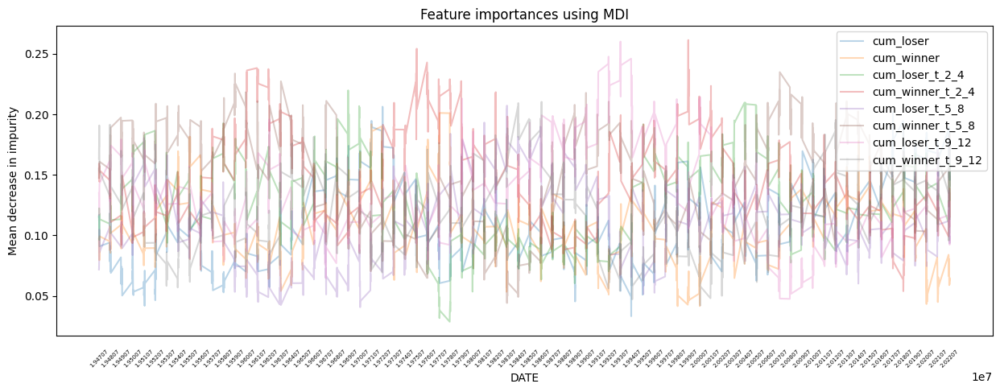

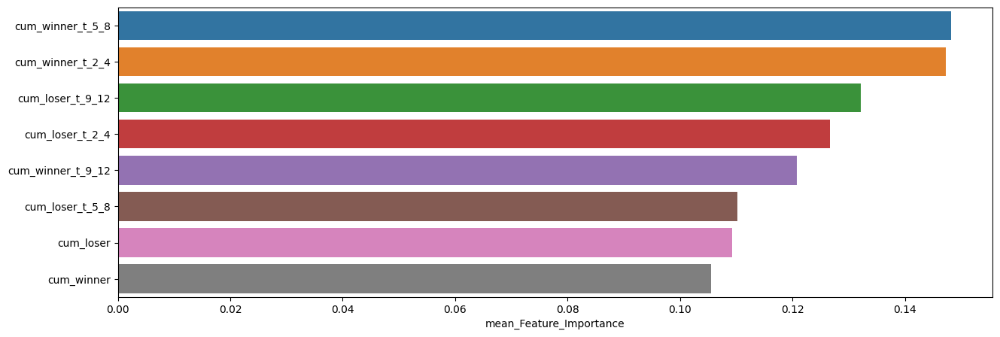

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.148164,0.234901,0.044072
cum_winner_t_2_4,0.147298,0.261417,0.053776
cum_loser_t_9_12,0.132094,0.260191,0.047499
cum_loser_t_2_4,0.126684,0.219825,0.028554
cum_winner_t_9_12,0.120823,0.210353,0.042064
cum_loser_t_5_8,0.110207,0.207242,0.040608
cum_loser,0.109275,0.206311,0.033136
cum_winner,0.105455,0.201141,0.041461


In [29]:
Fixed_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=GBC, # 사용할 모델
                                  model_name='GBC', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.43      0.32      0.37        75
         1.0       0.70      0.79      0.74       151

    accuracy                           0.63       226
   macro avg       0.56      0.55      0.55       226
weighted avg       0.61      0.63      0.62       226


accuracy : 0.6327433628318584

precision : 0.7

recall : 0.7880794701986755

F1-Score : 0.7414330218068536



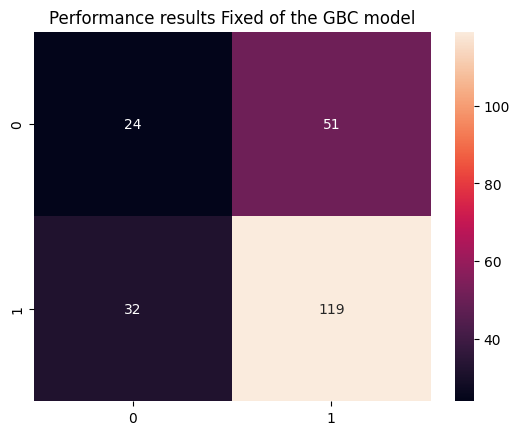


Feature Importance of the model



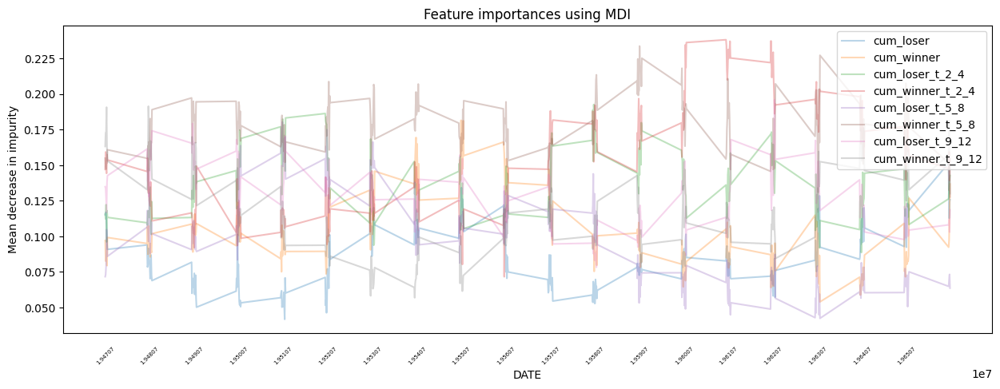

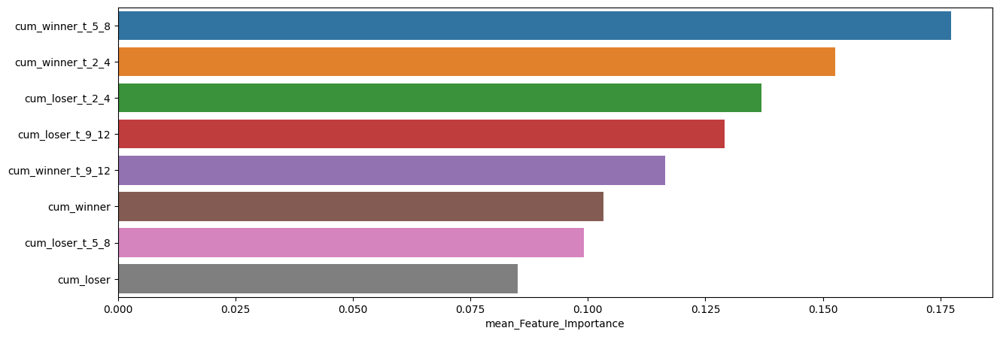

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.177224,0.233775,0.125917
cum_winner_t_2_4,0.152680,0.238281,0.071629
cum_loser_t_2_4,0.136923,0.192704,0.088669
cum_loser_t_9_12,0.129158,0.195986,0.078275
cum_winner_t_9_12,0.116412,0.191501,0.056884
cum_winner,0.103289,0.181595,0.053970
cum_loser_t_5_8,0.099225,0.180466,0.042379
cum_loser,0.085089,0.151703,0.041711



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.31      0.20      0.24        75
         1.0       0.66      0.77      0.71       151

    accuracy                           0.58       226
   macro avg       0.48      0.49      0.48       226
weighted avg       0.54      0.58      0.56       226


accuracy : 0.584070796460177

precision : 0.6610169491525424

recall : 0.7748344370860927

F1-Score : 0.7134146341463414



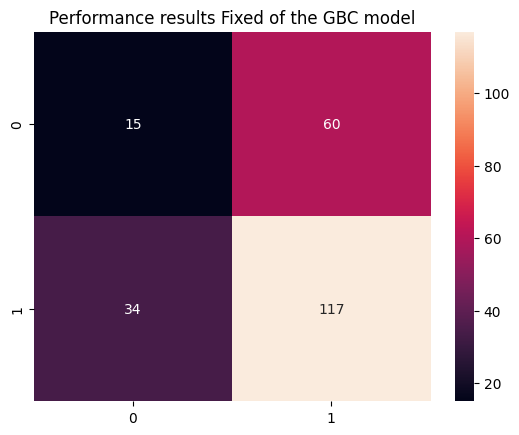


Feature Importance of the model



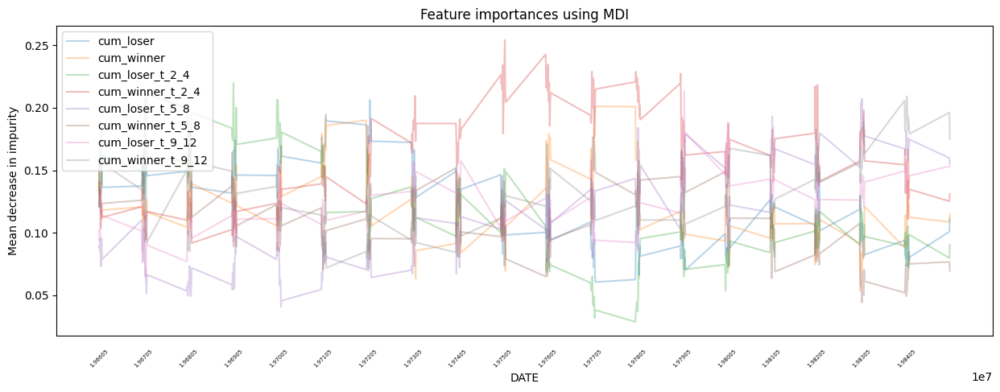

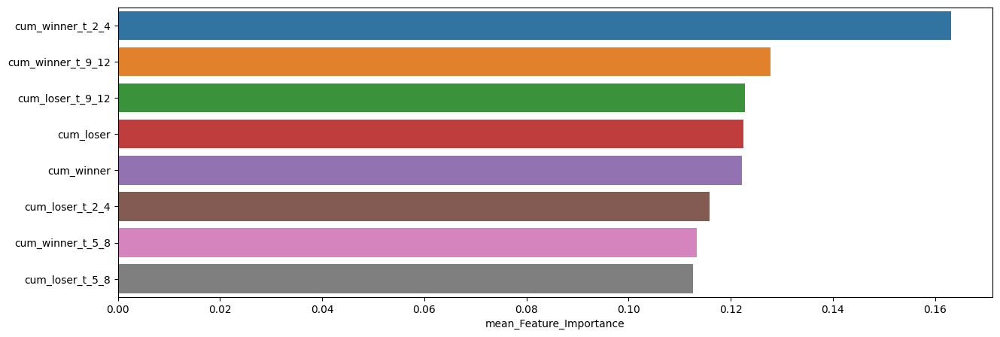

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,0.163100,0.254268,0.091695
cum_winner_t_9_12,0.127774,0.209320,0.069232
cum_loser_t_9_12,0.122729,0.213108,0.064533
cum_loser,0.122417,0.206311,0.060445
cum_winner,0.122242,0.201141,0.053333
cum_loser_t_2_4,0.115783,0.219825,0.028554
cum_winner_t_5_8,0.113281,0.211158,0.044072
cum_loser_t_5_8,0.112673,0.207242,0.040608



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.21      0.28        70
         1.0       0.71      0.87      0.78       156

    accuracy                           0.66       226
   macro avg       0.56      0.54      0.53       226
weighted avg       0.62      0.66      0.63       226


accuracy : 0.6637168141592921

precision : 0.7105263157894737

recall : 0.8653846153846154

F1-Score : 0.7803468208092484



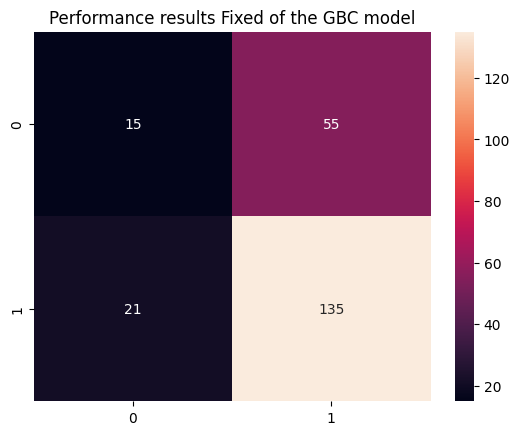


Feature Importance of the model



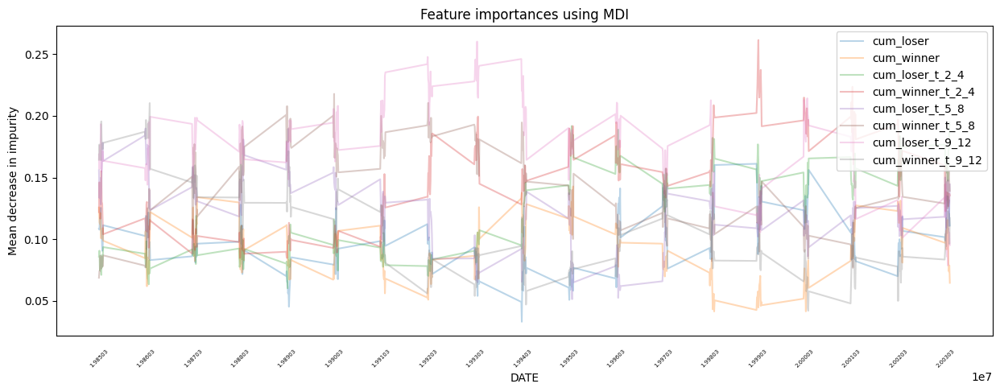

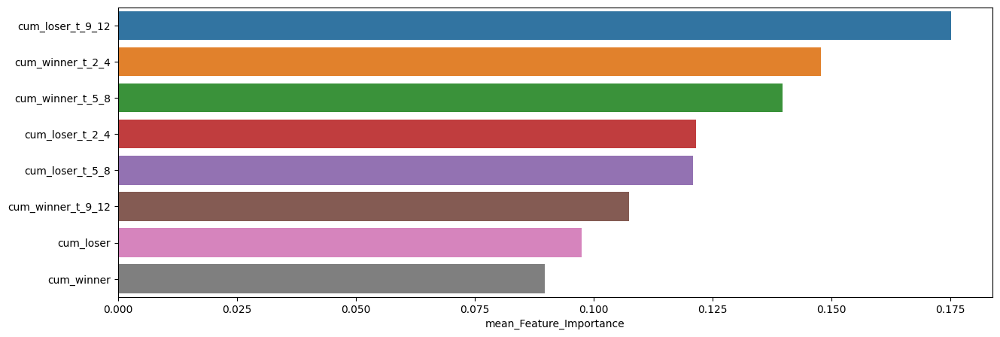

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.175148,0.260191,0.078697
cum_winner_t_2_4,0.147889,0.261417,0.084793
cum_winner_t_5_8,0.139807,0.217783,0.068781
cum_loser_t_2_4,0.121584,0.194982,0.060307
cum_loser_t_5_8,0.120925,0.189746,0.051427
cum_winner_t_9_12,0.107407,0.210353,0.042064
cum_loser,0.097461,0.161150,0.033136
cum_winner,0.089779,0.142832,0.041461



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.25      0.31        96
         1.0       0.58      0.75      0.65       132

    accuracy                           0.54       228
   macro avg       0.50      0.50      0.48       228
weighted avg       0.51      0.54      0.51       228


accuracy : 0.5394736842105263

precision : 0.5789473684210527

recall : 0.75

F1-Score : 0.6534653465346535



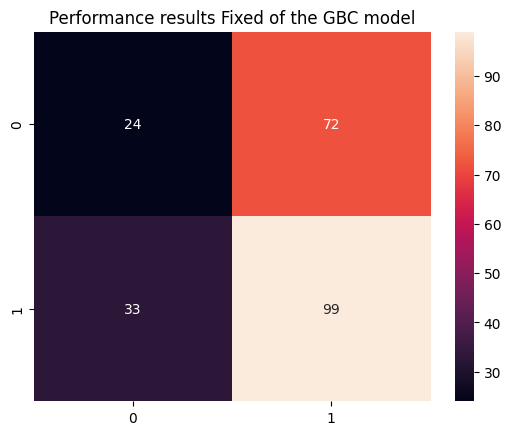


Feature Importance of the model



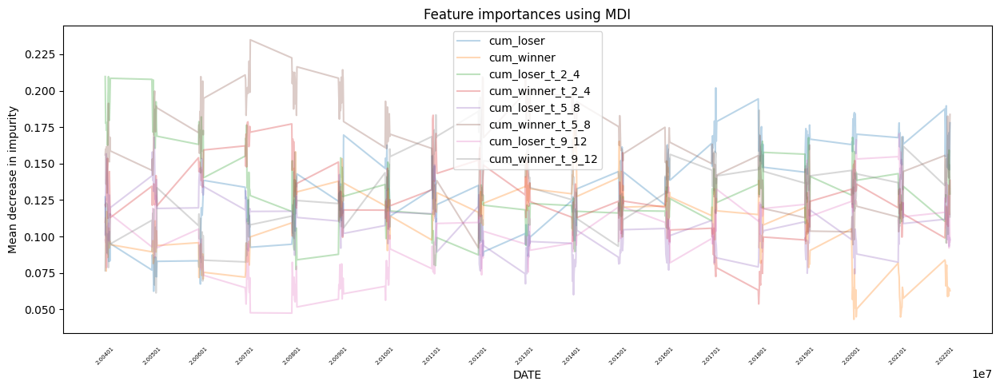

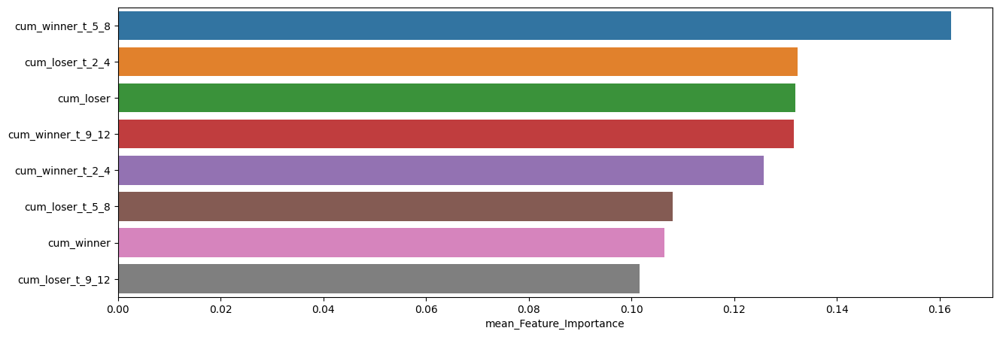

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.162218,0.234901,0.092230
cum_loser_t_2_4,0.132397,0.209721,0.077434
cum_loser,0.131932,0.201957,0.062491
cum_winner_t_9_12,0.131602,0.195398,0.061367
cum_winner_t_2_4,0.125714,0.183184,0.053776
cum_loser_t_5_8,0.108026,0.168178,0.060091
cum_winner,0.106501,0.178079,0.043215
cum_loser_t_9_12,0.101611,0.170464,0.047499


In [30]:
slice_feature_importance(Fixed_GBC_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'GBC') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



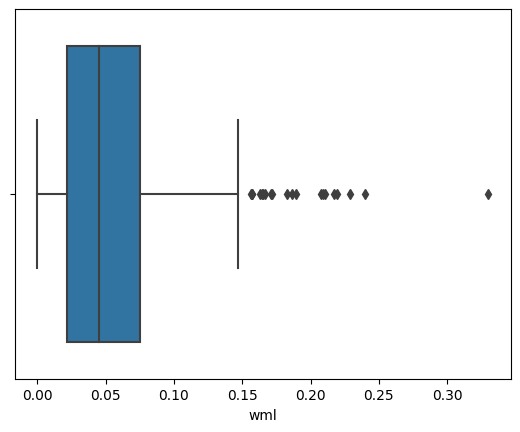

,count,mean,std,min,25%,50%,75%,max
wml,470.0,0.054716,0.045536,0.000007,0.021975,0.045171,0.074883,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



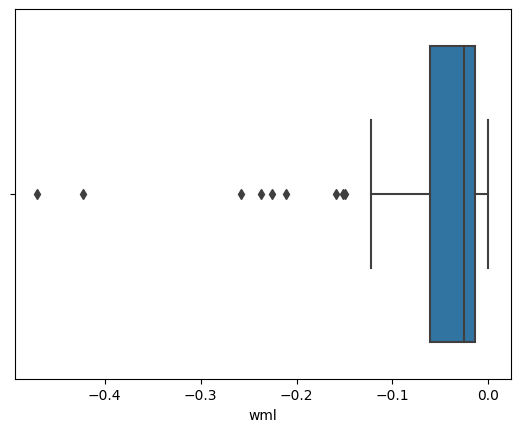

,count,mean,std,min,25%,50%,75%,max
wml,78.0,-0.059379,0.085331,-0.469903,-0.060534,-0.025396,-0.014281,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



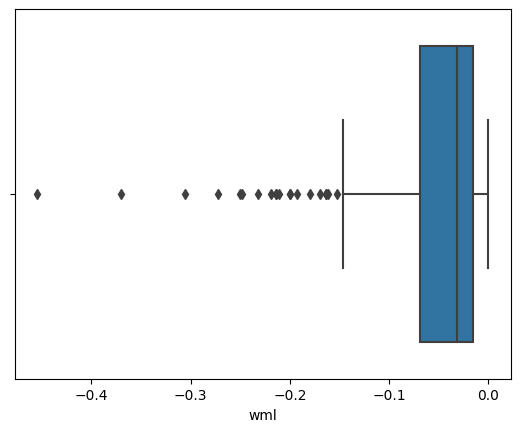

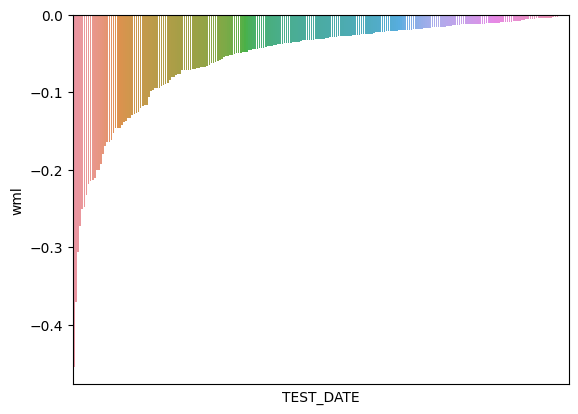

,count,mean,std,min,25%,50%,75%,max
wml,238.0,-0.055306,0.066142,-0.454349,-0.068789,-0.031242,-0.01515,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



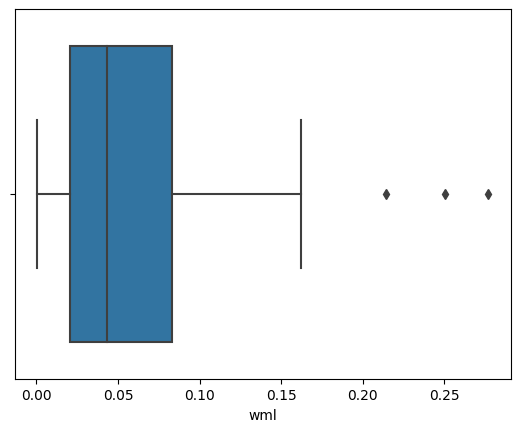

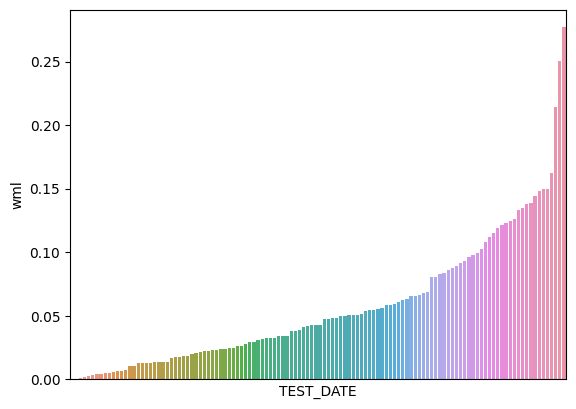

,count,mean,std,min,25%,50%,75%,max
wml,120.0,0.057339,0.051657,0.000627,0.020756,0.042982,0.083031,0.276912


In [31]:
GBC_A0_P1, GBC_A1_P0 = What_Pred(Fixed_GBC_Result, WML, 'GBC')

Sharpe Ratio : 0.66728

최근 누적 수익률

  2022년-12월 -> 33086.91
  2022년-11월 -> 29810.63
  2022년-10월 -> 28356.16
  2022년-09월 -> 25108.90
  2022년-08월 -> 22827.64

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 74071.39
  2등 : 2002년-07월 -> 64500.38
  3등 : 2008년-06월 -> 62776.54
  4등 : 2002년-08월 -> 62631.72
  5등 : 2002년-06월 -> 61154.96
  6등 : 2002년-10월 -> 59764.57
  7등 : 2009년-02월 -> 54728.26
  8등 : 2009년-01월 -> 54728.26
  9등 : 2008년-12월 -> 54728.26
  10등 : 2008년-11월 -> 54728.26



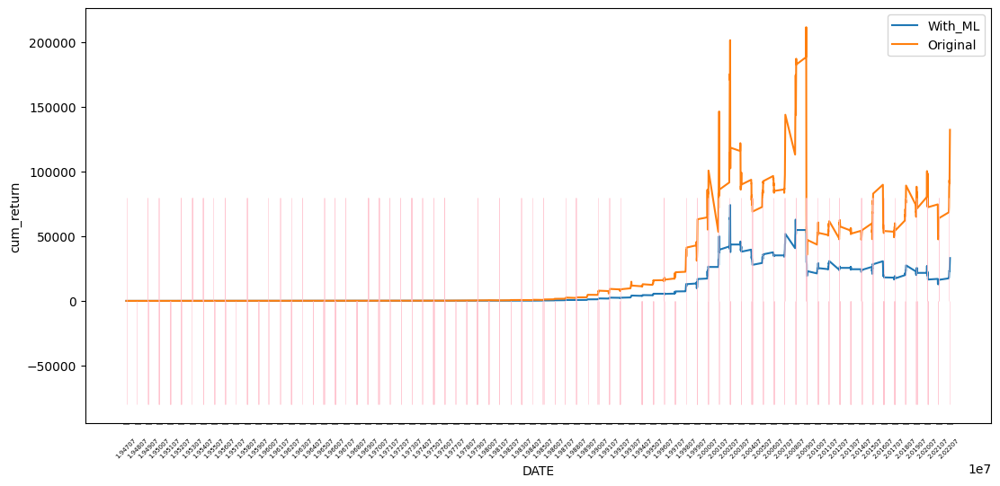

In [32]:
GBC_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_GBC_Result,
                                                 WML,
                                                 'GBC_PRED_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.70614

최근 누적 수익률

  2022년-12월 -> 10076.01
  2022년-11월 -> 9188.78
  2022년-10월 -> 8807.52
  2022년-09월 -> 8126.17
  2022년-08월 -> 7724.37

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 16703.21
  2등 : 2002년-07월 -> 15087.72
  3등 : 2002년-08월 -> 14714.19
  4등 : 2008년-06월 -> 14698.07
  5등 : 2009년-02월 -> 14522.73
  6등 : 2002년-06월 -> 14448.29
  7등 : 2008년-11월 -> 14044.37
  8등 : 2002년-10월 -> 13965.90
  9등 : 2009년-01월 -> 13938.34
  10등 : 2008년-10월 -> 13918.85



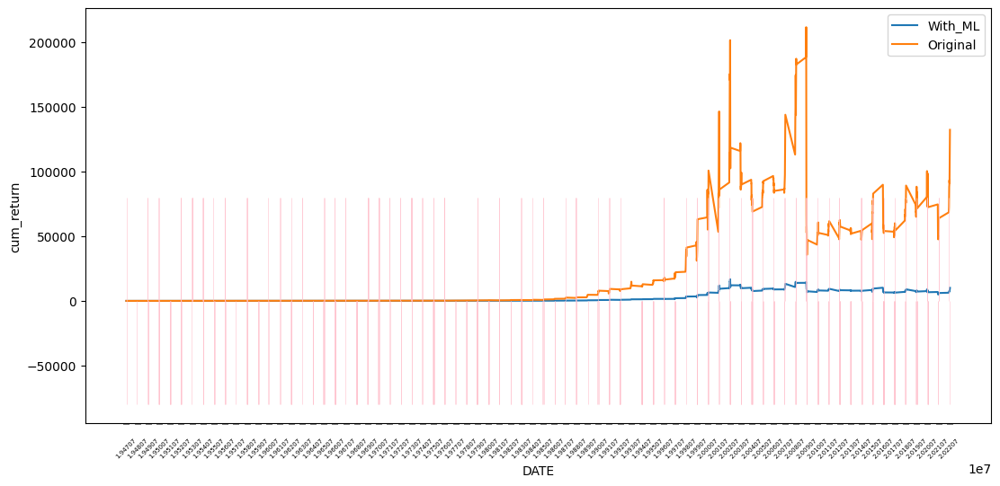

In [33]:
GBC_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_GBC_Result,
                                                 WML,
                                                 'GBC_PROB_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

### XGB

In [34]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

**************************************************

XGB Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : None
 

  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.26      0.31       316
         1.0       0.66      0.77      0.71       590

    accuracy                           0.59       906
   macro avg       0.52      0.51      0.51       906
weighted avg       0.56      0.59      0.57       906


accuracy : 0.5905077262693157

precision : 0.6598540145985401

recall : 0.7661016949152543

F1-Score : 0.7090196078431371



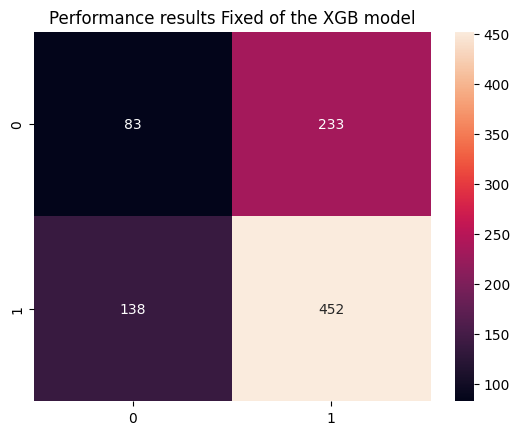


Feature Importance of the model



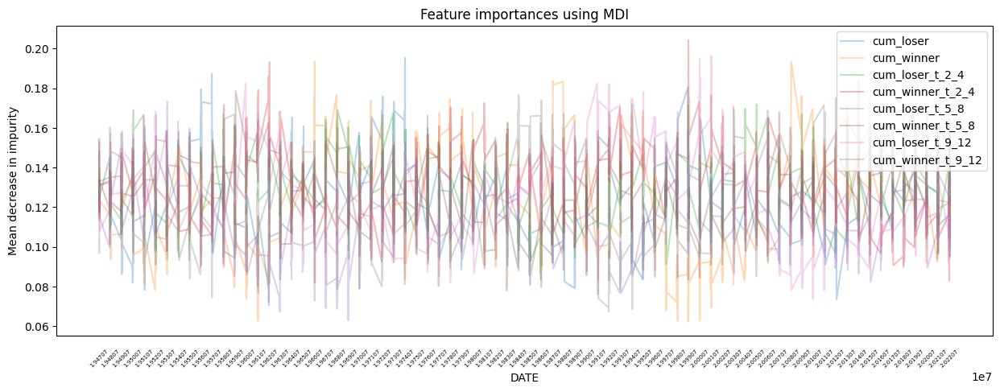

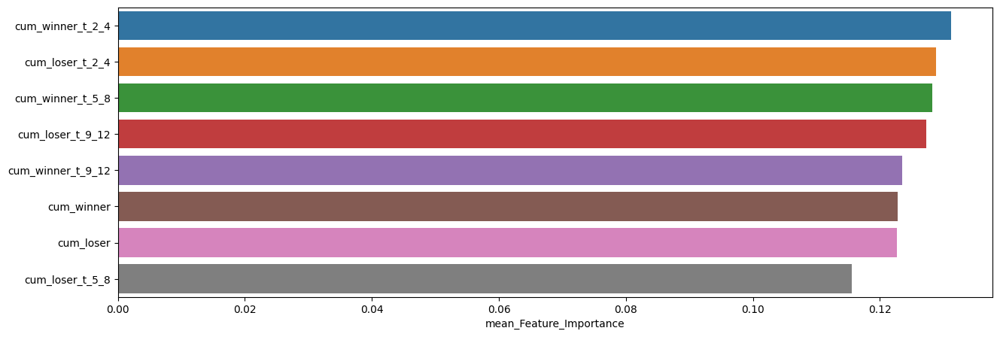

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,0.131169,0.204324,0.081790
cum_loser_t_2_4,0.128857,0.171881,0.083588
cum_winner_t_5_8,0.128239,0.183900,0.077909
cum_loser_t_9_12,0.127317,0.196306,0.073623
cum_winner_t_9_12,0.123525,0.176522,0.067183
cum_winner,0.122750,0.193652,0.062227
cum_loser,0.122629,0.195312,0.070439
cum_loser_t_5_8,0.115514,0.173373,0.062891


In [35]:
Fixed_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB, # 사용할 모델
                                  model_name='XGB', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.36      0.38        75
         1.0       0.70      0.74      0.72       151

    accuracy                           0.61       226
   macro avg       0.55      0.55      0.55       226
weighted avg       0.60      0.61      0.60       226


accuracy : 0.6106194690265486

precision : 0.6981132075471698

recall : 0.7350993377483444

F1-Score : 0.7161290322580645



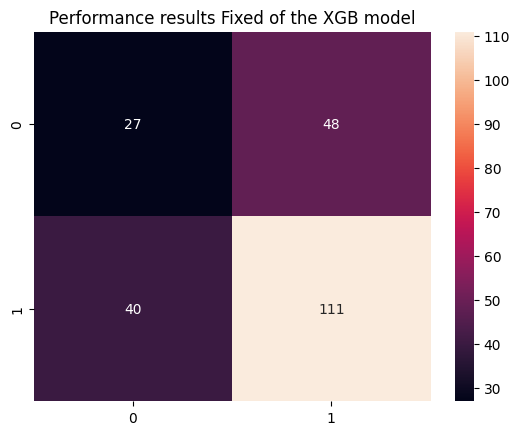


Feature Importance of the model



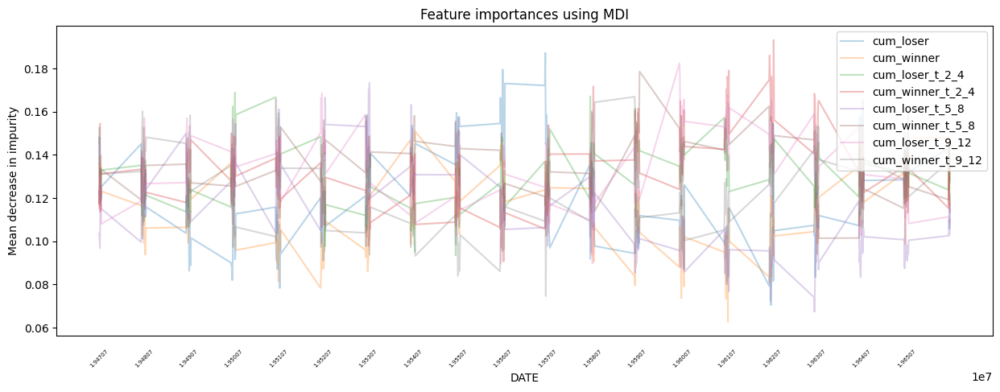

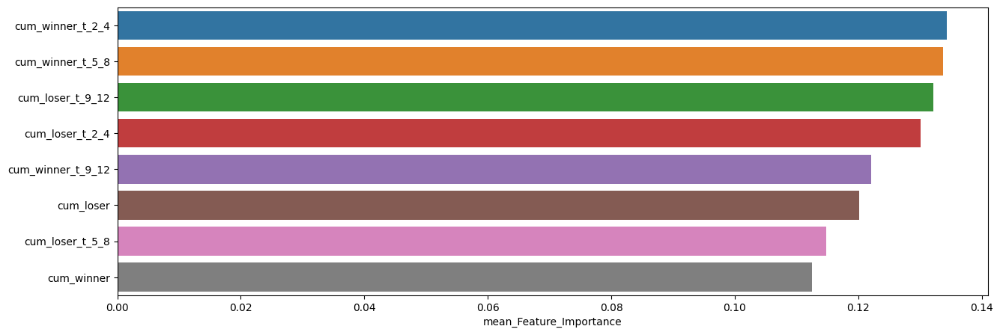

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,0.134320,0.193205,0.090632
cum_winner_t_5_8,0.133770,0.178660,0.094097
cum_loser_t_9_12,0.132179,0.182401,0.089587
cum_loser_t_2_4,0.130152,0.168973,0.093428
cum_winner_t_9_12,0.122078,0.166931,0.074537
cum_loser,0.120160,0.187253,0.070439
cum_loser_t_5_8,0.114810,0.173373,0.067343
cum_winner,0.112530,0.152581,0.062705



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.22      0.16      0.19        75
         1.0       0.63      0.72      0.67       151

    accuracy                           0.54       226
   macro avg       0.43      0.44      0.43       226
weighted avg       0.50      0.54      0.51       226


accuracy : 0.5353982300884956

precision : 0.6337209302325582

recall : 0.7218543046357616

F1-Score : 0.674922600619195



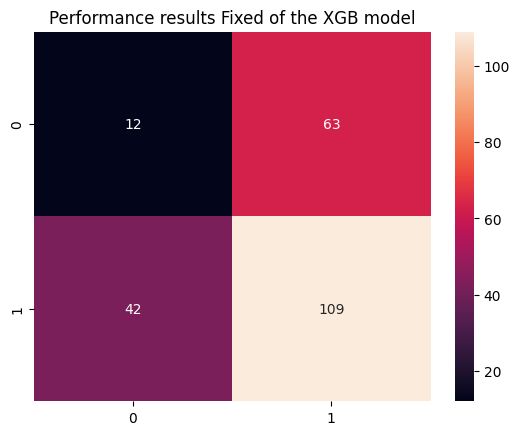


Feature Importance of the model



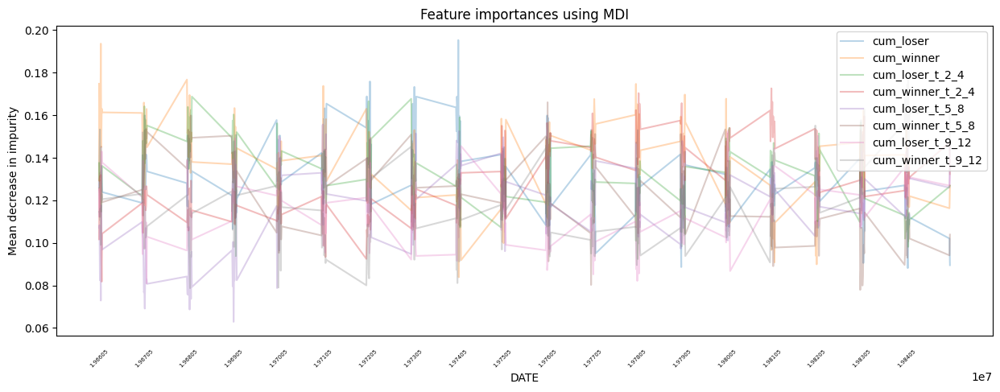

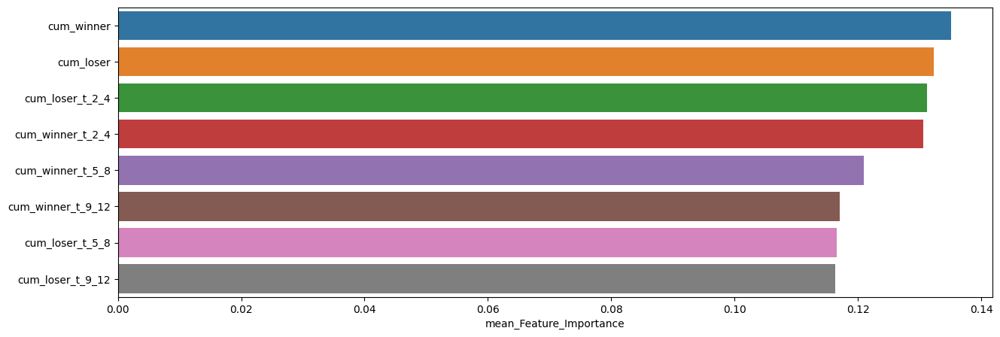

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,0.135073,0.193652,0.083885
cum_loser,0.132282,0.195312,0.088149
cum_loser_t_2_4,0.131155,0.168766,0.092409
cum_winner_t_2_4,0.130610,0.172621,0.081790
cum_winner_t_5_8,0.120952,0.166091,0.077909
cum_winner_t_9_12,0.117092,0.176522,0.078712
cum_loser_t_5_8,0.116534,0.155691,0.062891
cum_loser_t_9_12,0.116302,0.152475,0.080944



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.21      0.28        70
         1.0       0.71      0.85      0.77       156

    accuracy                           0.65       226
   macro avg       0.55      0.53      0.52       226
weighted avg       0.61      0.65      0.62       226


accuracy : 0.6504424778761062

precision : 0.7058823529411765

recall : 0.8461538461538461

F1-Score : 0.7696793002915452



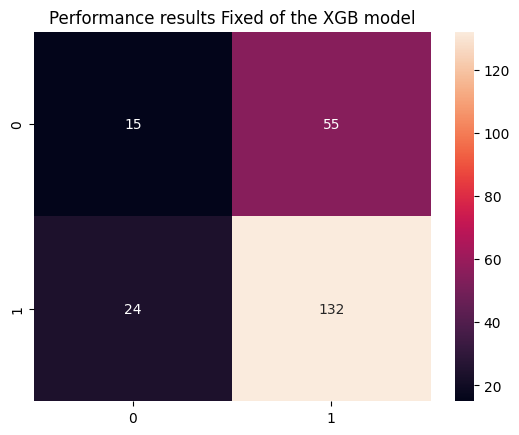


Feature Importance of the model



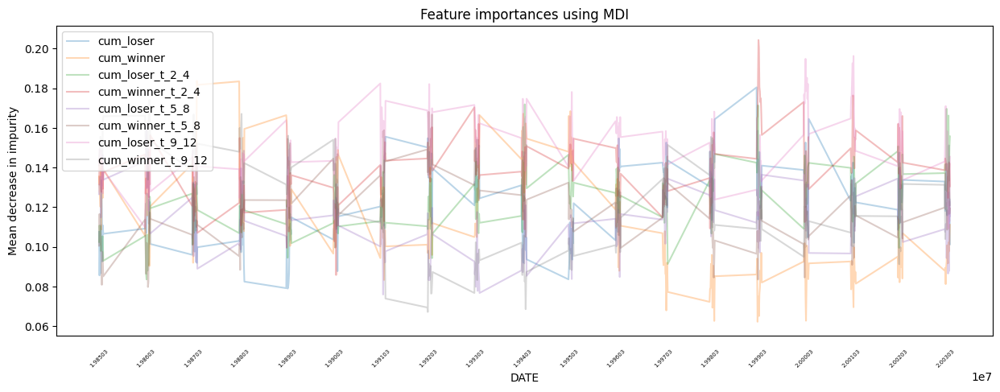

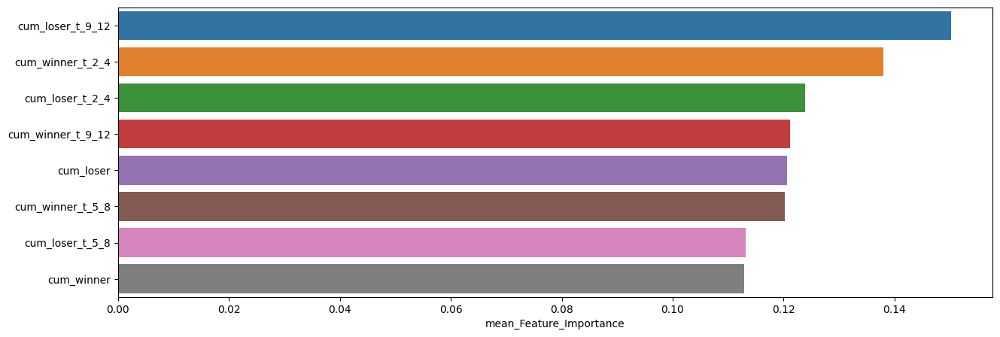

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.150141,0.196306,0.109425
cum_winner_t_2_4,0.138025,0.204324,0.085819
cum_loser_t_2_4,0.123871,0.171881,0.083588
cum_winner_t_9_12,0.121150,0.173987,0.067183
cum_loser,0.120589,0.180470,0.078951
cum_winner_t_5_8,0.120196,0.168102,0.079768
cum_loser_t_5_8,0.113138,0.162293,0.075955
cum_winner,0.112889,0.183704,0.062227



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.48      0.30      0.37        96
         1.0       0.60      0.76      0.67       132

    accuracy                           0.57       228
   macro avg       0.54      0.53      0.52       228
weighted avg       0.55      0.57      0.54       228


accuracy : 0.5657894736842105

precision : 0.5988023952095808

recall : 0.7575757575757576

F1-Score : 0.668896321070234



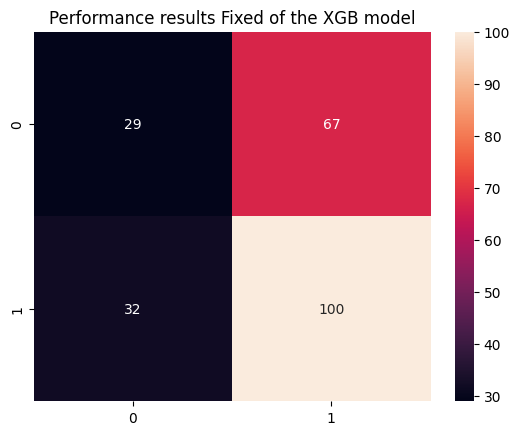


Feature Importance of the model



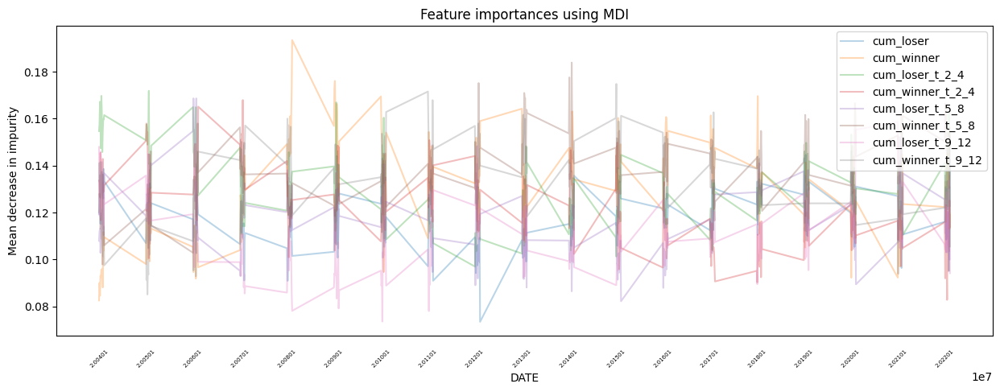

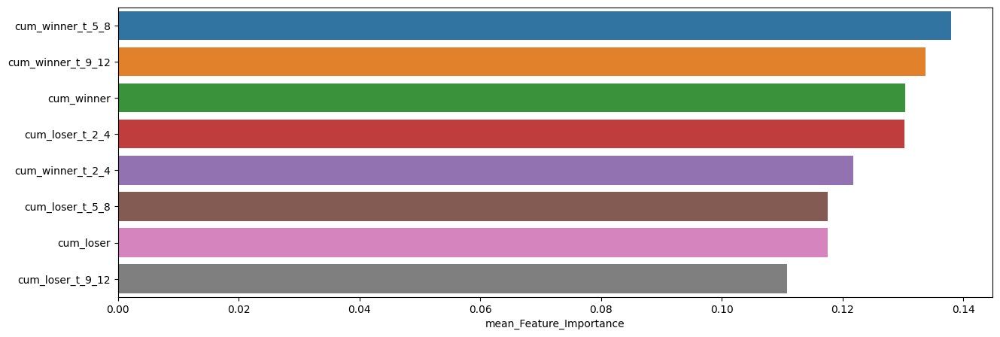

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.137953,0.183900,0.097945
cum_winner_t_9_12,0.133690,0.174804,0.085149
cum_winner,0.130440,0.193472,0.082595
cum_loser_t_2_4,0.130240,0.171853,0.097029
cum_winner_t_2_4,0.121802,0.167942,0.082862
cum_loser_t_5_8,0.117557,0.168651,0.082263
cum_loser,0.117529,0.144586,0.073486
cum_loser_t_9_12,0.110790,0.158577,0.073623


In [36]:
slice_feature_importance(Fixed_XGB_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'XGB') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



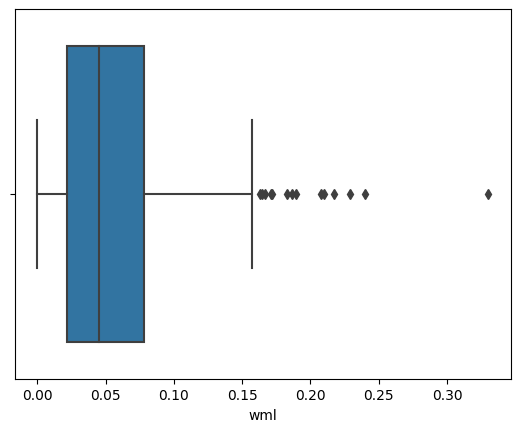

,count,mean,std,min,25%,50%,75%,max
wml,452.0,0.054892,0.045092,0.000128,0.021945,0.045567,0.077935,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



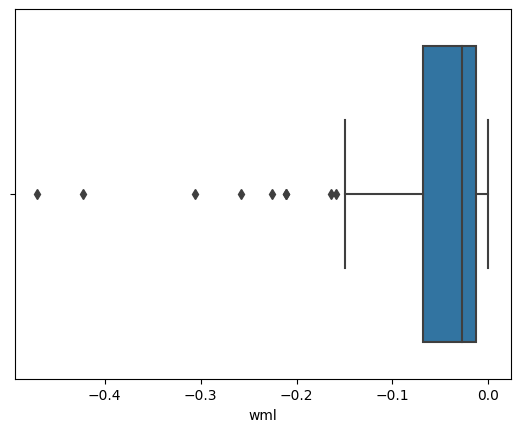

,count,mean,std,min,25%,50%,75%,max
wml,83.0,-0.063049,0.08733,-0.469903,-0.068394,-0.027362,-0.013329,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



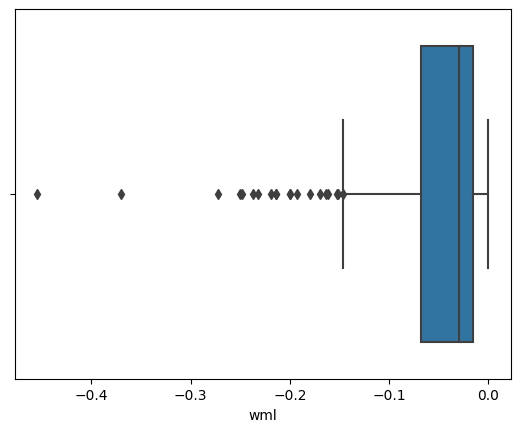

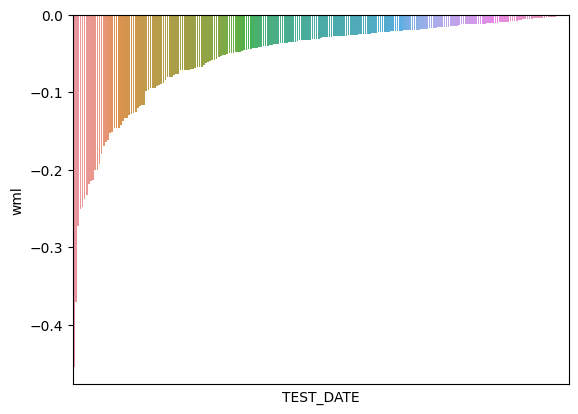

,count,mean,std,min,25%,50%,75%,max
wml,233.0,-0.053911,0.064593,-0.454349,-0.067824,-0.029384,-0.015309,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



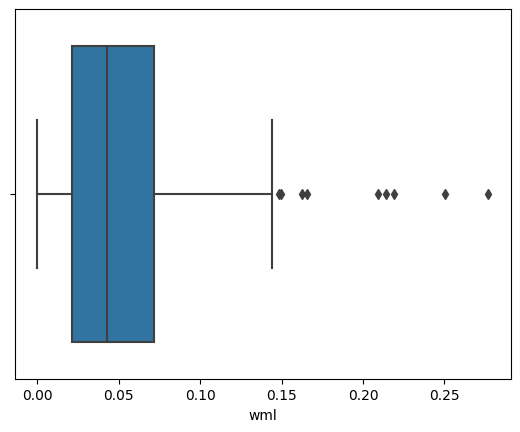

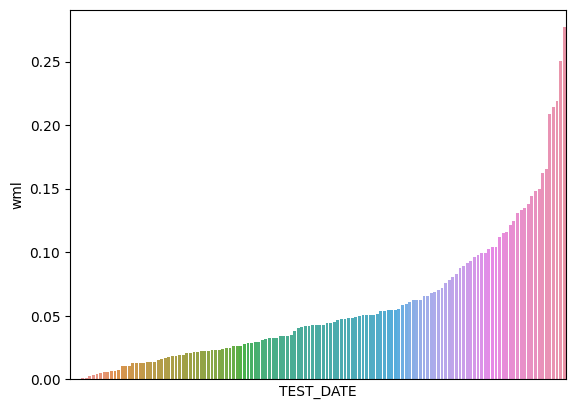

,count,mean,std,min,25%,50%,75%,max
wml,138.0,0.056422,0.052206,0.000007,0.021288,0.042846,0.071474,0.276912


In [37]:
XGB_A0_P1, XGB_A1_P0 = What_Pred(Fixed_XGB_Result, WML, 'XGB')

Sharpe Ratio : 0.71406

최근 누적 수익률

  2022년-12월 -> 27451.88
  2022년-11월 -> 24733.57
  2022년-10월 -> 23526.80
  2022년-09월 -> 20832.56
  2022년-08월 -> 18939.81

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 30184.94
  2등 : 2009년-03월 -> 28449.52
  3등 : 2009년-02월 -> 28449.52
  4등 : 2022년-12월 -> 27451.88
  5등 : 2018년-12월 -> 27331.88
  6등 : 2020년-03월 -> 26933.53
  7등 : 2002년-06월 -> 26284.56
  8등 : 2002년-07월 -> 26284.56
  9등 : 2018년-11월 -> 25845.92
  10등 : 2002년-08월 -> 25523.05



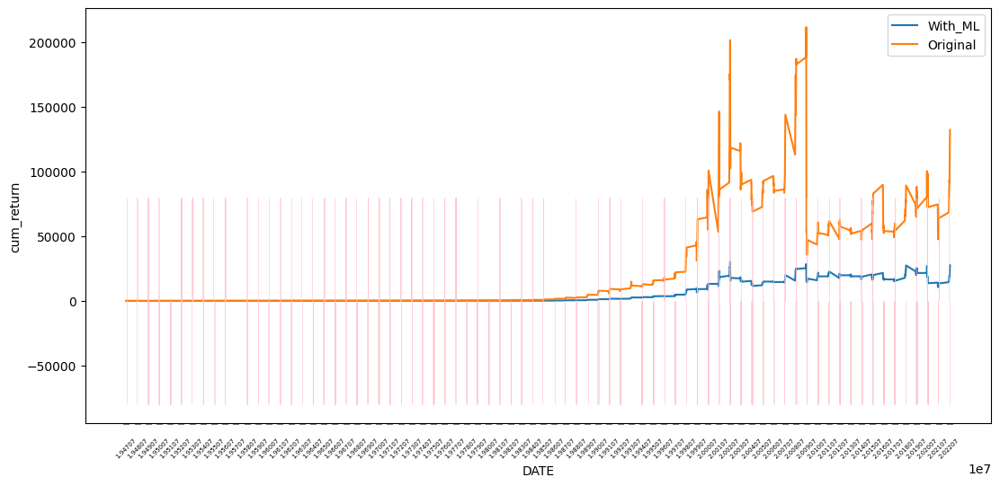

In [38]:
XGB_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_XGB_Result,
                                                 WML,
                                                 'XGB_PRED_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.72513

최근 누적 수익률

  2022년-12월 -> 12640.15
  2022년-11월 -> 11418.60
  2022년-10월 -> 11005.34
  2022년-09월 -> 9790.58
  2022년-08월 -> 9283.61

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 15013.45
  2등 : 2009년-02월 -> 14910.22
  3등 : 2009년-01월 -> 13663.87
  4등 : 2008년-11월 -> 13643.40
  5등 : 2008년-10월 -> 13496.19
  6등 : 2008년-12월 -> 13433.25
  7등 : 2002년-07월 -> 13157.69
  8등 : 2002년-06월 -> 12844.79
  9등 : 2008년-06월 -> 12841.10
  10등 : 2002년-08월 -> 12808.61



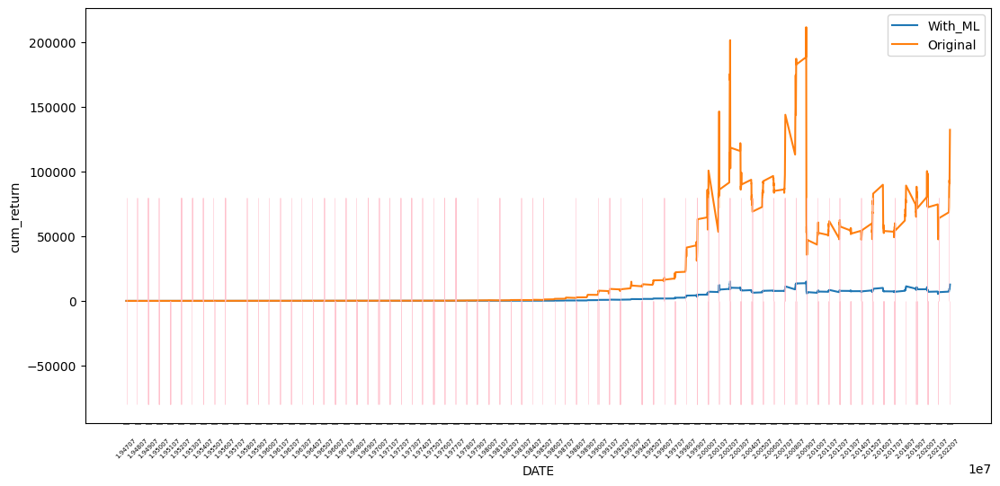

In [39]:
XGB_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_XGB_Result,
                                                 WML,
                                                 'XGB_PROB_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

### LGBM

In [40]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

**************************************************

LGBM Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.24      0.28       316
         1.0       0.65      0.75      0.69       590

    accuracy                           0.57       906
   macro avg       0.49      0.49      0.48       906
weighted avg       0.54      0.57      0.55       906


accuracy : 0.5684326710816777

precision : 0.6461086637298091

recall : 0.7457627118644068

F1-Score : 0.6923682140047208



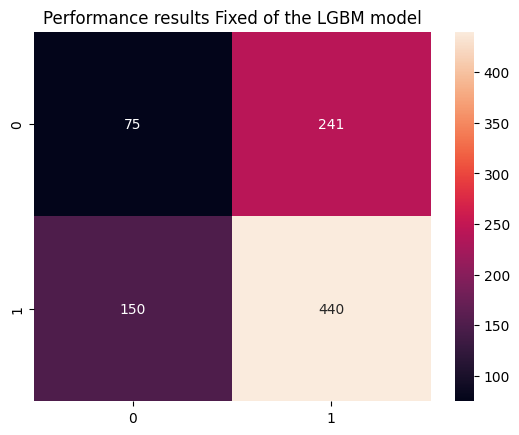


Feature Importance of the model



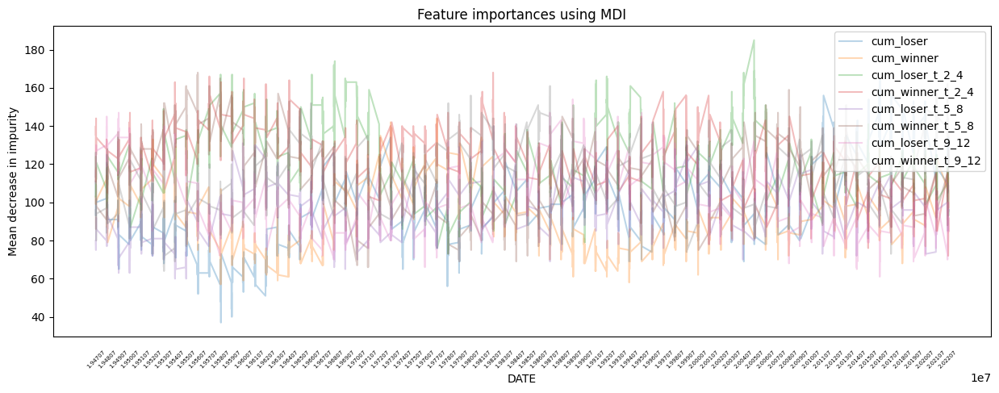

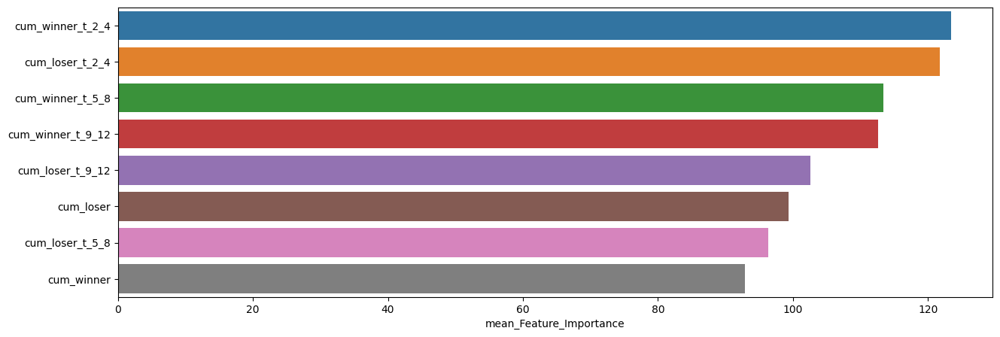

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,123.391832,168,72
cum_loser_t_2_4,121.731788,185,73
cum_winner_t_5_8,113.335541,168,66
cum_winner_t_9_12,112.610375,162,64
cum_loser_t_9_12,102.524283,154,61
cum_loser,99.386313,164,37
cum_loser_t_5_8,96.317881,132,60
cum_winner,92.846578,144,57


In [41]:
Fixed_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM, # 사용할 모델
                                    model_name='LGBM', # 사용한 모델 명
                                    plot=True, # 모델 성능 지표 시각화 여부
                                    plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.33      0.35        75
         1.0       0.69      0.72      0.70       151

    accuracy                           0.59       226
   macro avg       0.53      0.53      0.53       226
weighted avg       0.58      0.59      0.59       226


accuracy : 0.5929203539823009

precision : 0.6855345911949685

recall : 0.7218543046357616

F1-Score : 0.7032258064516129



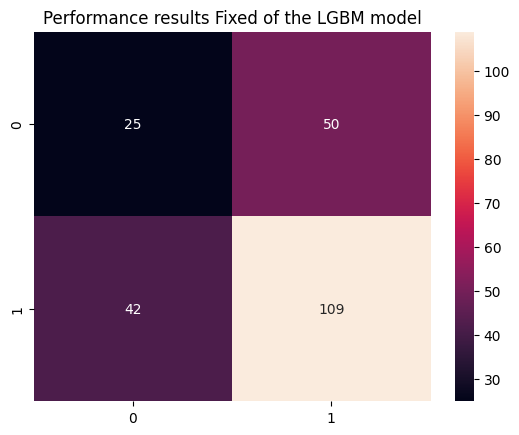


Feature Importance of the model



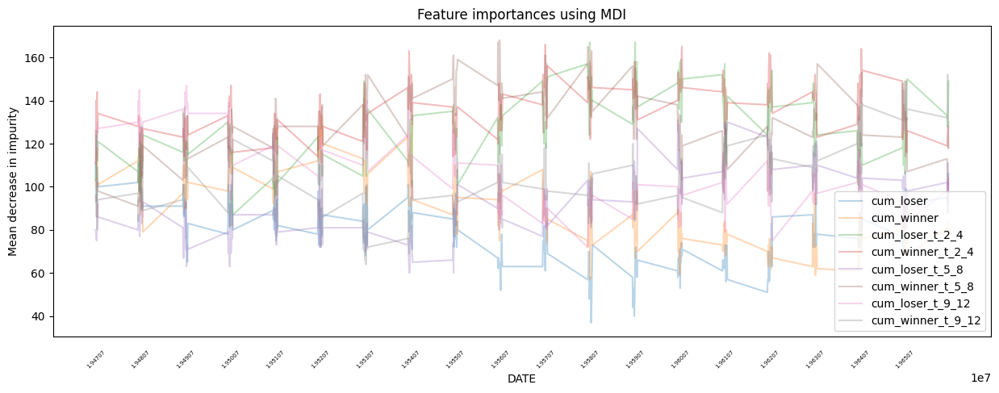

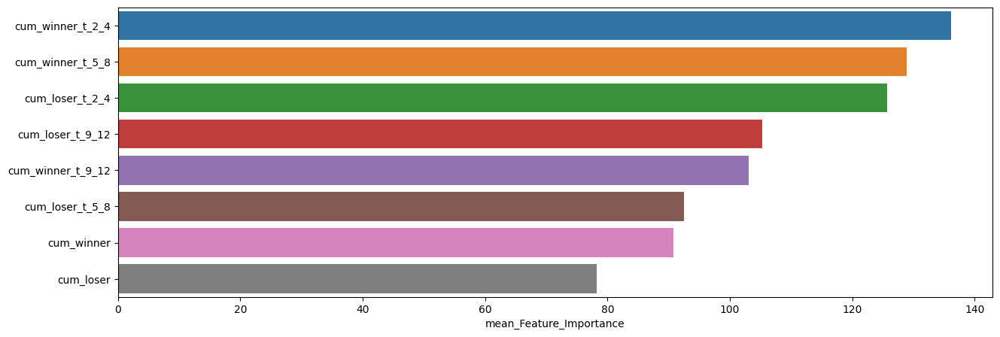

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,136.101770,166,105
cum_winner_t_5_8,128.898230,168,86
cum_loser_t_2_4,125.650442,167,87
cum_loser_t_9_12,105.252212,147,72
cum_winner_t_9_12,103.066372,152,64
cum_loser_t_5_8,92.530973,131,60
cum_winner,90.796460,133,57
cum_loser,78.247788,125,37



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.19      0.15      0.17        75
         1.0       0.62      0.70      0.66       151

    accuracy                           0.51       226
   macro avg       0.41      0.42      0.41       226
weighted avg       0.48      0.51      0.49       226


accuracy : 0.5132743362831859

precision : 0.621301775147929

recall : 0.695364238410596

F1-Score : 0.65625



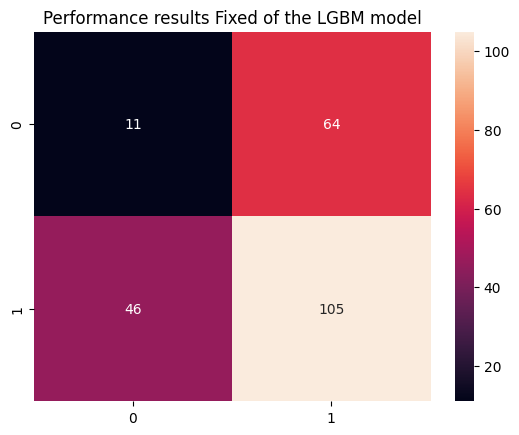


Feature Importance of the model



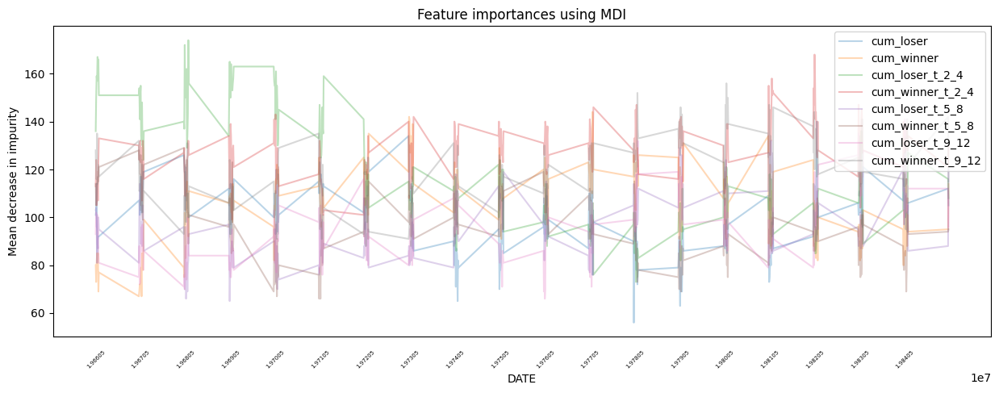

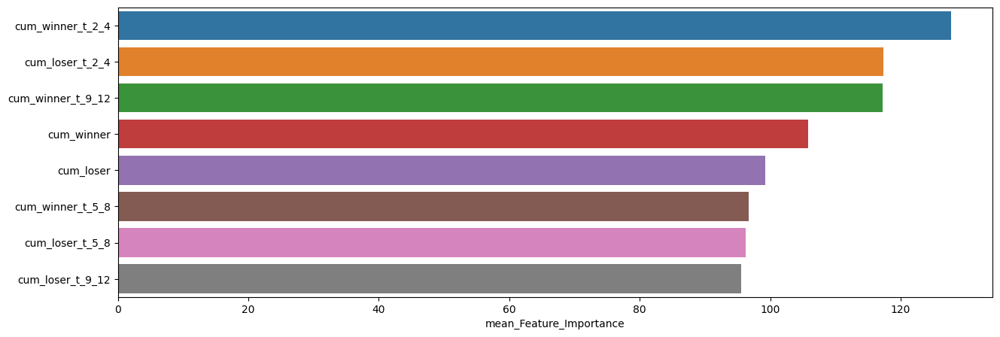

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,127.707965,168,99
cum_loser_t_2_4,117.305310,174,73
cum_winner_t_9_12,117.256637,156,88
cum_winner,105.827434,144,67
cum_loser,99.194690,140,56
cum_winner_t_5_8,96.690265,129,66
cum_loser_t_5_8,96.221239,132,65
cum_loser_t_9_12,95.566372,141,66



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.31      0.16      0.21        70
         1.0       0.69      0.85      0.76       156

    accuracy                           0.63       226
   macro avg       0.50      0.50      0.49       226
weighted avg       0.57      0.63      0.59       226


accuracy : 0.6327433628318584

precision : 0.6910994764397905

recall : 0.8461538461538461

F1-Score : 0.760806916426513



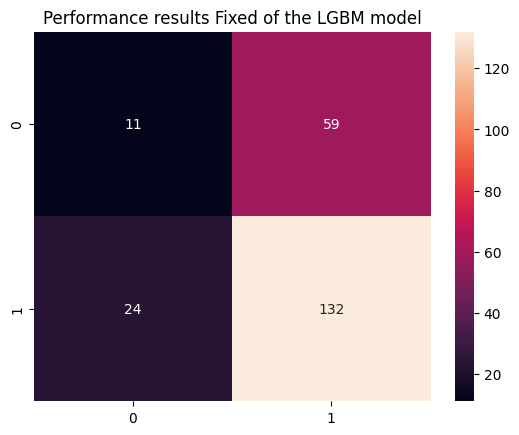


Feature Importance of the model



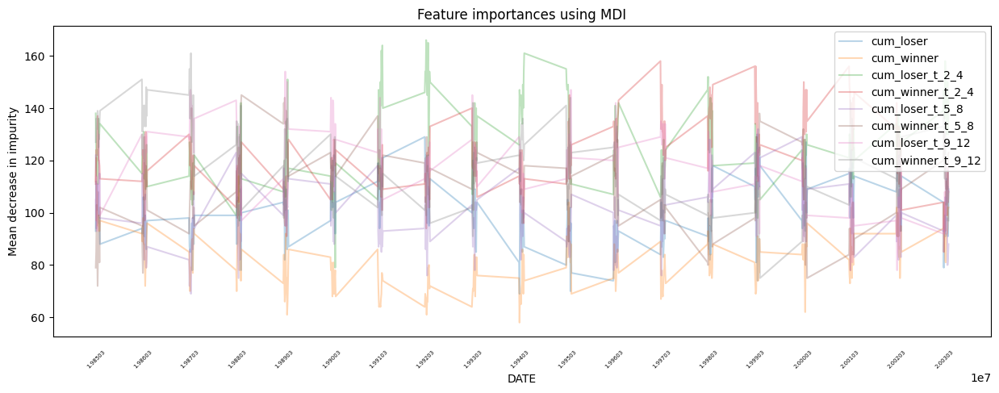

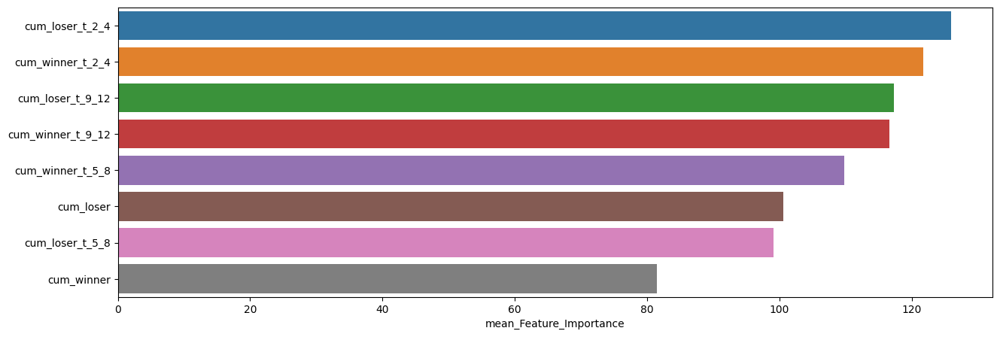

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_2_4,125.902655,166,79
cum_winner_t_2_4,121.725664,158,85
cum_loser_t_9_12,117.292035,154,78
cum_winner_t_9_12,116.601770,161,74
cum_winner_t_5_8,109.752212,145,72
cum_loser,100.623894,130,69
cum_loser_t_5_8,99.061947,132,69
cum_winner,81.446903,121,58



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.29      0.35        96
         1.0       0.58      0.71      0.64       132

    accuracy                           0.54       228
   macro avg       0.50      0.50      0.49       228
weighted avg       0.51      0.54      0.52       228


accuracy : 0.5350877192982456

precision : 0.5802469135802469

recall : 0.7121212121212122

F1-Score : 0.6394557823129252



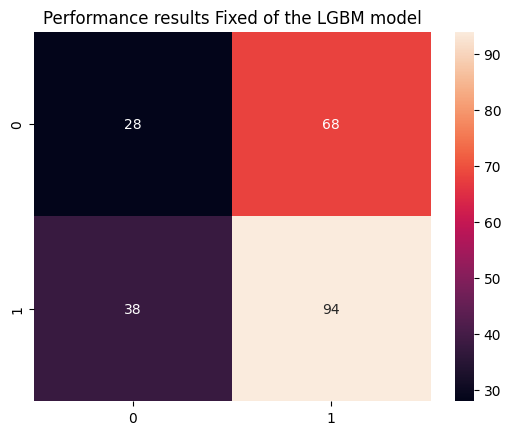


Feature Importance of the model



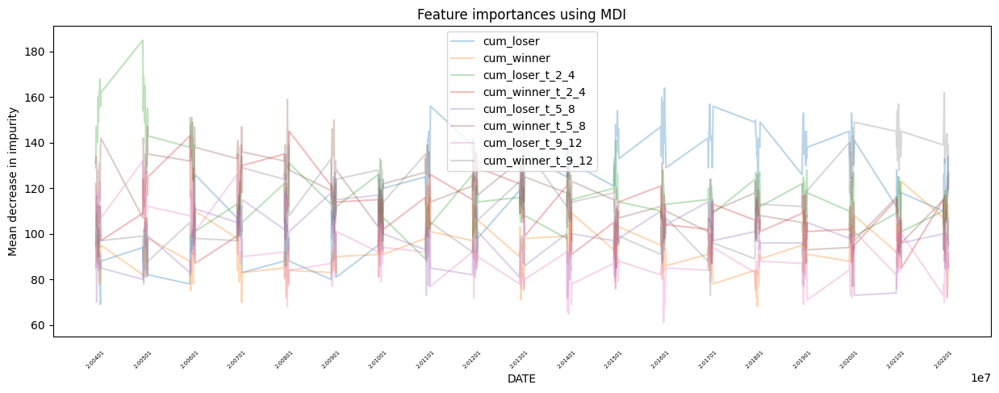

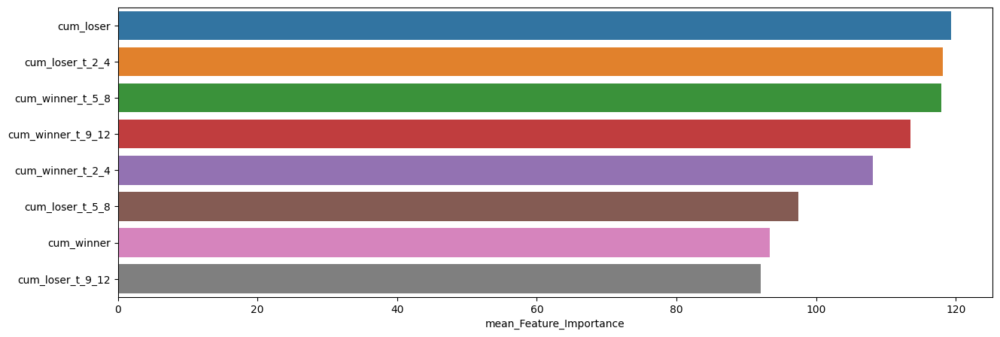

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser,119.302632,164,69
cum_loser_t_2_4,118.100877,185,86
cum_winner_t_5_8,117.960526,159,85
cum_winner_t_9_12,113.508772,162,73
cum_winner_t_2_4,108.166667,145,72
cum_loser_t_5_8,97.447368,126,70
cum_winner,93.311404,123,68
cum_loser_t_9_12,92.078947,132,61


In [42]:
slice_feature_importance(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                        4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                        'Fixed', # Rolling Windows Method
                        'LGBM') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



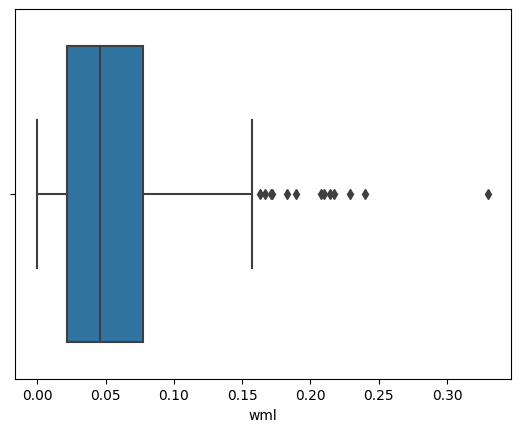

,count,mean,std,min,25%,50%,75%,max
wml,440.0,0.055093,0.045297,0.000128,0.021945,0.045874,0.077301,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



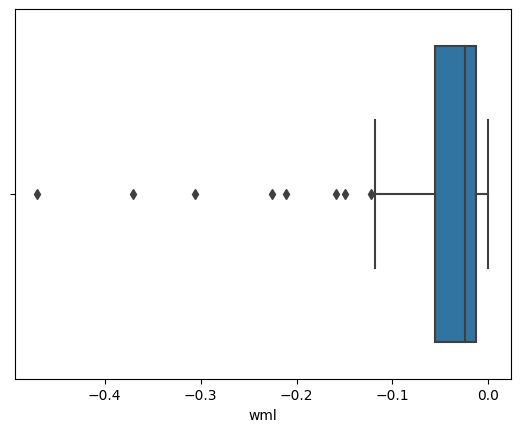

,count,mean,std,min,25%,50%,75%,max
wml,75.0,-0.055411,0.082612,-0.469903,-0.055881,-0.024247,-0.013329,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



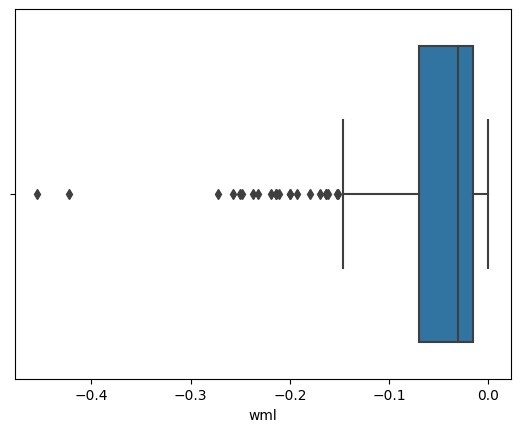

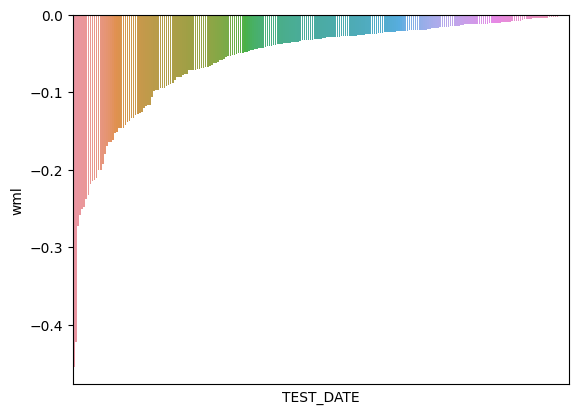

,count,mean,std,min,25%,50%,75%,max
wml,241.0,-0.056591,0.067495,-0.454349,-0.069483,-0.030902,-0.015309,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



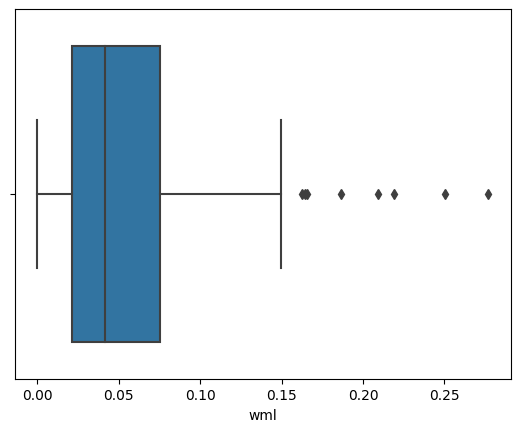

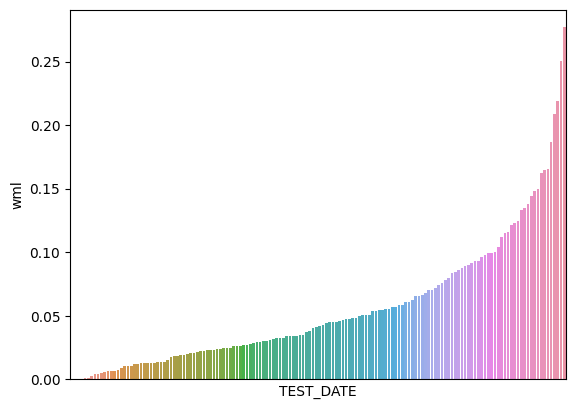

,count,mean,std,min,25%,50%,75%,max
wml,150.0,0.055709,0.051154,0.000007,0.021113,0.04154,0.075198,0.276912


In [43]:
LGBM_A0_P1, LGBM_A1_P0 = What_Pred(Fixed_LGBM_Result,
                                   WML,
                                   'LGBM')

Sharpe Ratio : 0.64935

최근 누적 수익률

  2022년-12월 -> 4699.34
  2022년-11월 -> 4233.92
  2022년-10월 -> 4027.31
  2022년-09월 -> 3566.01
  2022년-08월 -> 3566.01

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2008년-06월 -> 13154.17
  2등 : 2008년-05월 -> 13154.17
  3등 : 2008년-04월 -> 12654.23
  4등 : 2007년-12월 -> 12630.71
  5등 : 2008년-03월 -> 12440.00
  6등 : 2007년-11월 -> 11726.55
  7등 : 2008년-11월 -> 11651.51
  8등 : 2008년-10월 -> 11651.51
  9등 : 2008년-02월 -> 11635.36
  10등 : 2002년-09월 -> 11401.60



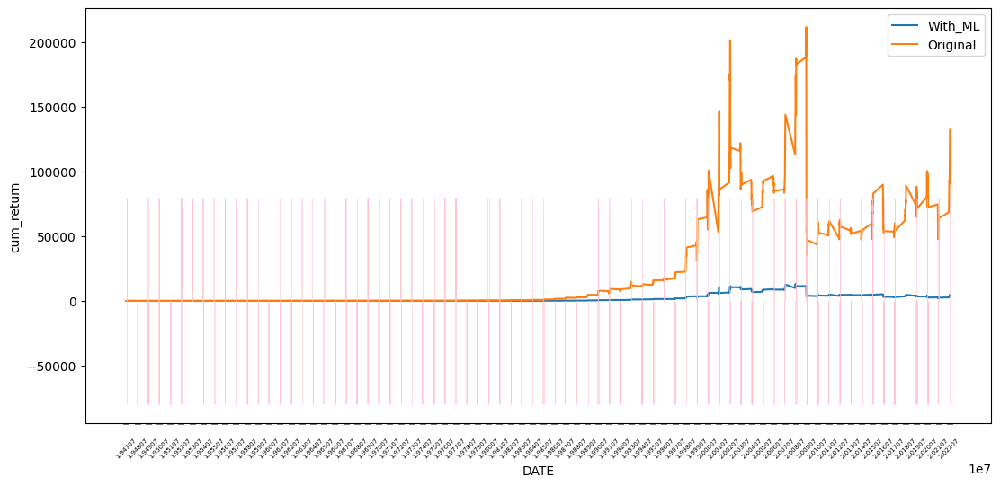

In [44]:
LGBM_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PRED_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

Sharpe Ratio : 0.71656

최근 누적 수익률

  2022년-12월 -> 5744.62
  2022년-11월 -> 5319.35
  2022년-10월 -> 5185.99
  2022년-09월 -> 4724.94
  2022년-08월 -> 4666.59

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 9593.44
  2등 : 2009년-02월 -> 8822.84
  3등 : 2002년-07월 -> 8503.46
  4등 : 2008년-11월 -> 8418.51
  5등 : 2009년-01월 -> 8399.60
  6등 : 2008년-06월 -> 8364.75
  7등 : 2002년-08월 -> 8303.52
  8등 : 2008년-12월 -> 8287.71
  9등 : 2002년-06월 -> 8242.17
  10등 : 2008년-10월 -> 8121.48



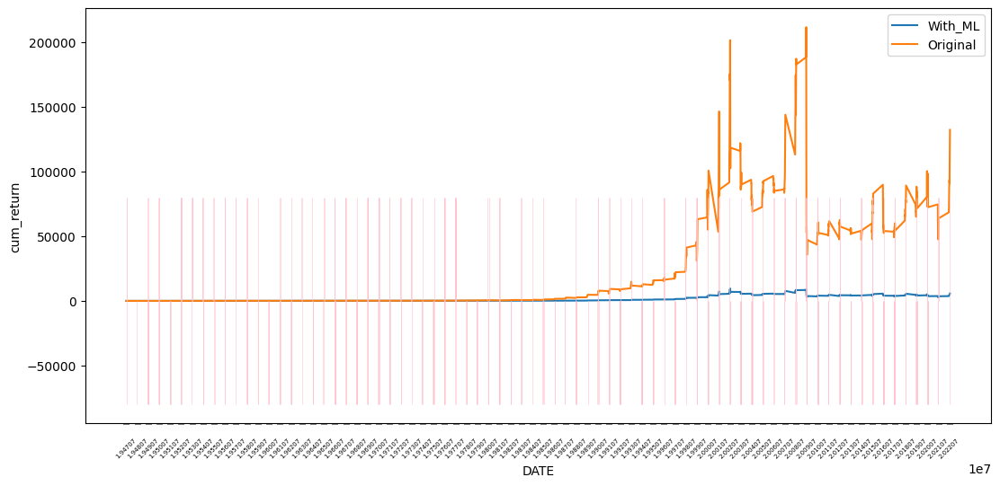

In [45]:
LGBM_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

## Rolling Expanding Windows

### Random Forest

In [46]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

**************************************************

RDF Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.14      0.19       316
         1.0       0.65      0.85      0.74       590

    accuracy                           0.60       906
   macro avg       0.49      0.49      0.46       906
weighted avg       0.54      0.60      0.55       906


accuracy : 0.6026490066225165

precision : 0.6481958762886598

recall : 0.8525423728813559

F1-Score : 0.7364568081991215



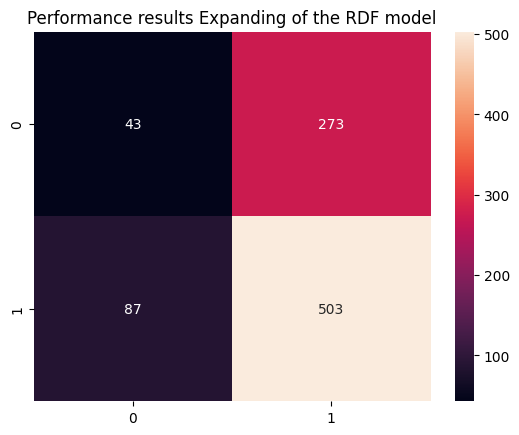


Feature Importance of the model



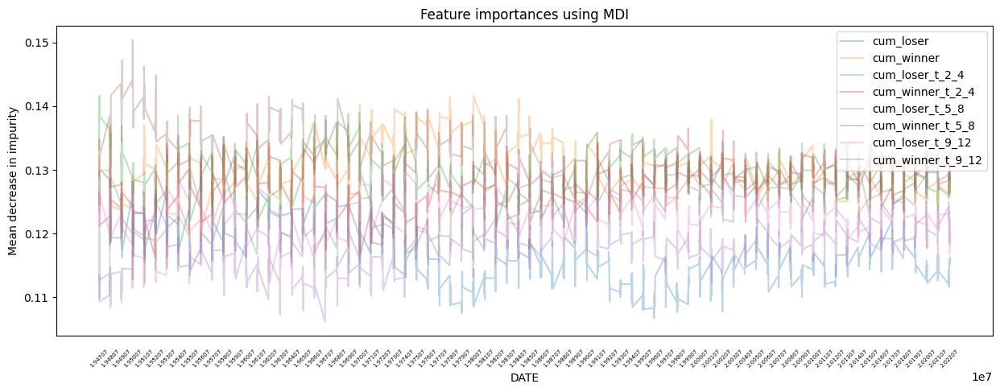

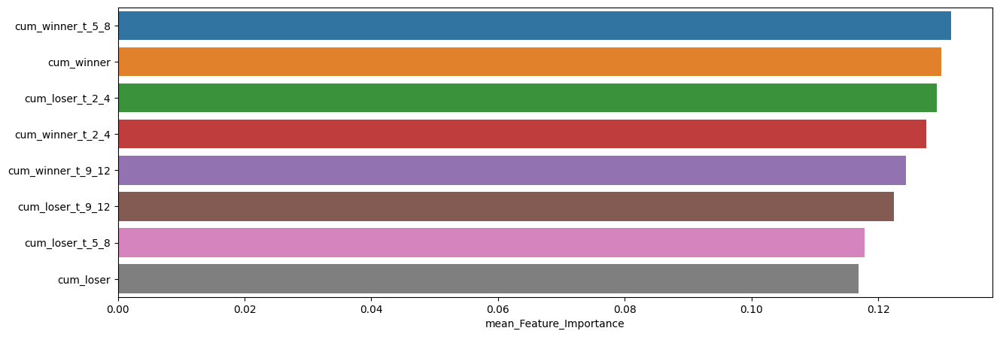

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.131477,0.150360,0.117642
cum_winner,0.130007,0.141561,0.118753
cum_loser_t_2_4,0.129218,0.141665,0.121014
cum_winner_t_2_4,0.127574,0.138844,0.112824
cum_winner_t_9_12,0.124358,0.136520,0.109336
cum_loser_t_9_12,0.122535,0.131642,0.111624
cum_loser_t_5_8,0.117877,0.128086,0.106164
cum_loser,0.116953,0.130107,0.106733


In [47]:
Expanding_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=RDF, # 사용할 모델
                                      model_name='RDF', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.17      0.23        75
         1.0       0.67      0.83      0.74       151

    accuracy                           0.62       226
   macro avg       0.51      0.50      0.49       226
weighted avg       0.56      0.62      0.57       226


accuracy : 0.6150442477876106

precision : 0.6702127659574468

recall : 0.8344370860927153

F1-Score : 0.743362831858407



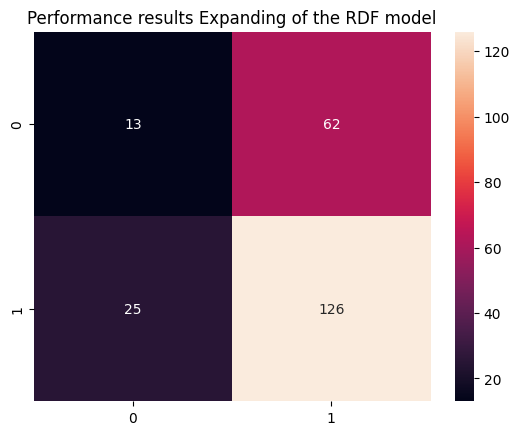


Feature Importance of the model



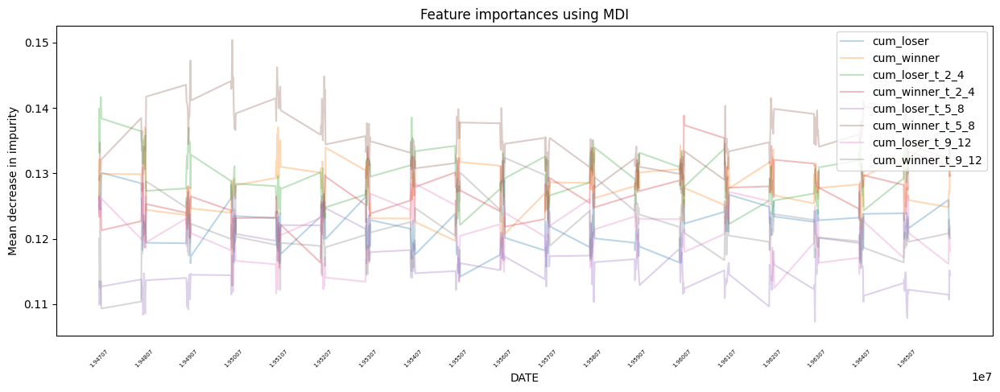

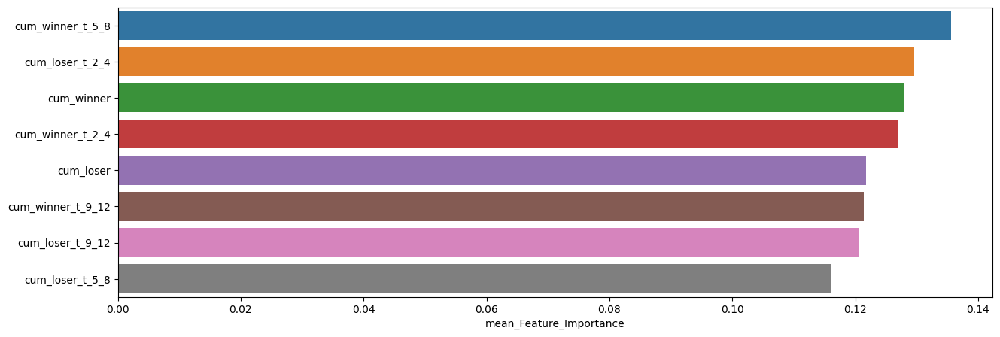

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.135565,0.150360,0.126525
cum_loser_t_2_4,0.129637,0.141665,0.122106
cum_winner,0.128038,0.137840,0.118753
cum_winner_t_2_4,0.127023,0.138844,0.112824
cum_loser,0.121729,0.130107,0.114202
cum_winner_t_9_12,0.121344,0.132339,0.109336
cum_loser_t_9_12,0.120514,0.130707,0.111624
cum_loser_t_5_8,0.116150,0.128086,0.107312



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.27      0.13      0.18        75
         1.0       0.66      0.82      0.73       151

    accuracy                           0.59       226
   macro avg       0.46      0.48      0.45       226
weighted avg       0.53      0.59      0.55       226


accuracy : 0.5929203539823009

precision : 0.656084656084656

recall : 0.8211920529801324

F1-Score : 0.7294117647058823



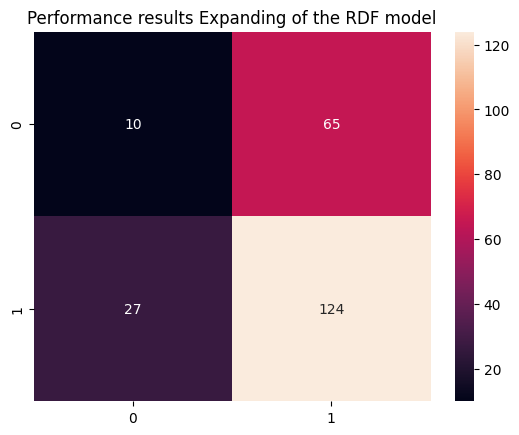


Feature Importance of the model



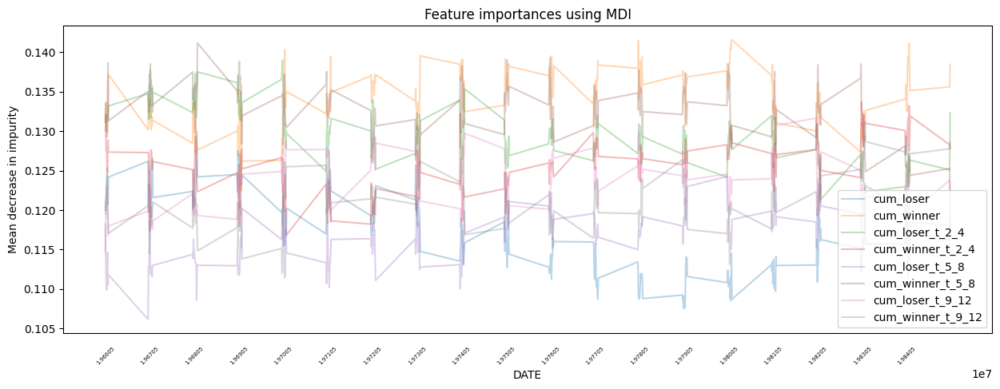

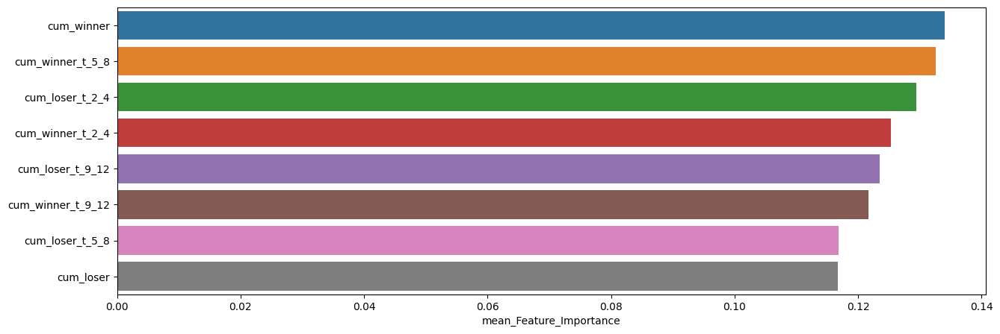

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,0.133979,0.141561,0.122461
cum_winner_t_5_8,0.132614,0.141145,0.117642
cum_loser_t_2_4,0.129379,0.138984,0.121366
cum_winner_t_2_4,0.125262,0.133672,0.116869
cum_loser_t_9_12,0.123537,0.131642,0.114706
cum_winner_t_9_12,0.121625,0.131028,0.112003
cum_loser_t_5_8,0.116854,0.124264,0.106164
cum_loser,0.116751,0.129813,0.107506



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.14      0.20        70
         1.0       0.70      0.88      0.78       156

    accuracy                           0.65       226
   macro avg       0.53      0.51      0.49       226
weighted avg       0.59      0.65      0.60       226


accuracy : 0.6548672566371682

precision : 0.696969696969697

recall : 0.8846153846153846

F1-Score : 0.7796610169491526



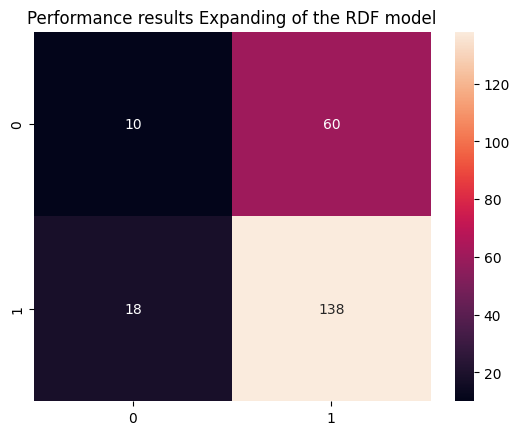


Feature Importance of the model



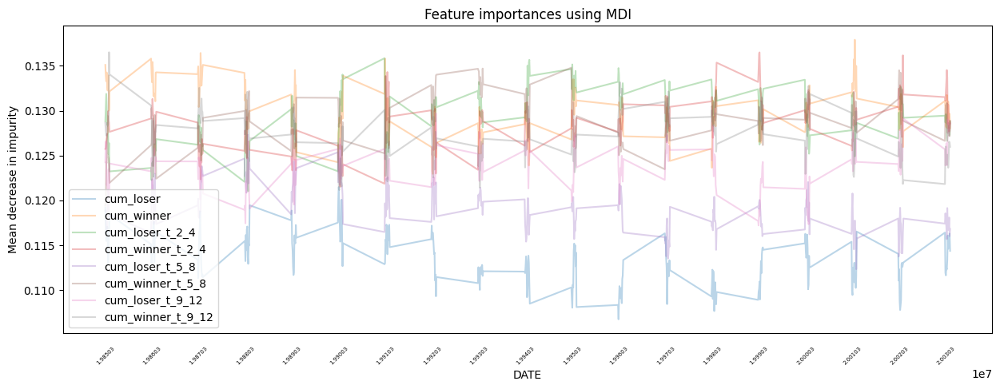

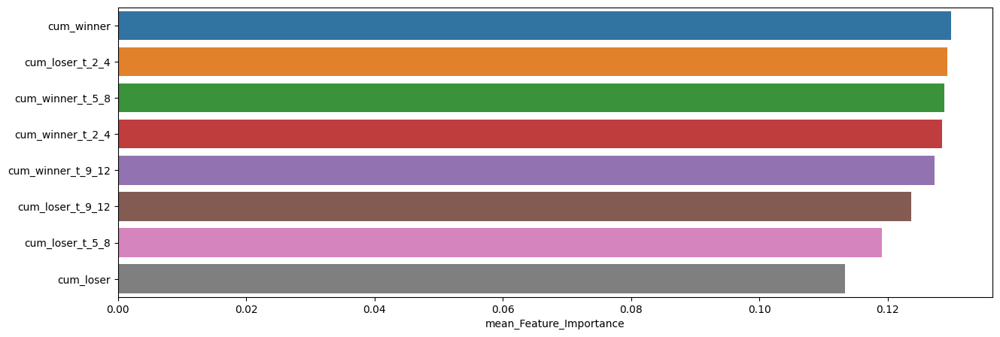

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,0.129879,0.137915,0.122959
cum_loser_t_2_4,0.129297,0.135857,0.121014
cum_winner_t_5_8,0.128881,0.134801,0.119411
cum_winner_t_2_4,0.128456,0.136508,0.121508
cum_winner_t_9_12,0.127354,0.136520,0.121145
cum_loser_t_9_12,0.123678,0.129713,0.117201
cum_loser_t_5_8,0.119107,0.127309,0.112325
cum_loser,0.113350,0.121484,0.106733



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.10      0.16        96
         1.0       0.57      0.87      0.69       132

    accuracy                           0.55       228
   macro avg       0.47      0.49      0.43       228
weighted avg       0.49      0.55      0.47       228


accuracy : 0.5482456140350878

precision : 0.572139303482587

recall : 0.8712121212121212

F1-Score : 0.6906906906906908



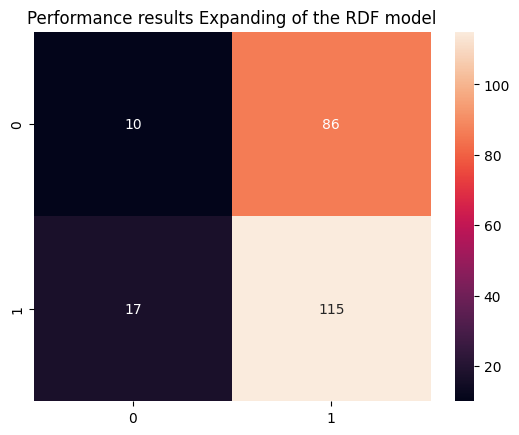


Feature Importance of the model



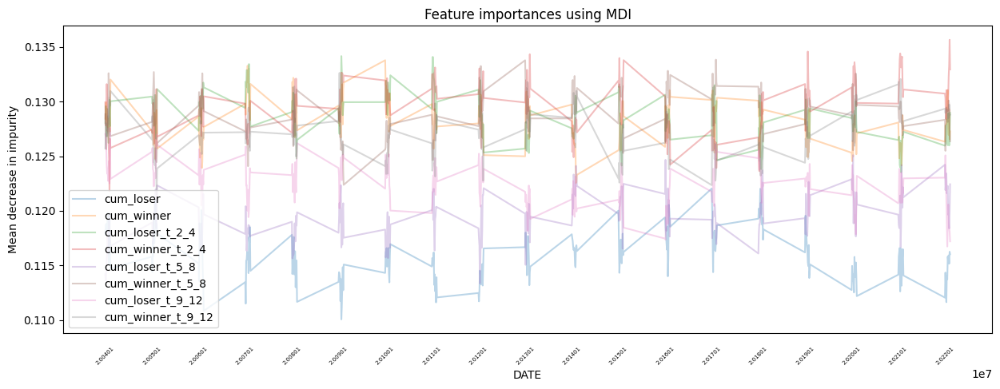

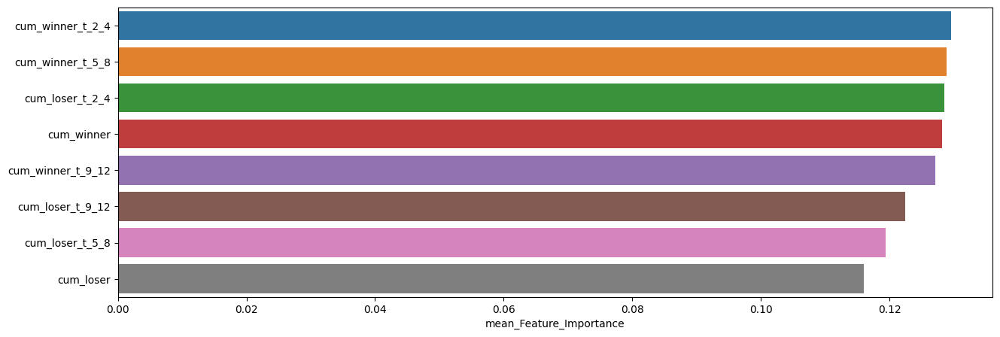

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,0.129538,0.135643,0.121811
cum_winner_t_5_8,0.128874,0.133827,0.122380
cum_loser_t_2_4,0.128566,0.134153,0.123528
cum_winner,0.128150,0.133775,0.122547
cum_winner_t_9_12,0.127085,0.132620,0.121503
cum_loser_t_9_12,0.122411,0.127607,0.116738
cum_loser_t_5_8,0.119385,0.125093,0.113364
cum_loser,0.115992,0.122044,0.110077


In [48]:
slice_feature_importance(Expanding_RDF_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'RDF') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



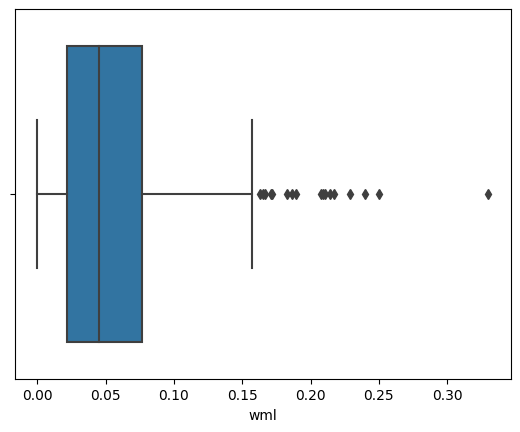

,count,mean,std,min,25%,50%,75%,max
wml,503.0,0.055213,0.046189,0.000007,0.021926,0.045275,0.076866,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



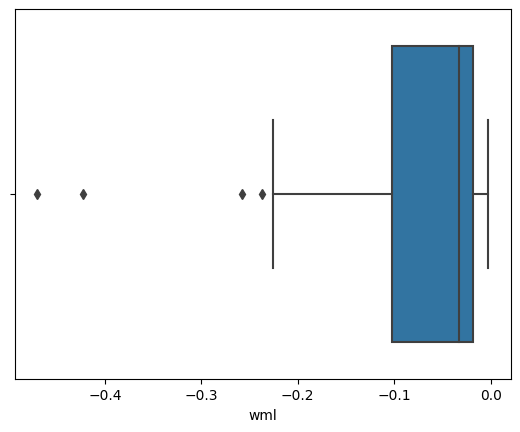

,count,mean,std,min,25%,50%,75%,max
wml,43.0,-0.080053,0.105407,-0.469903,-0.102428,-0.032673,-0.018464,-0.002454



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



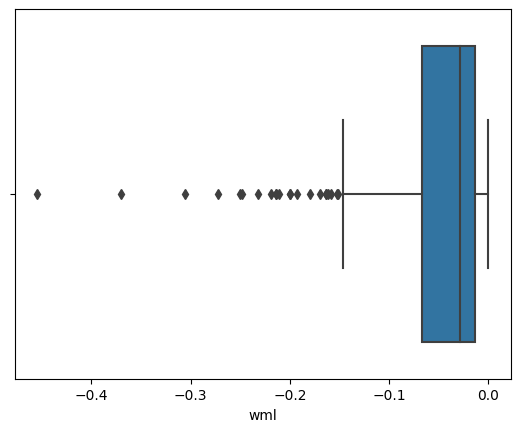

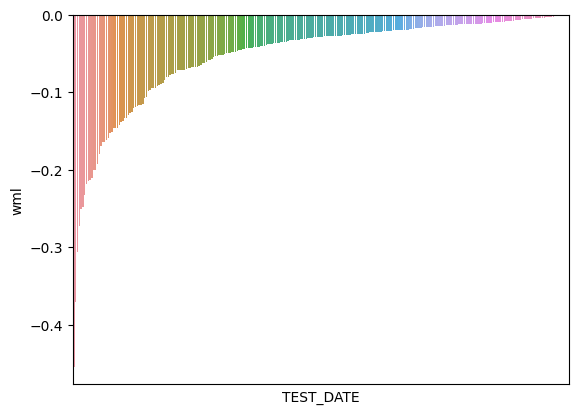

,count,mean,std,min,25%,50%,75%,max
wml,273.0,-0.052571,0.063702,-0.454349,-0.067433,-0.028471,-0.01379,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



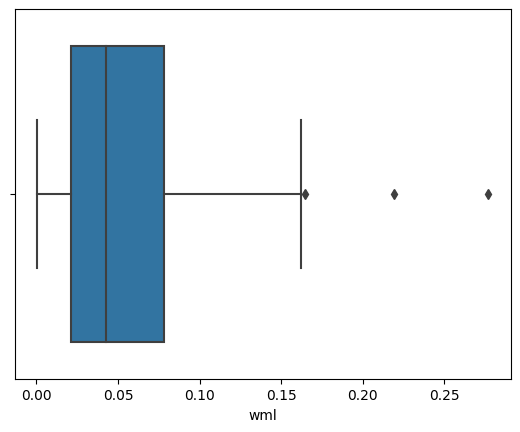

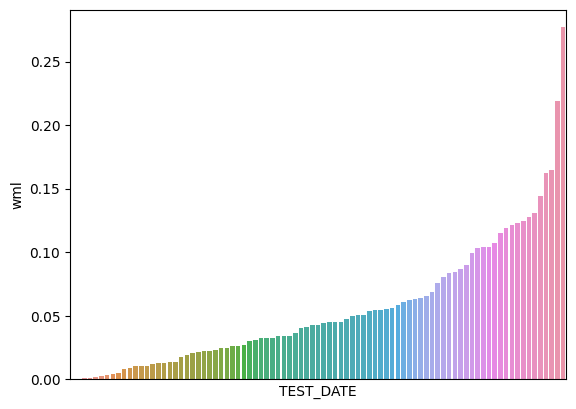

,count,mean,std,min,25%,50%,75%,max
wml,87.0,0.055463,0.050542,0.000627,0.021061,0.042914,0.078171,0.276912


In [49]:
RDF_A0_P1, RDF_A1_P0 = What_Pred(Expanding_RDF_Result, WML, 'RDF')

Sharpe Ratio : 0.66977

최근 누적 수익률

  2022년-12월 -> 67484.57
  2022년-11월 -> 60802.32
  2022년-10월 -> 57835.79
  2022년-09월 -> 51212.74
  2022년-08월 -> 46559.91

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 81451.12
  2등 : 2002년-07월 -> 70926.56
  3등 : 2002년-08월 -> 68871.73
  4등 : 2022년-12월 -> 67484.57
  5등 : 2002년-06월 -> 67247.83
  6등 : 2002년-10월 -> 65718.92
  7등 : 2022년-11월 -> 60802.32
  8등 : 2008년-06월 -> 58922.66
  9등 : 2008년-05월 -> 58922.66
  10등 : 2022년-10월 -> 57835.79



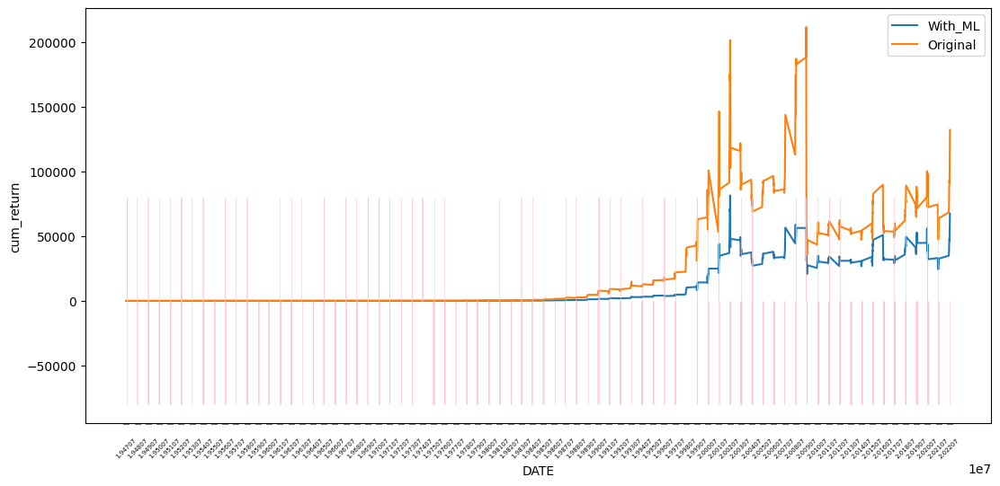

In [50]:
RDF_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_RDF_Result,
                                                 WML,
                                                 'RDF_PRED_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.73467

최근 누적 수익률

  2022년-12월 -> 7118.82
  2022년-11월 -> 6637.32
  2022년-10월 -> 6448.75
  2022년-09월 -> 5920.38
  2022년-08월 -> 5622.54

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 7118.82
  2등 : 2022년-11월 -> 6637.32
  3등 : 2022년-10월 -> 6448.75
  4등 : 2002년-09월 -> 6178.21
  5등 : 2020년-03월 -> 6109.56
  6등 : 2022년-09월 -> 5920.38
  7등 : 2016년-01월 -> 5799.67
  8등 : 2009년-02월 -> 5770.56
  9등 : 2022년-07월 -> 5706.11
  10등 : 2020년-09월 -> 5667.28



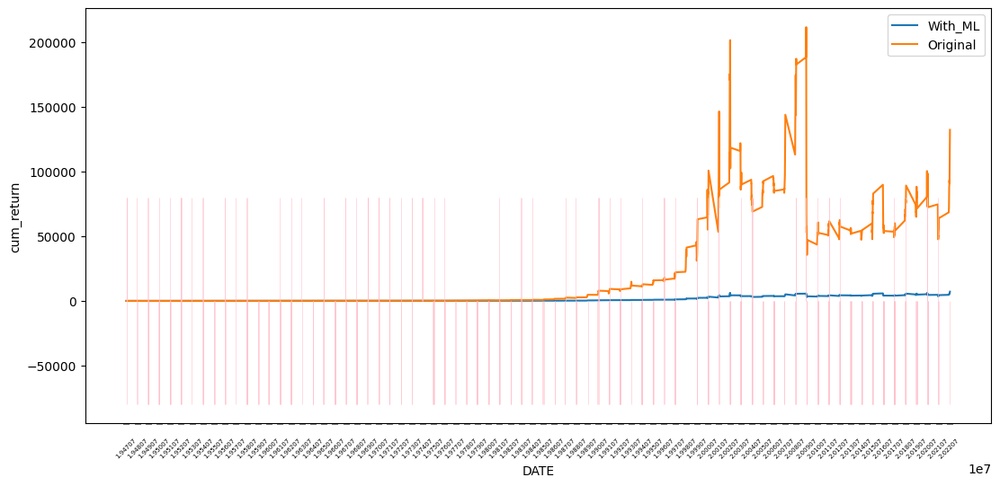

In [51]:
RDF_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_RDF_Result,
                                                 WML,
                                                 'RDF_PROB_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

### Grdient Boosting

In [52]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

**************************************************

GBC Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.15      0.21       316
         1.0       0.66      0.87      0.75       590

    accuracy                           0.62       906
   macro avg       0.52      0.51      0.48       906
weighted avg       0.56      0.62      0.56       906


accuracy : 0.6181015452538632

precision : 0.6556122448979592

recall : 0.8711864406779661

F1-Score : 0.7481804949053857



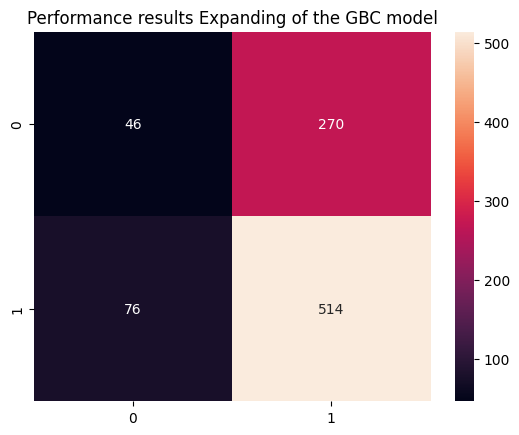


Feature Importance of the model



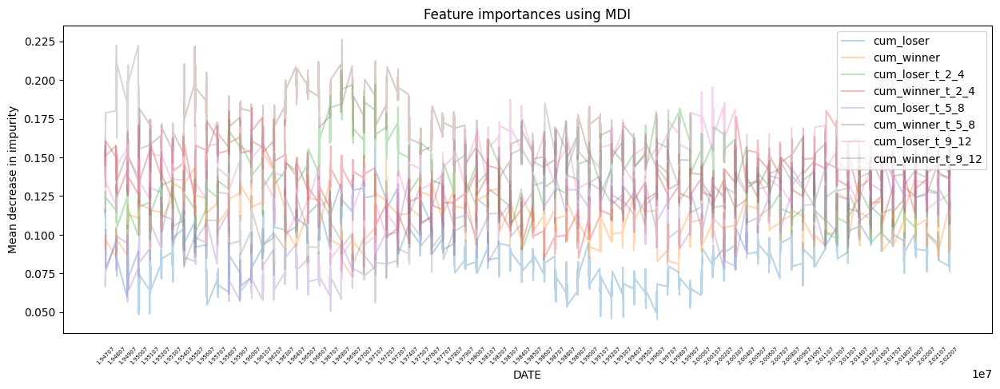

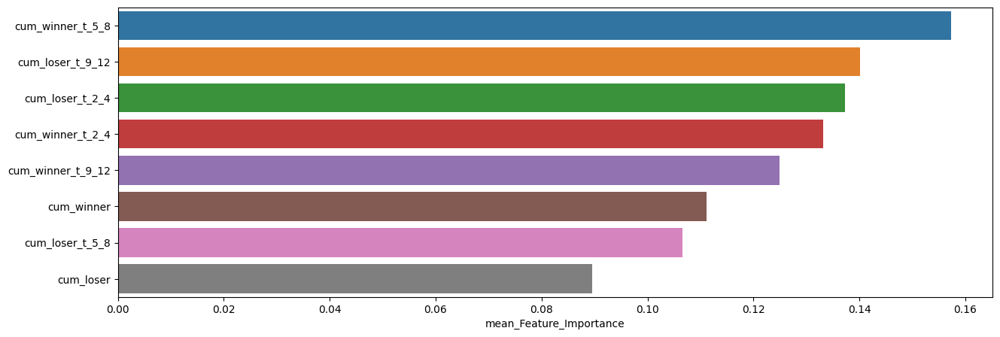

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.157278,0.226056,0.110878
cum_loser_t_9_12,0.140083,0.195454,0.076533
cum_loser_t_2_4,0.137248,0.205921,0.081427
cum_winner_t_2_4,0.133130,0.182259,0.083800
cum_winner_t_9_12,0.124939,0.222381,0.056195
cum_winner,0.111104,0.156233,0.073006
cum_loser_t_5_8,0.106637,0.150860,0.050596
cum_loser,0.089580,0.155995,0.045362


In [53]:
Expanding_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=GBC, # 사용할 모델
                                      model_name='GBC', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.45      0.24      0.31        75
         1.0       0.69      0.85      0.77       151

    accuracy                           0.65       226
   macro avg       0.57      0.55      0.54       226
weighted avg       0.61      0.65      0.62       226


accuracy : 0.6504424778761062

precision : 0.6935483870967742

recall : 0.8543046357615894

F1-Score : 0.7655786350148368



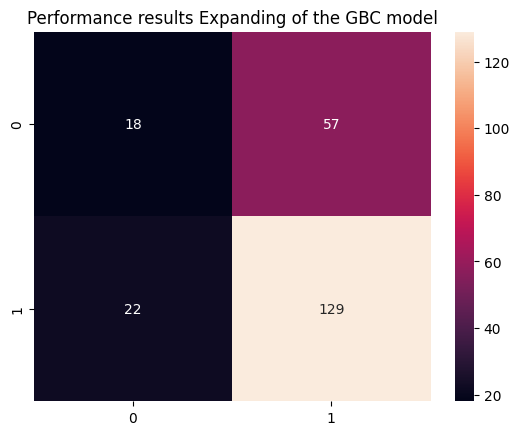


Feature Importance of the model



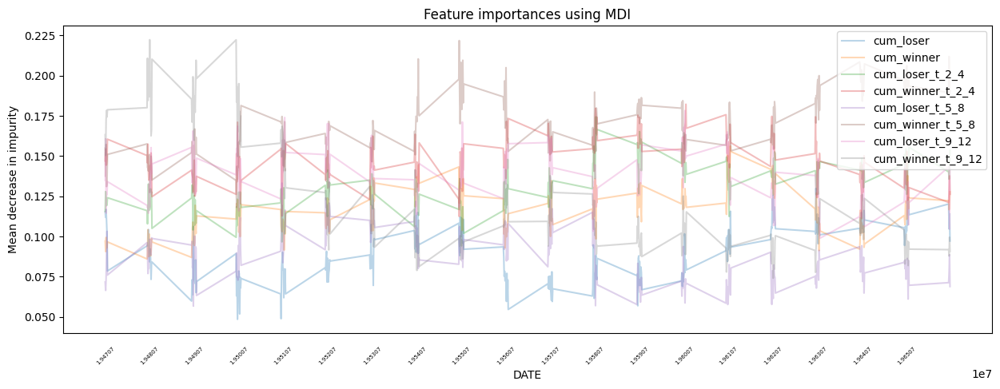

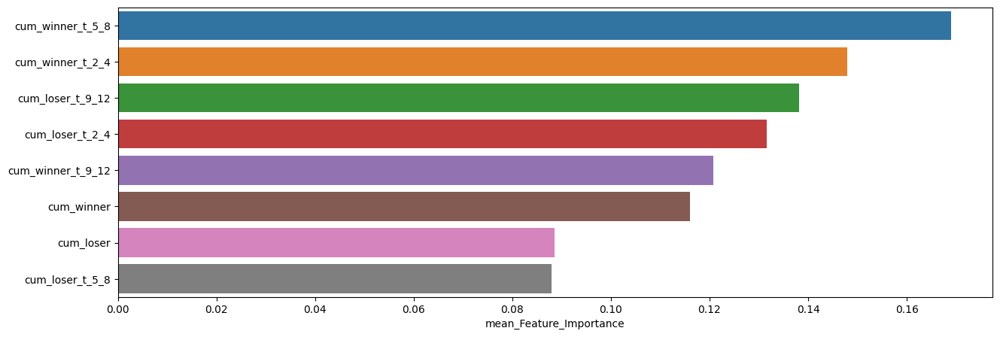

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.168943,0.221860,0.118202
cum_winner_t_2_4,0.147956,0.182259,0.111148
cum_loser_t_9_12,0.138141,0.178312,0.098941
cum_loser_t_2_4,0.131567,0.174410,0.094182
cum_winner_t_9_12,0.120693,0.222381,0.074122
cum_winner,0.116099,0.156233,0.086054
cum_loser,0.088578,0.129901,0.048527
cum_loser_t_5_8,0.088024,0.133237,0.056730



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.19      0.24        75
         1.0       0.67      0.81      0.73       151

    accuracy                           0.60       226
   macro avg       0.50      0.50      0.48       226
weighted avg       0.55      0.60      0.57       226


accuracy : 0.6017699115044248

precision : 0.6666666666666666

recall : 0.8079470198675497

F1-Score : 0.7305389221556886



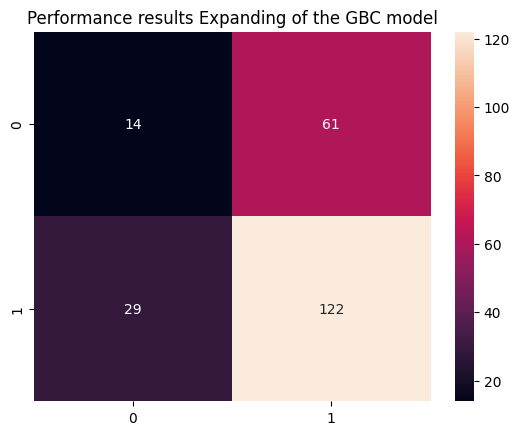


Feature Importance of the model



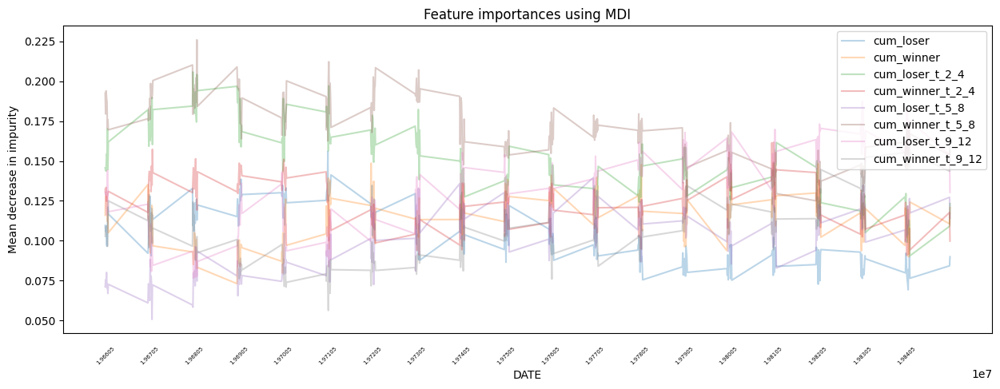

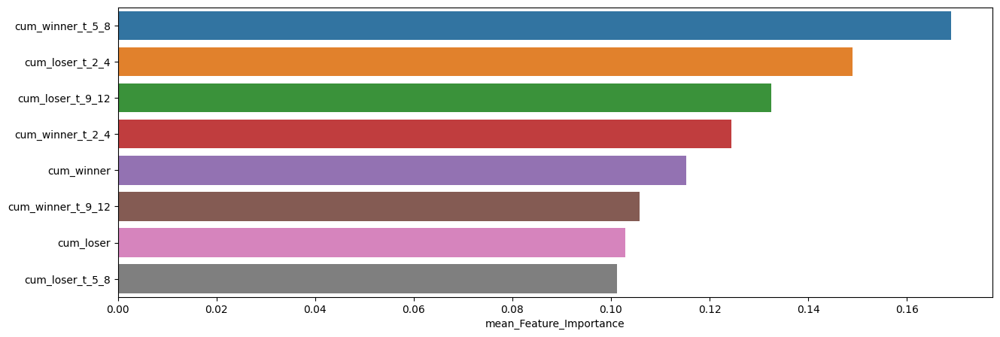

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.168942,0.226056,0.117856
cum_loser_t_2_4,0.149038,0.205921,0.090493
cum_loser_t_9_12,0.132443,0.187516,0.076533
cum_winner_t_2_4,0.124365,0.161752,0.090819
cum_winner,0.115254,0.148640,0.073006
cum_winner_t_9_12,0.105822,0.174142,0.056195
cum_loser,0.102952,0.155995,0.069148
cum_loser_t_5_8,0.101184,0.139532,0.050596



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.30      0.10      0.15        70
         1.0       0.69      0.90      0.78       156

    accuracy                           0.65       226
   macro avg       0.50      0.50      0.47       226
weighted avg       0.57      0.65      0.58       226


accuracy : 0.6504424778761062

precision : 0.6896551724137931

recall : 0.8974358974358975

F1-Score : 0.7799442896935934



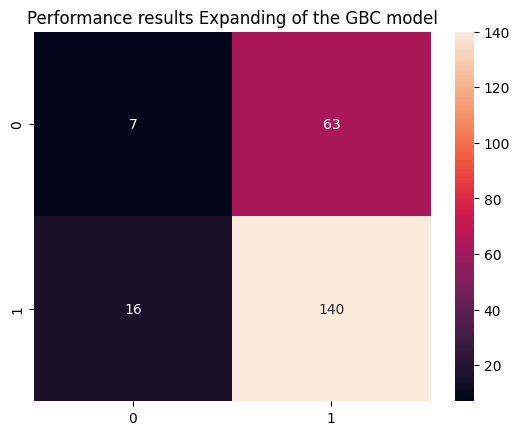


Feature Importance of the model



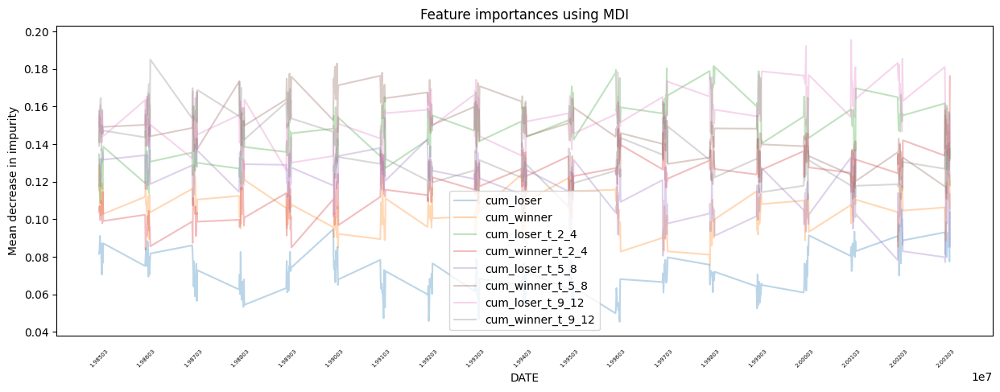

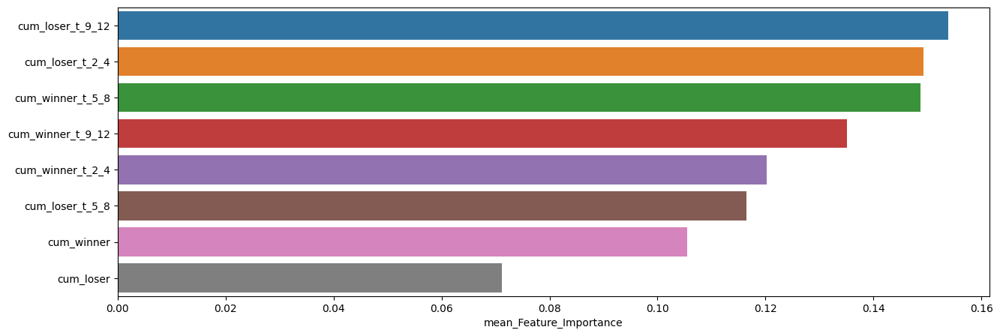

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.153793,0.195454,0.119824
cum_loser_t_2_4,0.149206,0.181653,0.108560
cum_winner_t_5_8,0.148634,0.183016,0.110878
cum_winner_t_9_12,0.135094,0.185064,0.106614
cum_winner_t_2_4,0.120198,0.176287,0.083800
cum_loser_t_5_8,0.116472,0.149266,0.077073
cum_winner,0.105453,0.131526,0.075676
cum_loser,0.071151,0.105096,0.045362



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.07      0.13        96
         1.0       0.58      0.93      0.72       132

    accuracy                           0.57       228
   macro avg       0.51      0.50      0.42       228
weighted avg       0.52      0.57      0.47       228


accuracy : 0.5701754385964912

precision : 0.5801886792452831

recall : 0.9318181818181818

F1-Score : 0.7151162790697674



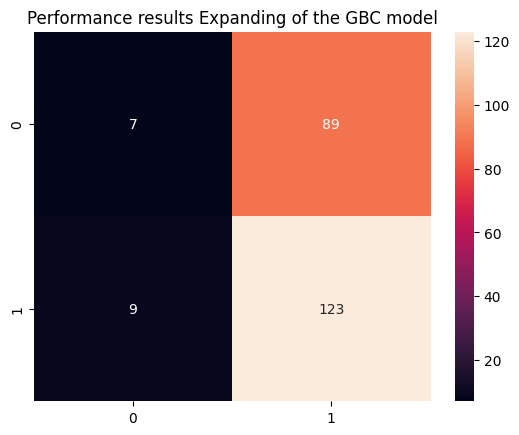


Feature Importance of the model



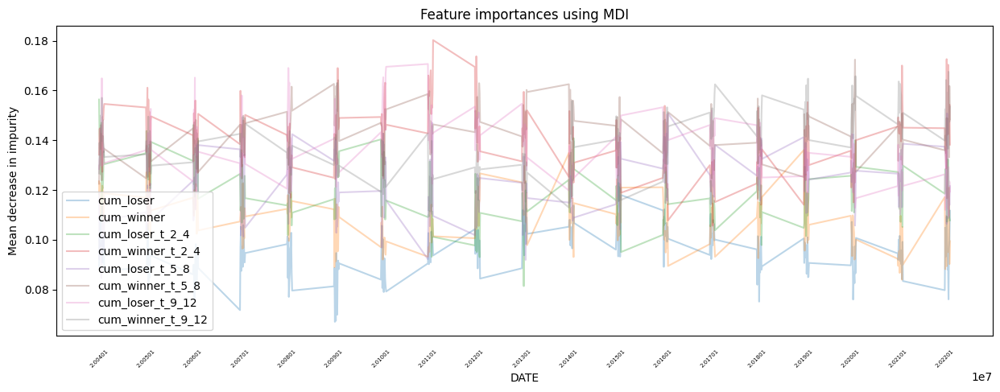

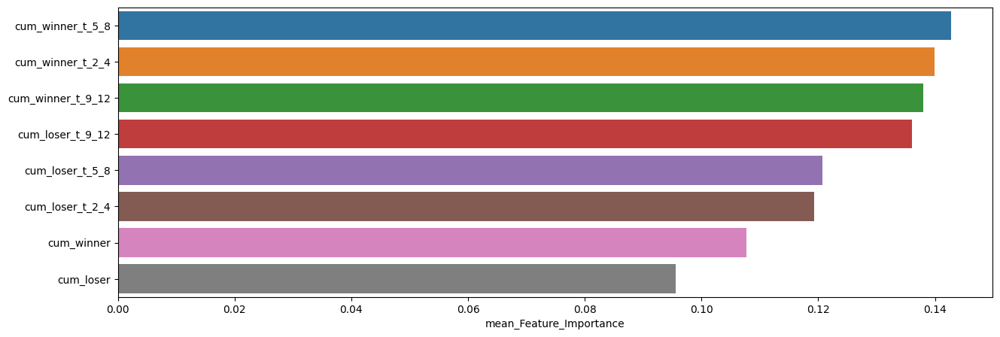

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.142724,0.172416,0.114772
cum_winner_t_2_4,0.139942,0.180247,0.105691
cum_winner_t_9_12,0.138031,0.167541,0.111390
cum_loser_t_9_12,0.135994,0.170657,0.109593
cum_loser_t_5_8,0.120745,0.150860,0.084622
cum_loser_t_2_4,0.119337,0.156386,0.081427
cum_winner,0.107641,0.136067,0.084014
cum_loser,0.095586,0.123274,0.067068


In [54]:
slice_feature_importance(Expanding_GBC_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'GBC') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



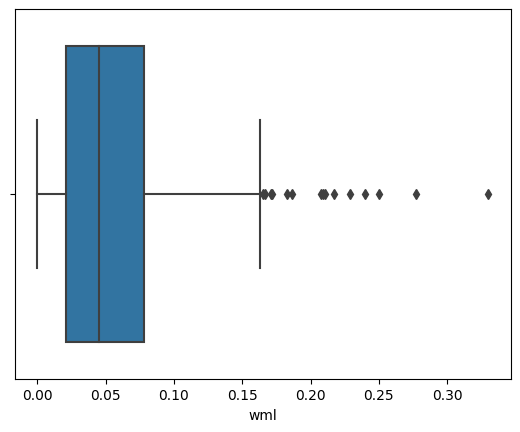

,count,mean,std,min,25%,50%,75%,max
wml,514.0,0.055041,0.0465,0.000007,0.020788,0.04509,0.07798,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



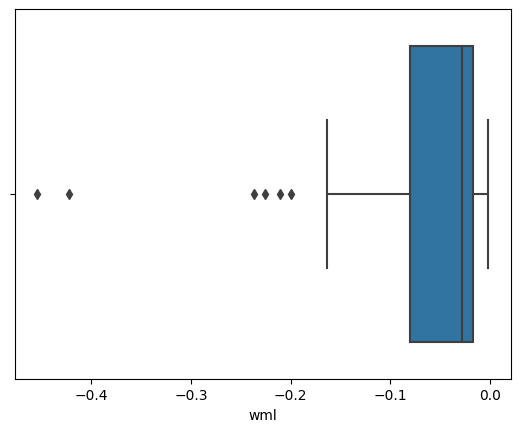

,count,mean,std,min,25%,50%,75%,max
wml,46.0,-0.073893,0.100836,-0.454349,-0.080021,-0.027554,-0.016937,-0.00129



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



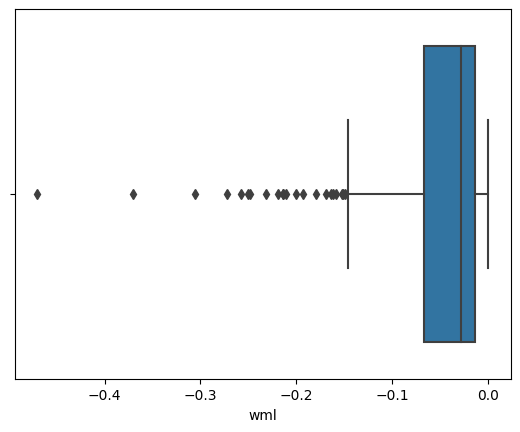

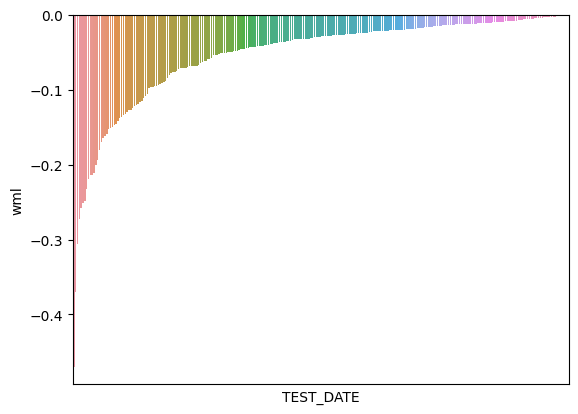

,count,mean,std,min,25%,50%,75%,max
wml,270.0,-0.053316,0.064648,-0.469903,-0.067352,-0.02887,-0.013984,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



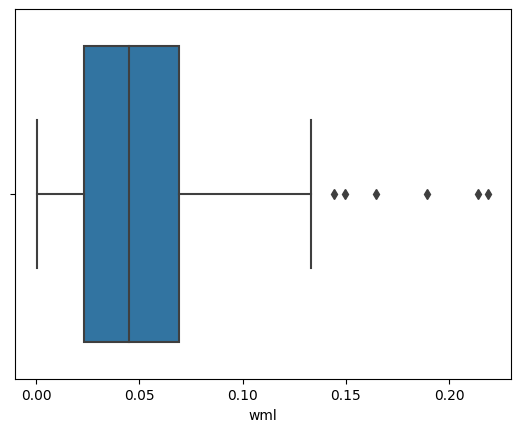

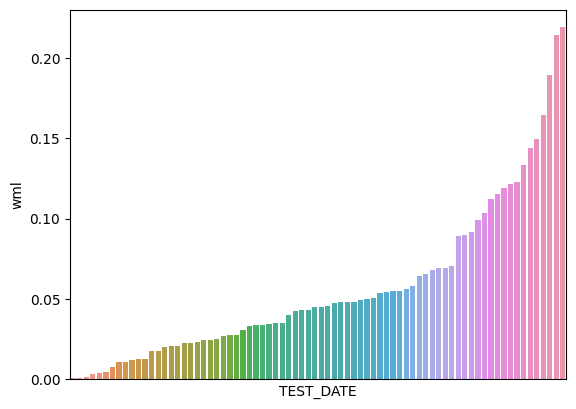

,count,mean,std,min,25%,50%,75%,max
wml,76.0,0.056662,0.04916,0.000627,0.023063,0.045127,0.069198,0.219012


In [55]:
GBC_A0_P1, GBC_A1_P0 = What_Pred(Expanding_GBC_Result, WML, 'GBC')

Sharpe Ratio : 0.65777

최근 누적 수익률

  2022년-12월 -> 102918.92
  2022년-11월 -> 92728.04
  2022년-10월 -> 88203.90
  2022년-09월 -> 78103.32
  2022년-08월 -> 71007.45

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 102918.92
  2등 : 2022년-11월 -> 92728.04
  3등 : 2022년-10월 -> 88203.90
  4등 : 2020년-03월 -> 81797.37
  5등 : 2020년-09월 -> 80358.56
  6등 : 2020년-10월 -> 80081.67
  7등 : 2020년-08월 -> 79641.79
  8등 : 2022년-09월 -> 78103.32
  9등 : 2018년-12월 -> 72679.72
  10등 : 2022년-07월 -> 72594.06



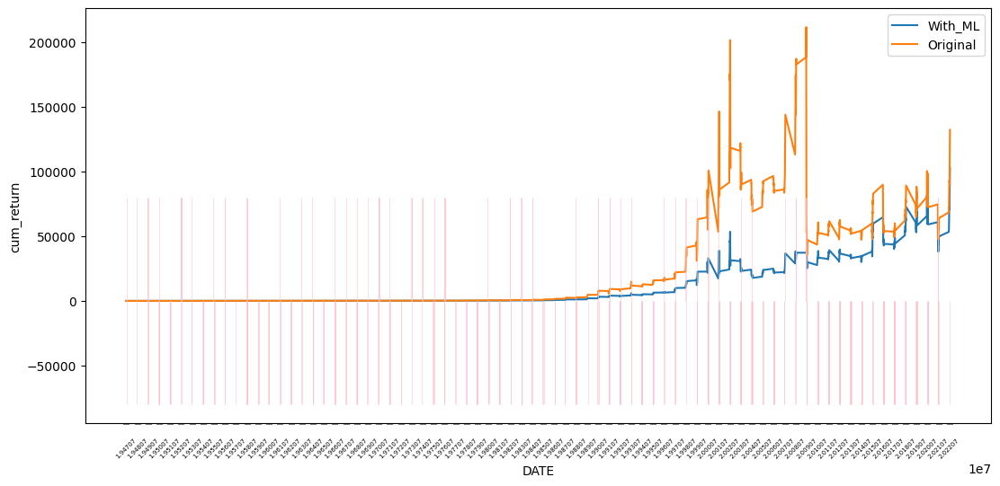

In [56]:
GBC_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_GBC_Result,
                                                 WML,
                                                 'GBC_PRED_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.74997

최근 누적 수익률

  2022년-12월 -> 8076.59
  2022년-11월 -> 7591.64
  2022년-10월 -> 7389.32
  2022년-09월 -> 6715.40
  2022년-08월 -> 6357.90

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 8076.59
  2등 : 2022년-11월 -> 7591.64
  3등 : 2022년-10월 -> 7389.32
  4등 : 2020년-03월 -> 6908.89
  5등 : 2020년-09월 -> 6866.44
  6등 : 2020년-10월 -> 6852.52
  7등 : 2020년-08월 -> 6833.79
  8등 : 2022년-09월 -> 6715.40
  9등 : 2022년-07월 -> 6462.25
  10등 : 2002년-09월 -> 6420.47



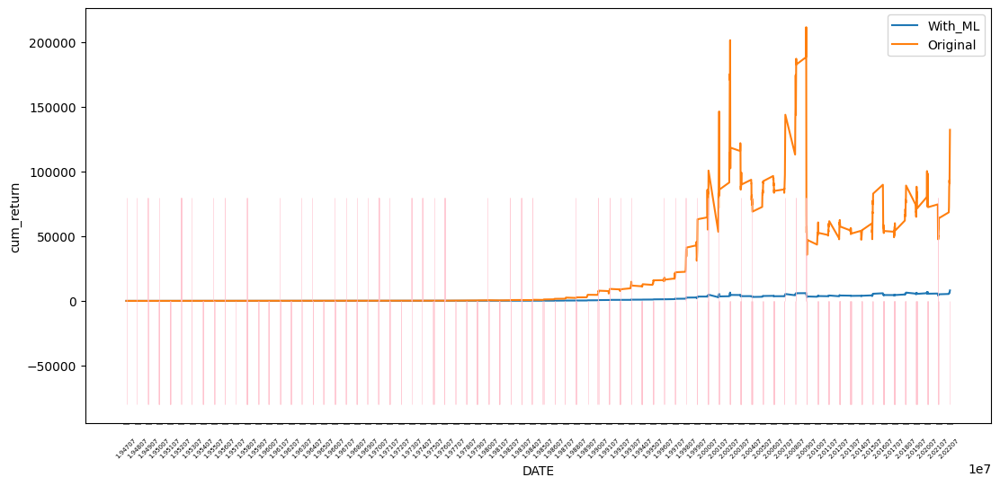

In [57]:
GBC_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_GBC_Result,
                                                  WML,
                                                  'GBC_PROB_POS_WML',
                                                  GBC_A0_P1,
                                                  GBC_A1_P0,
                                                  plot=True)

### XGB

In [58]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

**************************************************

XGB Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : No

  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.22      0.28       316
         1.0       0.65      0.78      0.71       590

    accuracy                           0.59       906
   macro avg       0.51      0.50      0.49       906
weighted avg       0.55      0.59      0.56       906


accuracy : 0.5894039735099338

precision : 0.653954802259887

recall : 0.7847457627118644

F1-Score : 0.7134052388289676



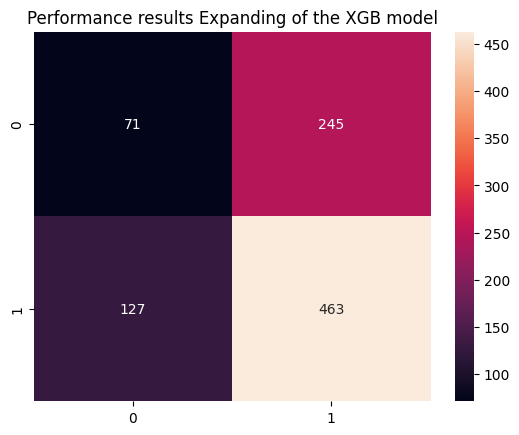


Feature Importance of the model



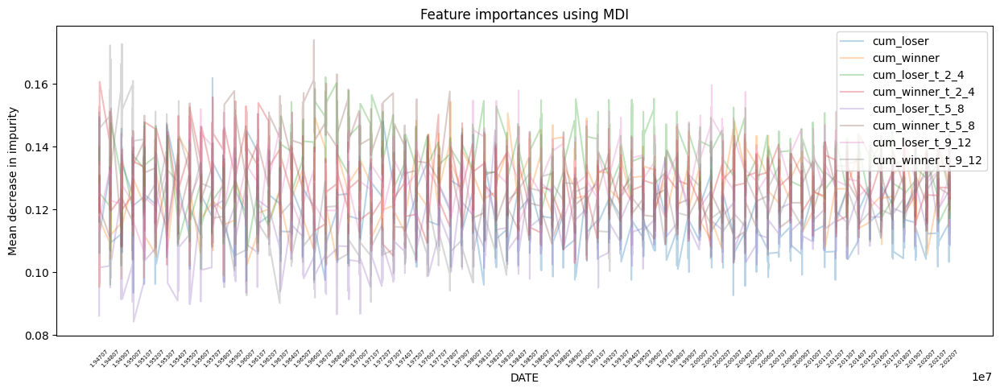

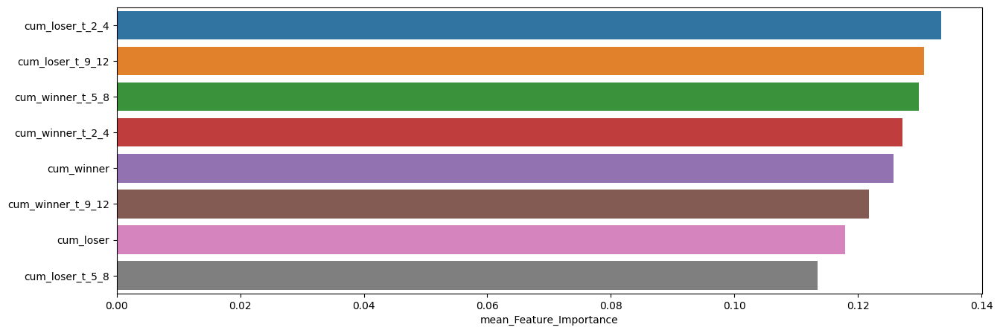

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_2_4,0.133424,0.162228,0.096041
cum_loser_t_9_12,0.130654,0.159681,0.104483
cum_winner_t_5_8,0.129818,0.174057,0.103147
cum_winner_t_2_4,0.127208,0.160788,0.102378
cum_winner,0.125764,0.154337,0.095252
cum_winner_t_9_12,0.121809,0.172806,0.090158
cum_loser,0.117856,0.161941,0.092613
cum_loser_t_5_8,0.113468,0.145223,0.084191


In [59]:
Expanding_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB, # 사용할 모델
                                  model_name='XGB', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.32      0.35        75
         1.0       0.69      0.75      0.72       151

    accuracy                           0.61       226
   macro avg       0.54      0.54      0.54       226
weighted avg       0.59      0.61      0.60       226


accuracy : 0.6106194690265486

precision : 0.6909090909090909

recall : 0.7549668874172185

F1-Score : 0.7215189873417722



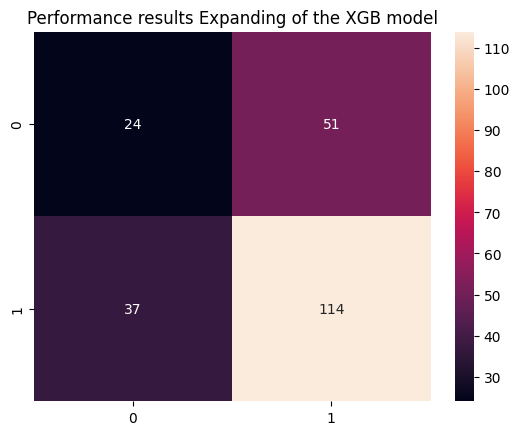


Feature Importance of the model



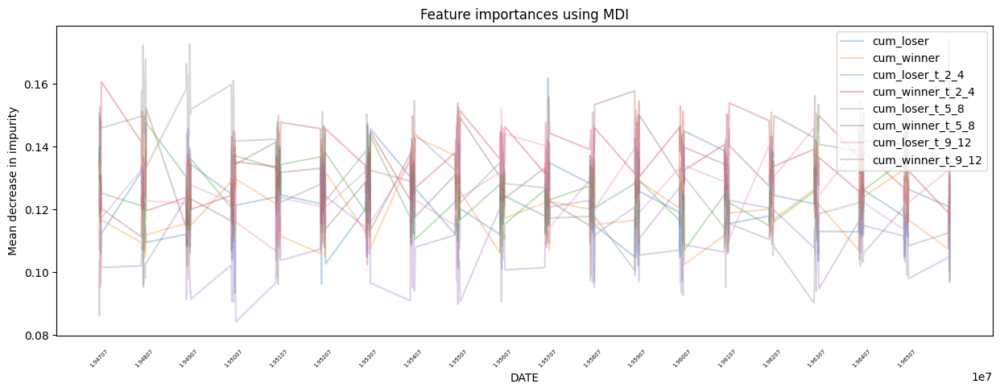

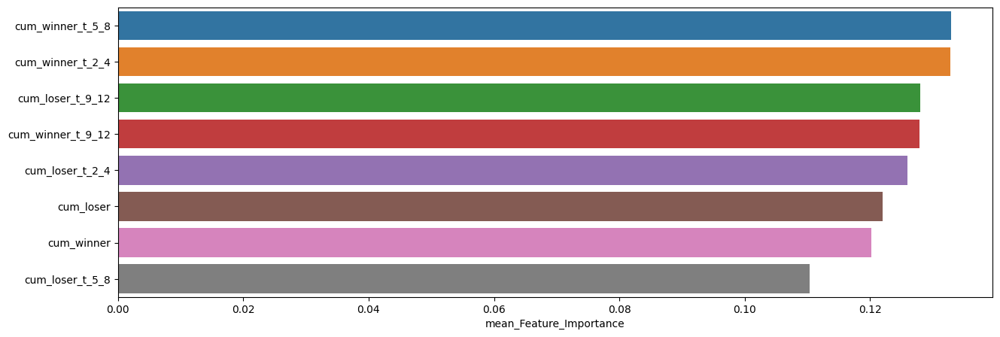

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.132879,0.174057,0.103943
cum_winner_t_2_4,0.132799,0.160788,0.102378
cum_loser_t_9_12,0.127935,0.152027,0.104483
cum_winner_t_9_12,0.127830,0.172806,0.090158
cum_loser_t_2_4,0.125957,0.154328,0.096041
cum_loser,0.122008,0.161941,0.093371
cum_winner,0.120192,0.144157,0.095252
cum_loser_t_5_8,0.110400,0.138079,0.084191



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.31      0.23      0.26        75
         1.0       0.66      0.75      0.71       151

    accuracy                           0.58       226
   macro avg       0.49      0.49      0.48       226
weighted avg       0.55      0.58      0.56       226


accuracy : 0.5796460176991151

precision : 0.6627906976744186

recall : 0.7549668874172185

F1-Score : 0.7058823529411764



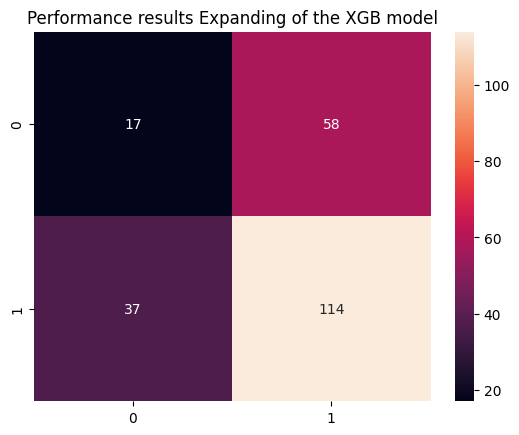


Feature Importance of the model



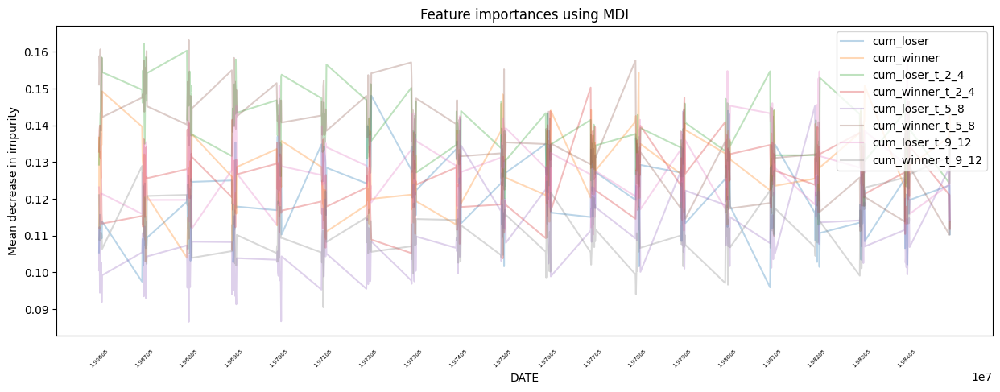

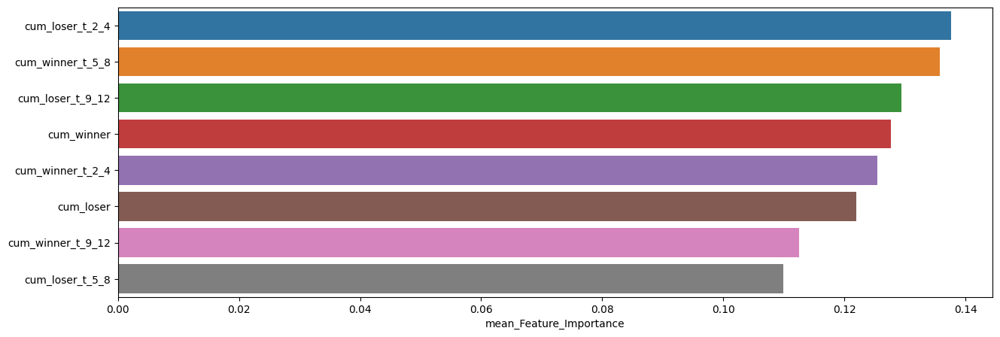

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_2_4,0.137568,0.162228,0.112962
cum_winner_t_5_8,0.135703,0.163176,0.109461
cum_loser_t_9_12,0.129366,0.158004,0.110324
cum_winner,0.127683,0.154337,0.102901
cum_winner_t_2_4,0.125376,0.150272,0.103805
cum_loser,0.121899,0.148074,0.095930
cum_winner_t_9_12,0.112453,0.140333,0.090478
cum_loser_t_5_8,0.109952,0.145223,0.086560



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.14      0.20        70
         1.0       0.69      0.87      0.77       156

    accuracy                           0.65       226
   macro avg       0.51      0.51      0.49       226
weighted avg       0.58      0.65      0.60       226


accuracy : 0.6460176991150443

precision : 0.6938775510204082

recall : 0.8717948717948718

F1-Score : 0.7727272727272728



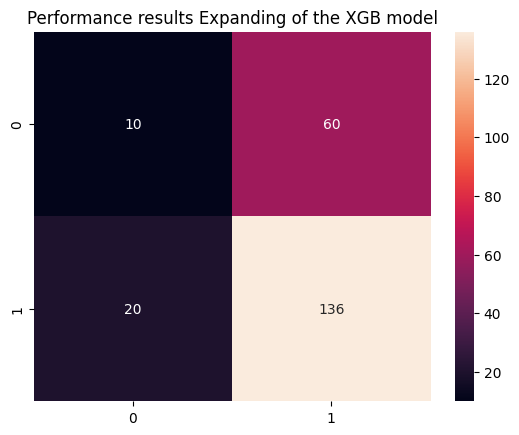


Feature Importance of the model



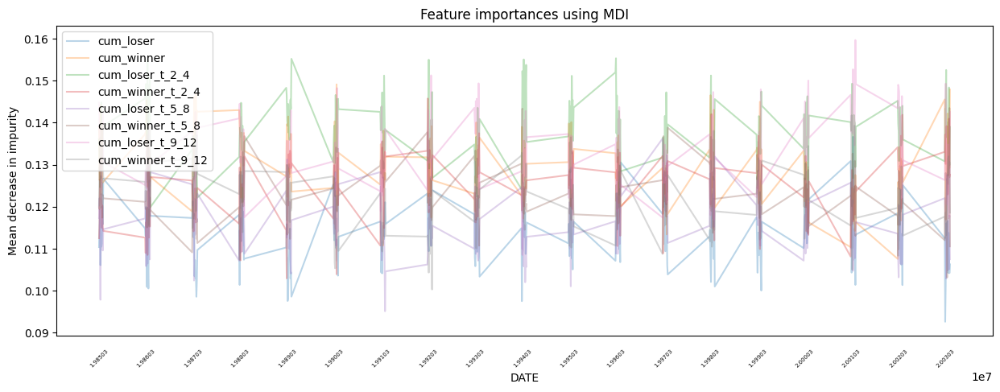

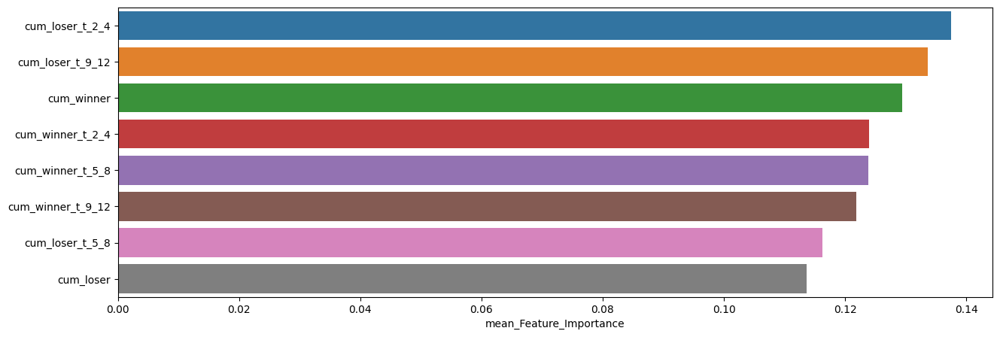

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_2_4,0.137455,0.155343,0.119867
cum_loser_t_9_12,0.133585,0.159681,0.108519
cum_winner,0.129394,0.149119,0.107580
cum_winner_t_2_4,0.123967,0.145766,0.102935
cum_winner_t_5_8,0.123815,0.143497,0.103147
cum_winner_t_9_12,0.121842,0.143817,0.100298
cum_loser_t_5_8,0.116254,0.136220,0.095114
cum_loser,0.113688,0.136649,0.092613



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.21      0.27        96
         1.0       0.57      0.75      0.64       132

    accuracy                           0.52       228
   macro avg       0.47      0.48      0.46       228
weighted avg       0.49      0.52      0.49       228


accuracy : 0.5219298245614035

precision : 0.5657142857142857

recall : 0.75

F1-Score : 0.6449511400651465



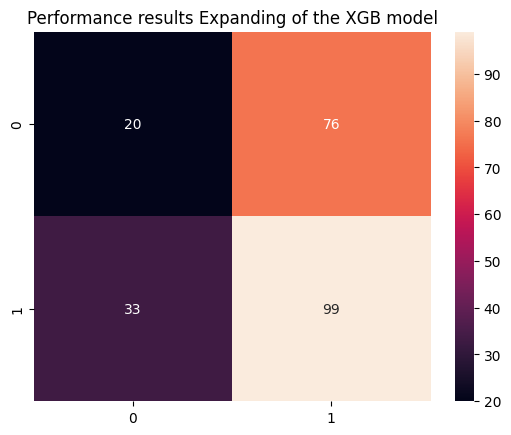


Feature Importance of the model



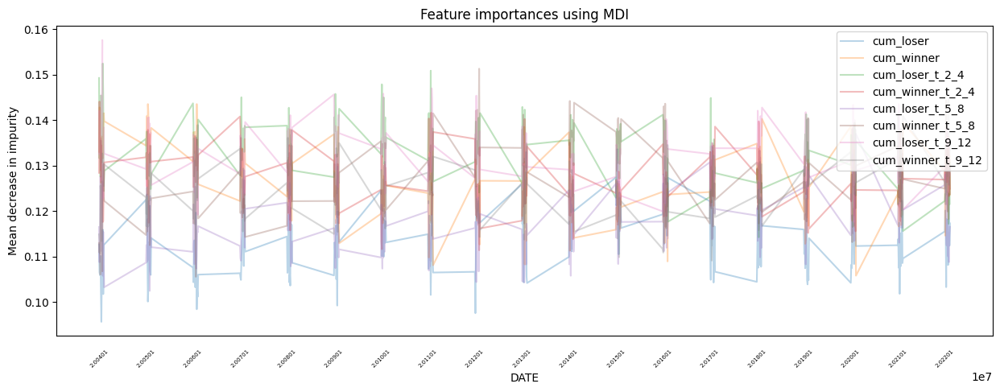

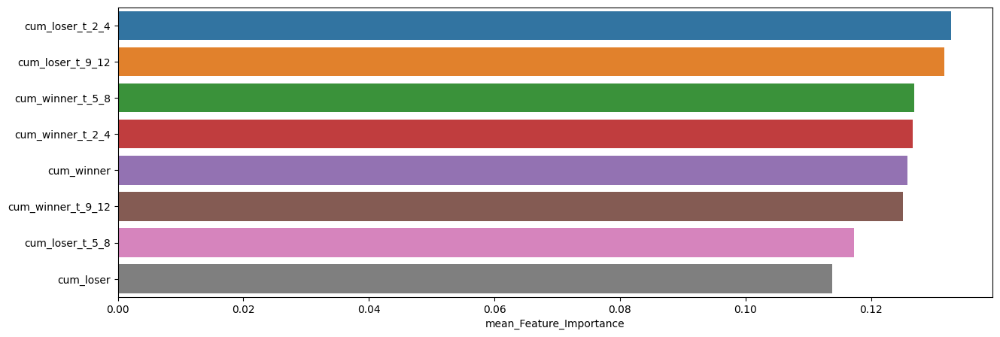

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_2_4,0.132721,0.152408,0.114196
cum_loser_t_9_12,0.131720,0.157553,0.117539
cum_winner_t_5_8,0.126902,0.151268,0.105517
cum_winner_t_2_4,0.126694,0.144049,0.111345
cum_winner,0.125785,0.143494,0.105761
cum_winner_t_9_12,0.125082,0.145248,0.109089
cum_loser_t_5_8,0.117233,0.136910,0.102430
cum_loser,0.113862,0.133574,0.095612


In [60]:
slice_feature_importance(Expanding_XGB_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'XGB') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



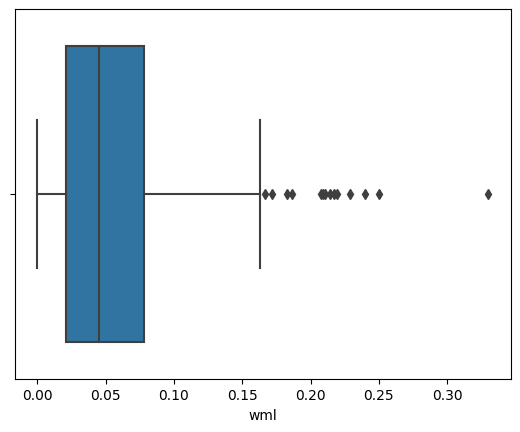

,count,mean,std,min,25%,50%,75%,max
wml,463.0,0.055277,0.046415,0.000007,0.021107,0.045201,0.077958,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



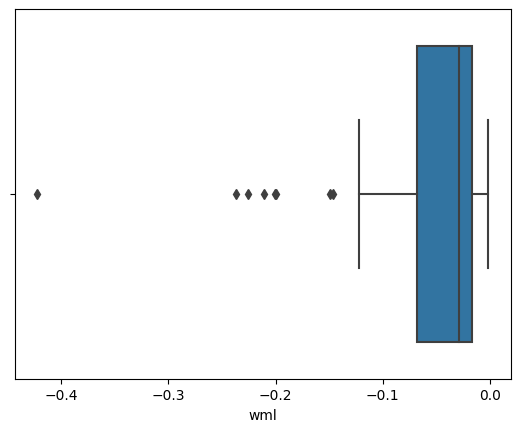

,count,mean,std,min,25%,50%,75%,max
wml,71.0,-0.058558,0.071507,-0.4224,-0.067639,-0.028532,-0.016875,-0.00129



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



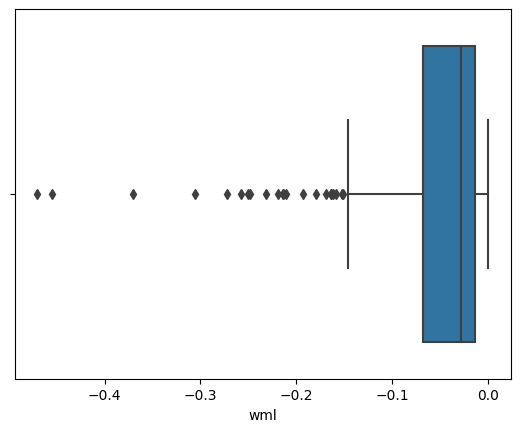

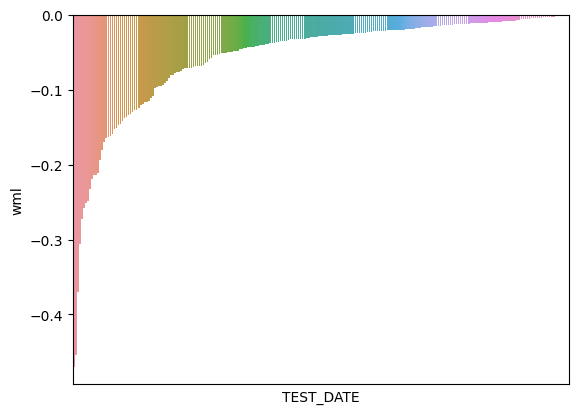

,count,mean,std,min,25%,50%,75%,max
wml,245.0,-0.05566,0.07129,-0.469903,-0.06833,-0.028629,-0.013911,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



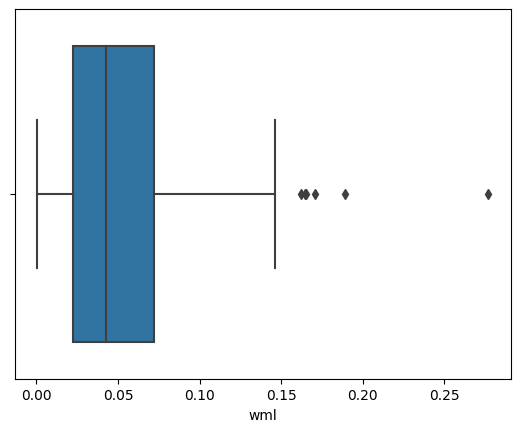

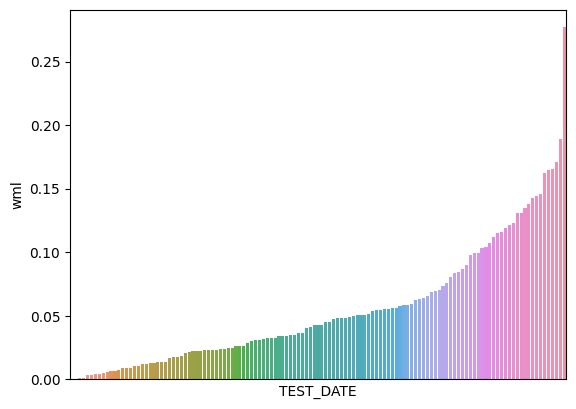

,count,mean,std,min,25%,50%,75%,max
wml,127.0,0.05515,0.048416,0.000577,0.022304,0.042914,0.071831,0.276912


In [61]:
XGB_A0_P1, XGB_A1_P0 = What_Pred(Expanding_XGB_Result, WML, 'XGB')

Sharpe Ratio : 0.75342

최근 누적 수익률

  2022년-12월 -> 15110.47
  2022년-11월 -> 13614.17
  2022년-10월 -> 12949.90
  2022년-09월 -> 11466.86
  2022년-08월 -> 10424.99

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 30392.74
  2등 : 2002년-07월 -> 26465.51
  3등 : 2002년-08월 -> 25698.75
  4등 : 2002년-06월 -> 25092.80
  5등 : 2002년-10월 -> 24522.29
  6등 : 2001년-09월 -> 22086.29
  7등 : 2002년-05월 -> 21576.74
  8등 : 2002년-04월 -> 20012.52
  9등 : 2008년-06월 -> 19577.99
  10등 : 2008년-05월 -> 19577.99



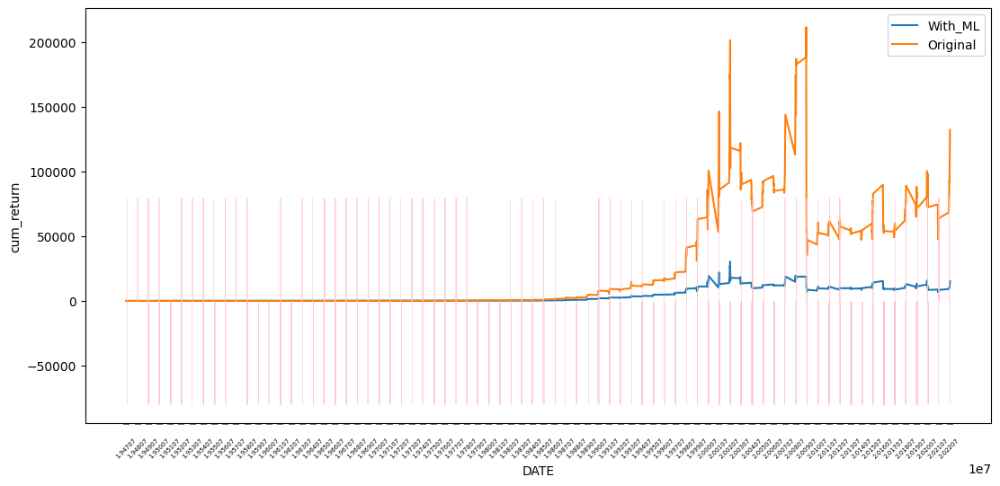

In [62]:
XGB_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_XGB_Result,
                                                 WML,
                                                 'XGB_PRED_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.71349

최근 누적 수익률

  2022년-12월 -> 14800.83
  2022년-11월 -> 13397.76
  2022년-10월 -> 12763.43
  2022년-09월 -> 11332.03
  2022년-08월 -> 10731.96

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 21455.26
  2등 : 2002년-07월 -> 19731.29
  3등 : 2002년-08월 -> 19333.57
  4등 : 2002년-06월 -> 18837.74
  5등 : 2002년-10월 -> 17428.90
  6등 : 2002년-05월 -> 16204.22
  7등 : 2008년-06월 -> 16114.79
  8등 : 2007년-12월 -> 15972.21
  9등 : 2008년-11월 -> 15912.71
  10등 : 2009년-02월 -> 15867.92



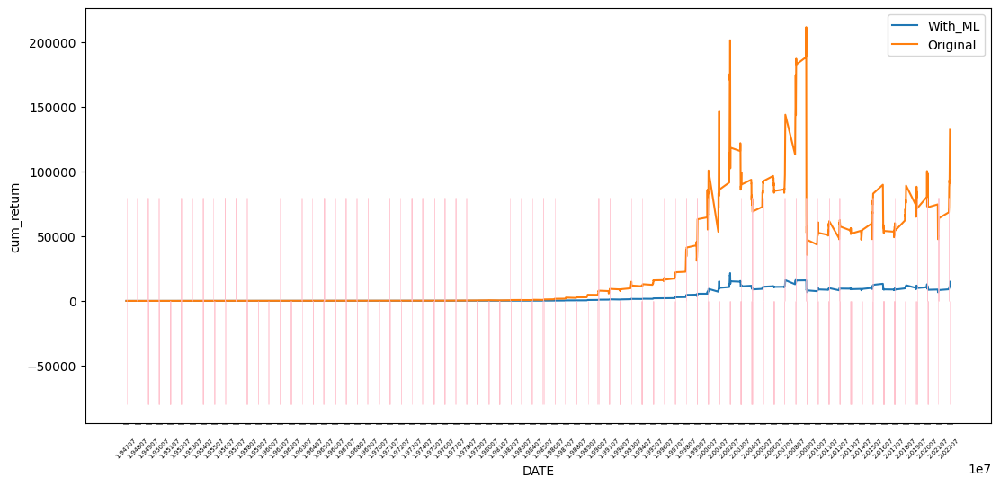

In [63]:
XGB_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_XGB_Result,
                                                 WML,
                                                 'XGB_PROB_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

### LGBM

In [64]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

**************************************************

LGBM Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.20      0.25       316
         1.0       0.65      0.78      0.71       590

    accuracy                           0.58       906
   macro avg       0.49      0.49      0.48       906
weighted avg       0.54      0.58      0.55       906


accuracy : 0.5816777041942605

precision : 0.6475524475524476

recall : 0.7847457627118644

F1-Score : 0.7095785440613027



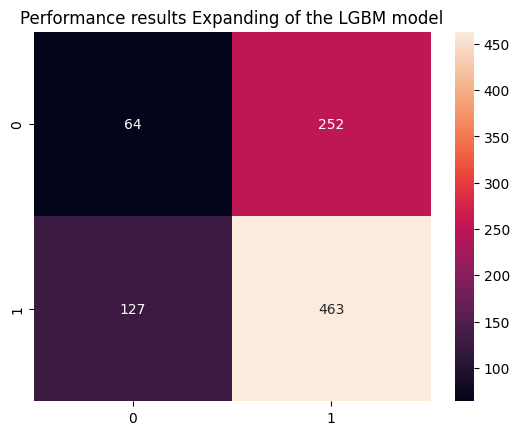


Feature Importance of the model



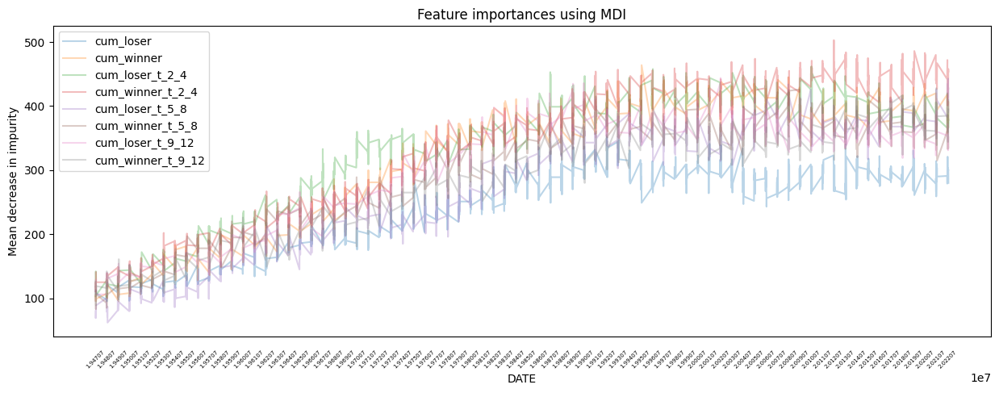

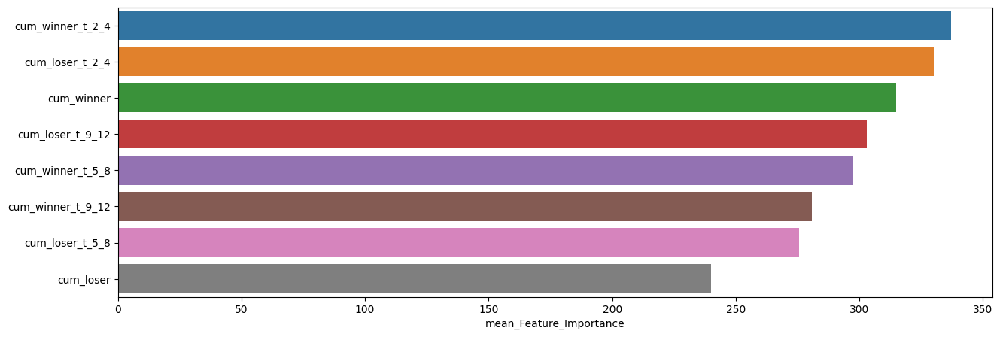

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,337.007726,503,111
cum_loser_t_2_4,330.158940,462,102
cum_winner,314.768212,464,96
cum_loser_t_9_12,302.918322,444,105
cum_winner_t_5_8,297.284768,426,83
cum_winner_t_9_12,280.843267,428,89
cum_loser_t_5_8,275.482340,443,62
cum_loser,239.898455,352,95


In [65]:
Expanding_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM, # 사용할 모델
                                    model_name='LGBM', # 사용한 모델 명
                                    plot=True, # 모델 성능 지표 시각화 여부
                                    plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.29      0.33        75
         1.0       0.68      0.75      0.72       151

    accuracy                           0.60       226
   macro avg       0.53      0.52      0.52       226
weighted avg       0.58      0.60      0.59       226


accuracy : 0.6017699115044248

precision : 0.6826347305389222

recall : 0.7549668874172185

F1-Score : 0.7169811320754716



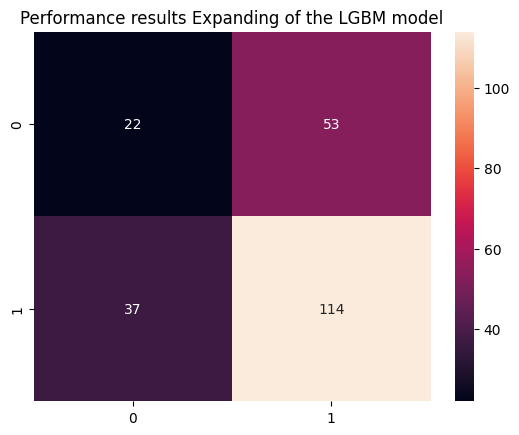


Feature Importance of the model



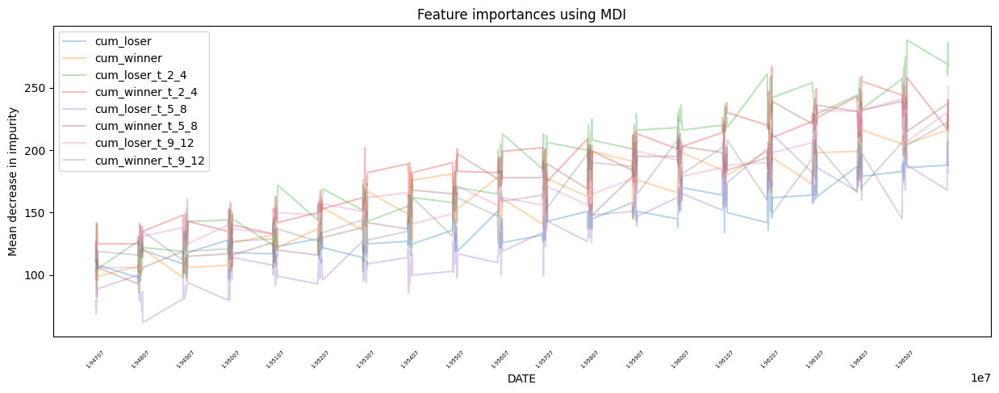

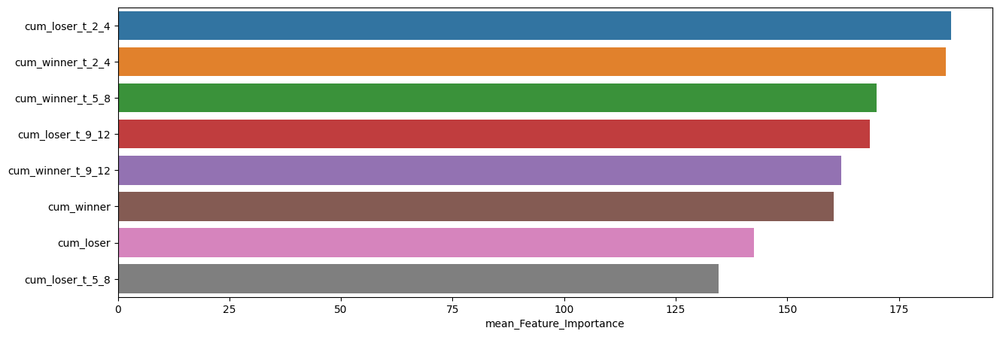

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_2_4,186.672566,288,102
cum_winner_t_2_4,185.615044,267,111
cum_winner_t_5_8,170.000000,249,83
cum_loser_t_9_12,168.451327,266,105
cum_winner_t_9_12,162.030973,228,89
cum_winner,160.411504,229,96
cum_loser,142.615044,214,95
cum_loser_t_5_8,134.690265,213,62



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.25      0.19      0.22        75
         1.0       0.64      0.73      0.68       151

    accuracy                           0.55       226
   macro avg       0.45      0.46      0.45       226
weighted avg       0.51      0.55      0.53       226


accuracy : 0.5486725663716814

precision : 0.6432748538011696

recall : 0.7284768211920529

F1-Score : 0.6832298136645963



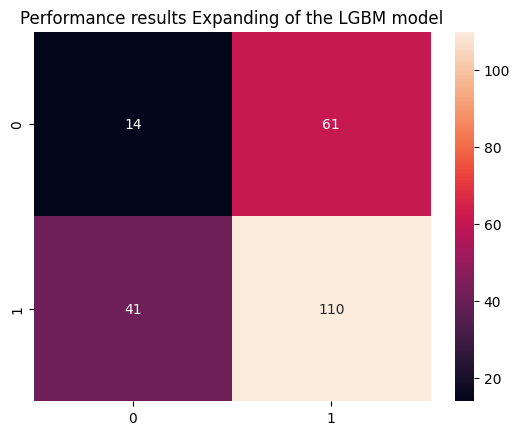


Feature Importance of the model



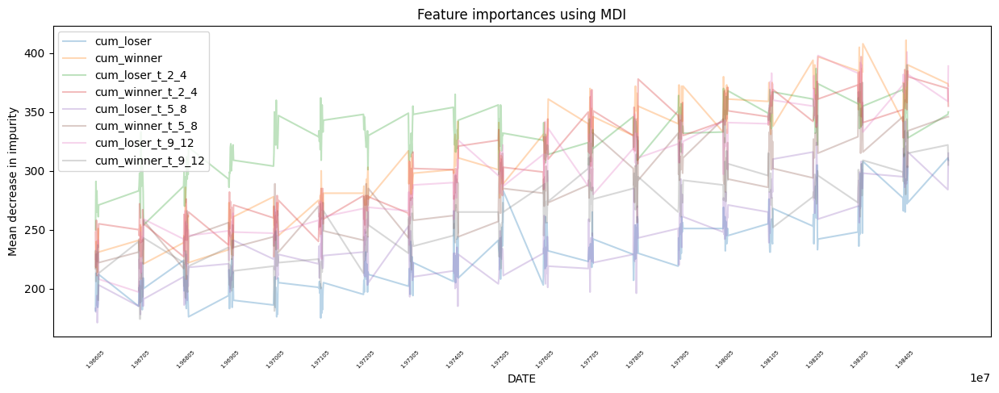

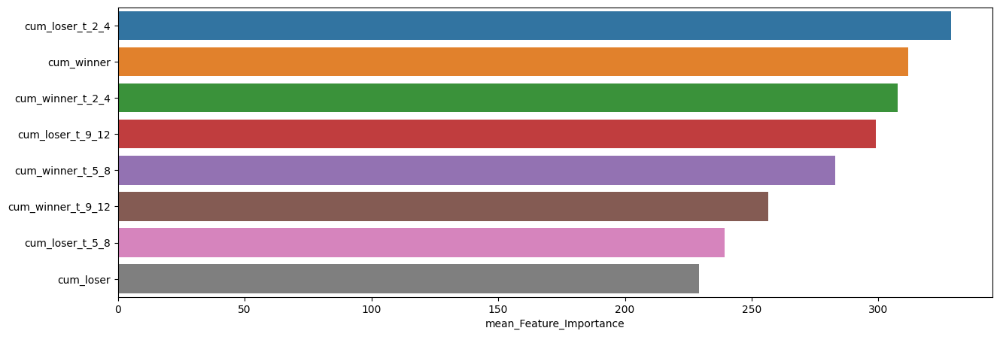

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_2_4,328.561947,390,250
cum_winner,311.725664,411,208
cum_winner_t_2_4,307.592920,397,211
cum_loser_t_9_12,298.876106,401,197
cum_winner_t_5_8,282.800885,375,208
cum_winner_t_9_12,256.615044,333,174
cum_loser_t_5_8,239.238938,342,171
cum_loser,229.296460,314,175



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.17      0.23        70
         1.0       0.70      0.87      0.77       156

    accuracy                           0.65       226
   macro avg       0.53      0.52      0.50       226
weighted avg       0.60      0.65      0.61       226


accuracy : 0.6504424778761062

precision : 0.6994818652849741

recall : 0.8653846153846154

F1-Score : 0.7736389684813755



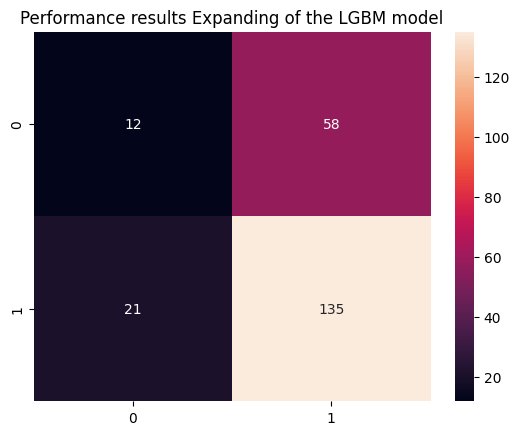


Feature Importance of the model



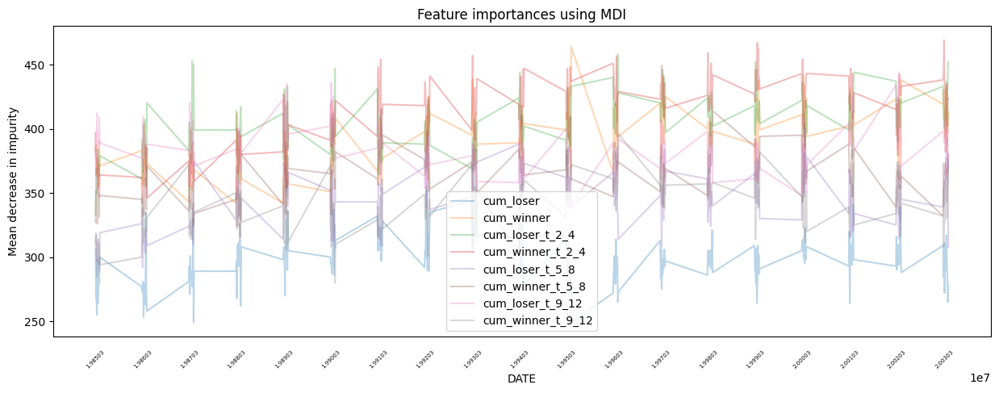

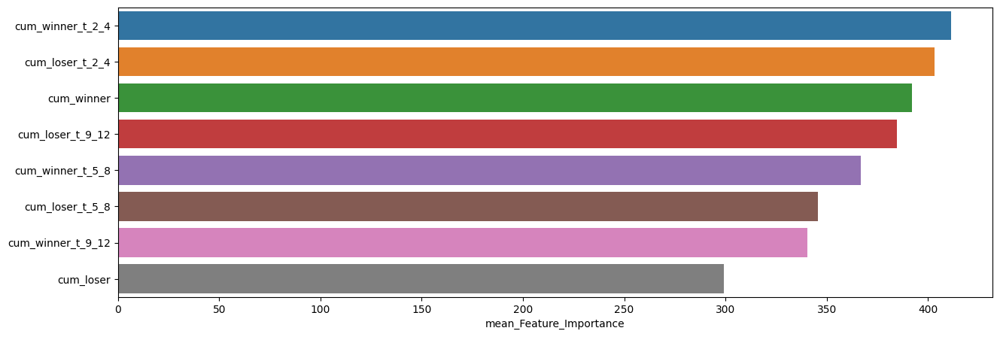

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,411.261062,469,342
cum_loser_t_2_4,403.185841,458,333
cum_winner,391.942478,464,341
cum_loser_t_9_12,384.681416,444,338
cum_winner_t_5_8,366.606195,415,316
cum_loser_t_5_8,345.438053,400,289
cum_winner_t_9_12,340.411504,396,280
cum_loser,299.225664,352,249



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.17      0.23        96
         1.0       0.57      0.79      0.66       132

    accuracy                           0.53       228
   macro avg       0.46      0.48      0.44       228
weighted avg       0.48      0.53      0.48       228


accuracy : 0.5263157894736842

precision : 0.5652173913043478

recall : 0.7878787878787878

F1-Score : 0.6582278481012658



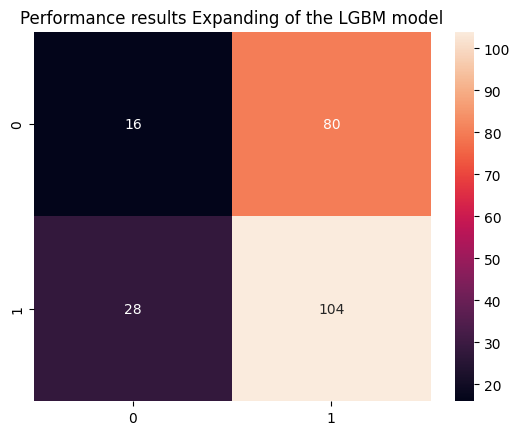


Feature Importance of the model



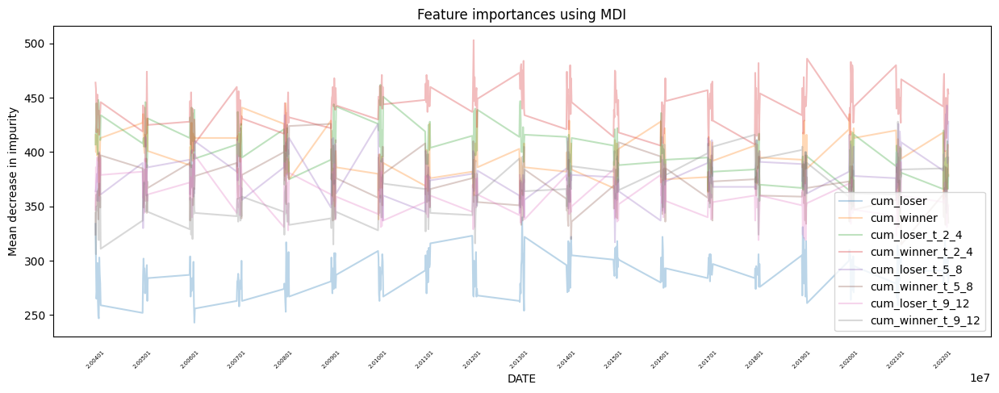

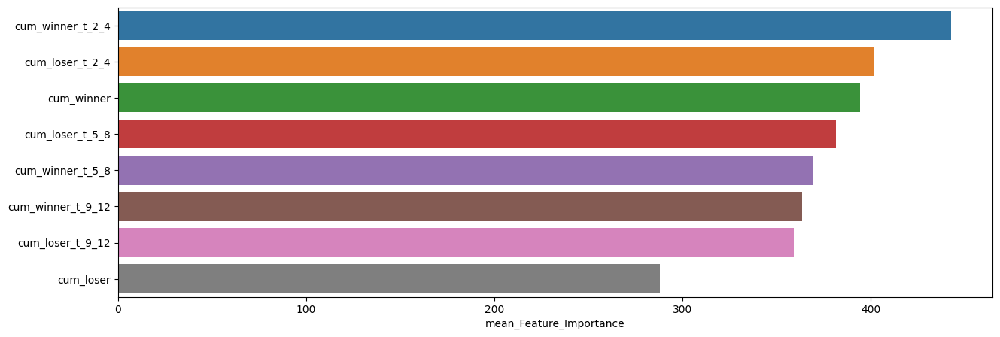

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,442.627193,503,399
cum_loser_t_2_4,401.583333,462,339
cum_winner,394.289474,445,338
cum_loser_t_5_8,381.622807,443,317
cum_winner_t_5_8,369.096491,426,315
cum_winner_t_9_12,363.583333,428,306
cum_loser_t_9_12,359.166667,399,319
cum_loser,288.030702,340,243


In [66]:
slice_feature_importance(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                        4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                        'Expanding', # Rolling Windows Method
                        'LGBM') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



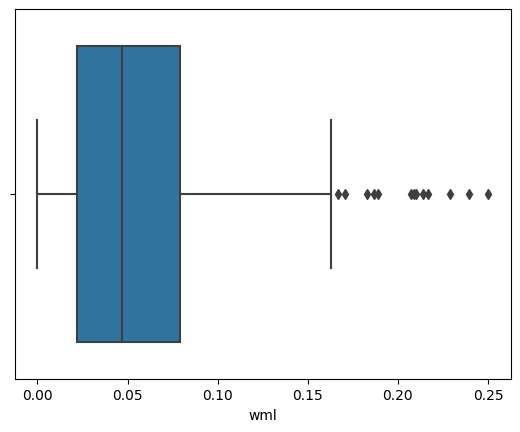

,count,mean,std,min,25%,50%,75%,max
wml,463.0,0.055742,0.044958,0.000007,0.021926,0.047069,0.079025,0.250175



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



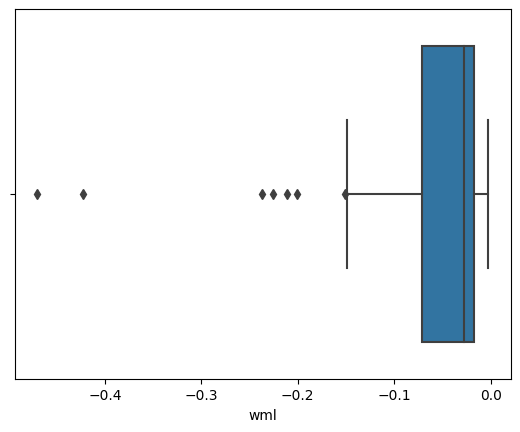

,count,mean,std,min,25%,50%,75%,max
wml,64.0,-0.064824,0.089796,-0.469903,-0.070866,-0.027298,-0.017561,-0.002454



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



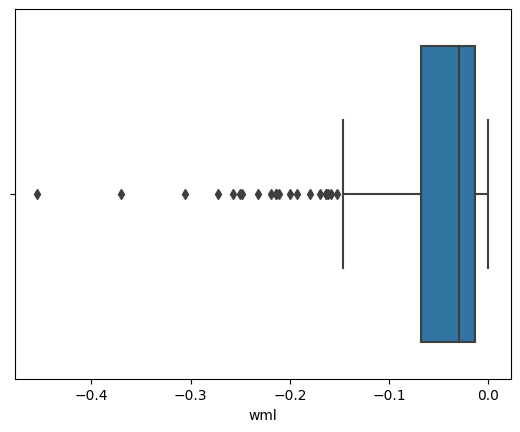

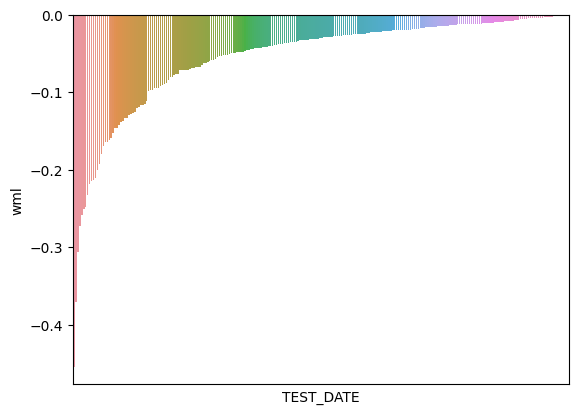

,count,mean,std,min,25%,50%,75%,max
wml,252.0,-0.054149,0.065737,-0.454349,-0.067694,-0.029755,-0.013899,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



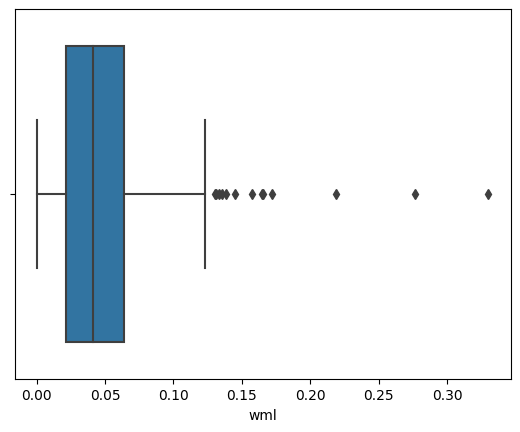

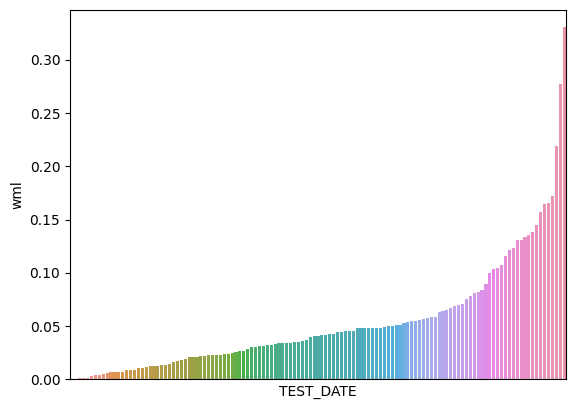

,count,mean,std,min,25%,50%,75%,max
wml,127.0,0.053456,0.05318,0.000627,0.021235,0.041081,0.063759,0.330163


In [67]:
LGBM_A0_P1, LGBM_A1_P0 = What_Pred(Expanding_LGBM_Result,
                                   WML,
                                   'LGBM')

Sharpe Ratio : 0.71223

최근 누적 수익률

  2022년-12월 -> 21600.88
  2022년-11월 -> 19461.92
  2022년-10월 -> 18512.34
  2022년-09월 -> 16392.33
  2022년-08월 -> 14902.98

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 43900.30
  2등 : 2002년-07월 -> 38227.74
  3등 : 2002년-08월 -> 37120.22
  4등 : 2002년-06월 -> 36244.97
  5등 : 2002년-10월 -> 35420.91
  6등 : 2001년-09월 -> 31902.31
  7등 : 2002년-05월 -> 31166.31
  8등 : 2002년-04월 -> 28906.91
  9등 : 2007년-12월 -> 28823.91
  10등 : 2007년-11월 -> 26760.66



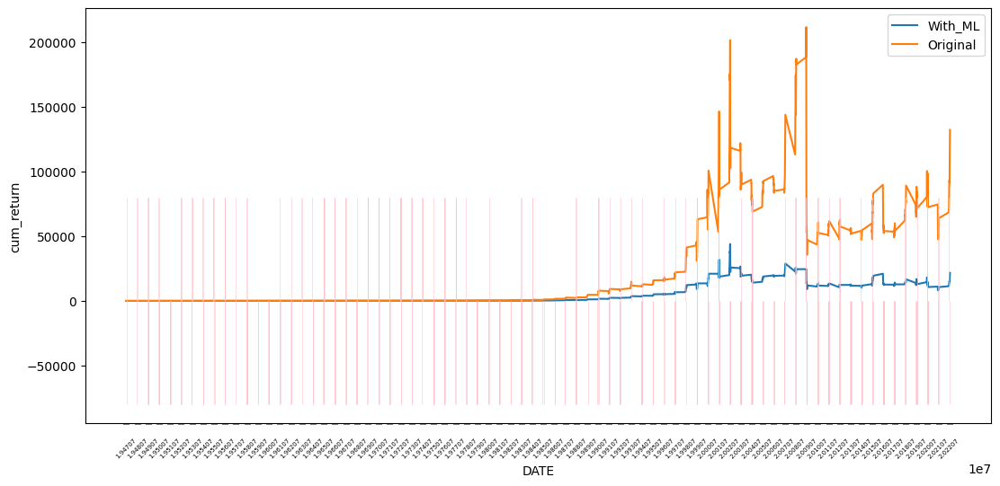

In [68]:
LGBM_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PRED_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

Sharpe Ratio : 0.72522

최근 누적 수익률

  2022년-12월 -> 11687.29
  2022년-11월 -> 10849.30
  2022년-10월 -> 10372.12
  2022년-09월 -> 9266.12
  2022년-08월 -> 8783.90

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 16800.59
  2등 : 2002년-07월 -> 15423.33
  3등 : 2002년-08월 -> 15119.04
  4등 : 2002년-06월 -> 14823.78
  5등 : 2002년-10월 -> 14166.39
  6등 : 2009년-02월 -> 12899.66
  7등 : 2002년-05월 -> 12803.43
  8등 : 2009년-01월 -> 12801.77
  9등 : 2008년-11월 -> 12760.27
  10등 : 2008년-12월 -> 12638.60



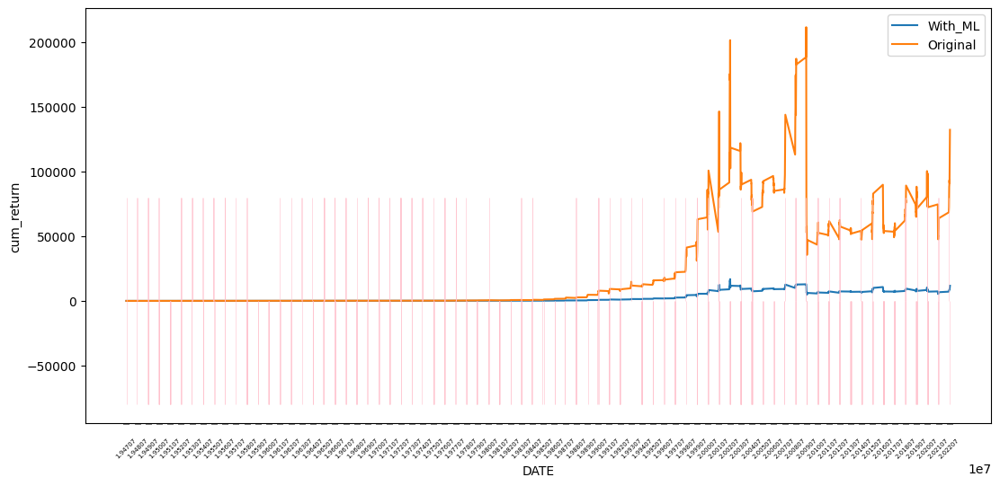

In [69]:
LGBM_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

# Performance

## F1 - Score

RDF의 F1-Score : 0.7243975903614459
GBC의 F1-Score : 0.7241910631741141
XGB의 F1-Score : 0.7090196078431371
LGBM의 F1-Score : 0.6923682140047208



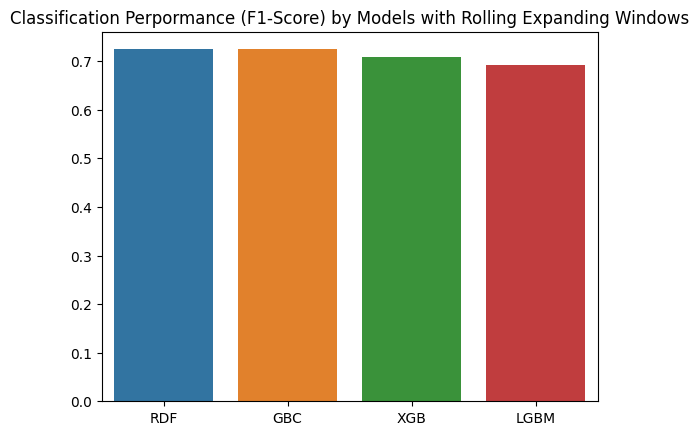

In [70]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'{model}_PRED_POS_WML'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance (F1-Score) by Models with Rolling Expanding Windows')
plt.show()

RDF의 F1-Score : 0.7364568081991215
GBC의 F1-Score : 0.7481804949053857
XGB의 F1-Score : 0.7134052388289676
LGBM의 F1-Score : 0.7095785440613027



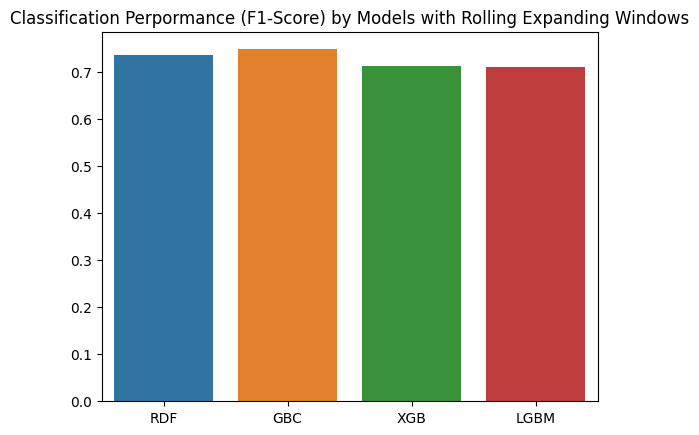

In [71]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'{model}_PRED_POS_WML'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance (F1-Score) by Models with Rolling Expanding Windows')
plt.show()

## Cum Return & Sharpe Ratio

In [72]:
R_WML = WML.loc[19470731:].copy()
CUM_WML = WML.loc[19470731:].copy()

CUM_WML['wml'] = (1 + CUM_WML.wml).cumprod() - 1
CUM_WML.columns = ['cum_return'] 

last_r = CUM_WML['cum_return'].values[-1]
w_S = (R_WML['wml'].mean()/R_WML['wml'].std()) * math.sqrt(12)

In [73]:
def compare_sharpe_ratio(list_model, list_result, list_cum, dynamic=True):

  print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format('ORG', w_S, last_r))

  for model, data, cum in zip(list_model, list_result, list_cum):
    data['wml'] = WML.loc[19470731:]['wml']

    if dynamic == True:

      data[f'{model}_PROB_WML'] = data['wml'] * data[f'{model}_PROB_POS_WML']
      S = (data[f'{model}_PROB_WML'].mean()/data[f'{model}_PROB_WML'].std())*math.sqrt(12)

      C = list(cum['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))

      sns.lineplot(data=cum, x=data.index, y='cum_return', alpha=0.7, label=model)

    else:

      data[f'{model}_PRED_WML'] = data['wml'] * data[f'{model}_PRED_POS_WML']
      S = (data[f'{model}_PRED_WML'].mean()/data[f'{model}_PRED_WML'].std())*math.sqrt(12)

      C = list(cum['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))
      
      sns.lineplot(data=cum, x=data.index, y='cum_return', alpha=0.7, label=model)

  sns.lineplot(data=CUM_WML, x=CUM_WML.index, y='cum_return', alpha=0.7, label='ORG')
  plt.title('Sharpe Ratio & Cum Return by Model')
  plt.xticks([CUM_WML.index[i] for i in range(0,len(CUM_WML.index), 12)])
  plt.tick_params(axis='x',
                    direction='out',
                    labelrotation=45,
                    length=1,
                    pad=10,
                    labelsize=1,
                    width=0.1)
  plt.show()

### Rolling Fixed Windows

#### Static

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.7248  최종 누적 수익률 : 37126.872024308876
GBC Sharpe Ratio : 0.7247  최종 누적 수익률 : 33086.91322148553
XGB Sharpe Ratio : 0.7268  최종 누적 수익률 : 27451.884431570958
LGBM Sharpe Ratio : 0.6115  최종 누적 수익률 : 4699.33922573056


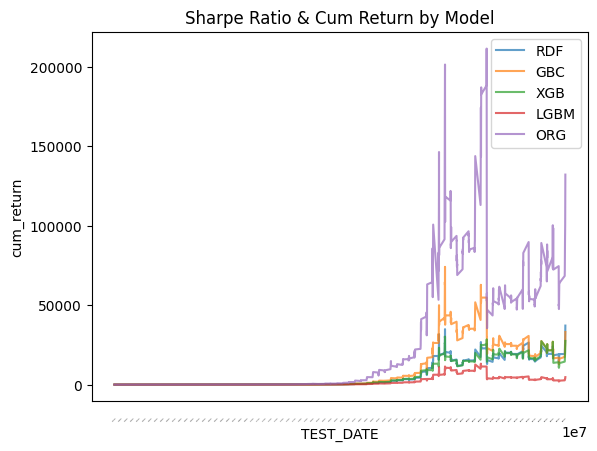

In [74]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result],
                     [RDF_F_CUM_RETURN_static, GBC_F_CUM_RETURN_static, XGB_F_CUM_RETURN_static, LGBM_F_CUM_RETURN_static],
                     dynamic=False)

#### Dynamic

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.7727  최종 누적 수익률 : 6042.29575630946
GBC Sharpe Ratio : 0.7640  최종 누적 수익률 : 10076.010005648131
XGB Sharpe Ratio : 0.7351  최종 누적 수익률 : 12640.14907632199
LGBM Sharpe Ratio : 0.7063  최종 누적 수익률 : 5744.6221232991065


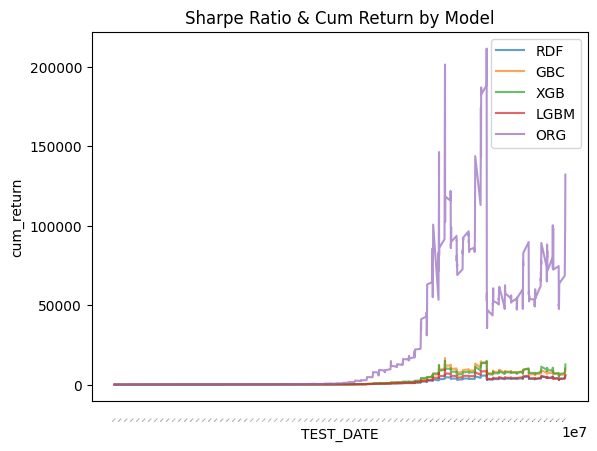

In [81]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result],
                     [RDF_F_CUM_RETURN_dynamic, GBC_F_CUM_RETURN_dynamic, XGB_F_CUM_RETURN_dynamic, LGBM_F_CUM_RETURN_dynamic],
                     dynamic=True)

### Rolling Expanding Windows

#### Static

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.7476  최종 누적 수익률 : 67484.56629552963
GBC Sharpe Ratio : 0.7668  최종 누적 수익률 : 102918.91634349851
XGB Sharpe Ratio : 0.6670  최종 누적 수익률 : 15110.471940406573
LGBM Sharpe Ratio : 0.6967  최종 누적 수익률 : 21600.879222937536


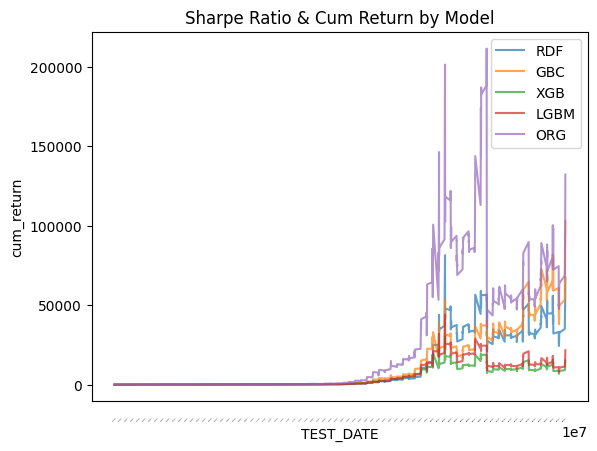

In [76]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result],
                     [RDF_E_CUM_RETURN_static, GBC_E_CUM_RETURN_static, XGB_E_CUM_RETURN_static, LGBM_E_CUM_RETURN_static],
                     dynamic=False)

#### Dynamic

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.7917  최종 누적 수익률 : 7118.820910037595
GBC Sharpe Ratio : 0.7586  최종 누적 수익률 : 8076.592475562604
XGB Sharpe Ratio : 0.7462  최종 누적 수익률 : 14800.83434656518
LGBM Sharpe Ratio : 0.7459  최종 누적 수익률 : 11687.288756094888


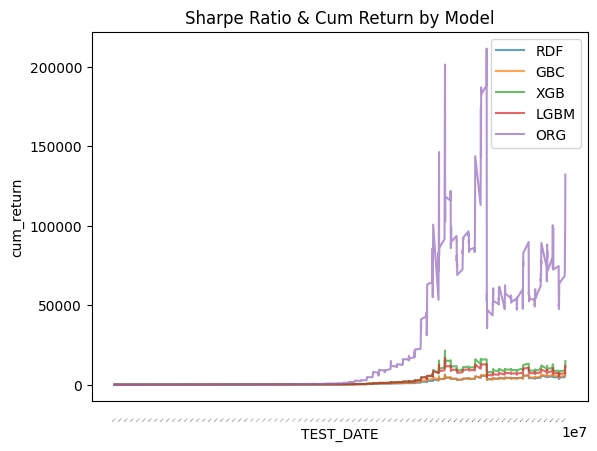

In [82]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result],
                     [RDF_E_CUM_RETURN_dynamic, GBC_E_CUM_RETURN_dynamic, XGB_E_CUM_RETURN_dynamic, LGBM_E_CUM_RETURN_dynamic],
                     dynamic=True)